# Key factors affecting coral health, density, and species richness

In [2]:
import pandas as pd
import os

input_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_SCOR_RawData_2023.csv"

output_folder = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed"
output_file = os.path.join(output_folder, "aggregated_scor_rawdata.csv")

os.makedirs(output_folder, exist_ok=True)

df_raw = pd.read_csv(input_path)

agg_df = df_raw.groupby(['Year', 'StationID']).agg({
    'LTA_cm2': 'mean',
    'Height_cm': 'mean',
    'Diameter_cm': 'mean',
    'Percent_old_mortality': 'mean',
    'Percent_recent_mortality': 'mean'
}).reset_index()

agg_df.rename(columns={
    'LTA_cm2': 'Avg_LTA_cm2',
    'Height_cm': 'Avg_Height_cm',
    'Diameter_cm': 'Avg_Diameter_cm',
    'Percent_old_mortality': 'Avg_Old_Mortality',
    'Percent_recent_mortality': 'Avg_Recent_Mortality'
}, inplace=True)

agg_df.to_csv(output_file, index=False)


In [5]:
import pandas as pd
import os

input_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_SCOR_Summaries_2023_ConditionCounts.csv"
df = pd.read_csv(input_path)

numeric_cols = ['Count', 'BLH', 'PBL', 'PAL', 'BBD', 'WBD', 'WPX', 'WPL', 'DSD', 'SCT', 'RTL', 'RBD', 'YBD', 'UNK']

agg_df = df.groupby(['Year', 'StationID'])[numeric_cols].sum().reset_index()

output_dir = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed"
os.makedirs(output_dir, exist_ok=True)

output_path = os.path.join(output_dir, "aggregated_scor_condition_counts.csv")
agg_df.to_csv(output_path, index=False)



In [6]:
import pandas as pd
import os

file_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_SCOR_Summaries_2023_Counts.csv"
df = pd.read_csv(file_path)

agg_df = df.groupby(['Year', 'StationID']).sum(numeric_only=True).reset_index()

output_dir = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed"
os.makedirs(output_dir, exist_ok=True)

output_path = os.path.join(output_dir, "aggregated_scor_counts.csv")
agg_df.to_csv(output_path, index=False)



In [7]:
import pandas as pd
import os

file_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_SCOR_Summaries_2023_Density_CLEANED.csv"
df = pd.read_csv(file_path)

agg_df = df.groupby(['Year', 'StationID']).mean(numeric_only=True).reset_index()

output_dir = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed"
os.makedirs(output_dir, exist_ok=True)

output_path = os.path.join(output_dir, "aggregated_scor_density.csv")
agg_df.to_csv(output_path, index=False)



In [8]:
import pandas as pd
import os

file_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_SCOR_Summaries_2023_LTA_CLEANED.csv"
df = pd.read_csv(file_path)

agg_df = df.groupby(['Year', 'StationID']).mean(numeric_only=True).reset_index()

output_dir = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed"
os.makedirs(output_dir, exist_ok=True)

output_path = os.path.join(output_dir, "aggregated_scor_lta.csv")
agg_df.to_csv(output_path, index=False)




In [10]:
import pandas as pd

df_raw = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_scor_rawdata.csv")
df_condition = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_scor_condition_counts.csv")
df_counts = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_scor_counts.csv")
df_density = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_scor_density.csv")
df_lta = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_scor_lta.csv")

df_counts = df_counts.drop(columns=['SiteID'], errors='ignore')
df_density = df_density.drop(columns=['SiteID'], errors='ignore')
df_lta = df_lta.drop(columns=['SiteID'], errors='ignore')

df_merged = df_raw \
    .merge(df_condition, on=["Year", "StationID"], how="outer") \
    .merge(df_counts, on=["Year", "StationID"], how="outer") \
    .merge(df_density, on=["Year", "StationID"], how="outer", suffixes=('', '_density')) \
    .merge(df_lta, on=["Year", "StationID"], how="outer", suffixes=('', '_lta'))

df_merged.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_final.csv", index=False)


In [12]:
import pandas as pd

merged_df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_final.csv")

stations_df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_Stations_2023.csv")

stations_selected = stations_df[['StationID', 'SiteID', 'Site_name', 'Habitat', 'Subregion',
                                 'length_m', 'Depth_ft', 'latDD', 'lonDD', 'latDeg', 'latMin', 'lonDeg', 'lonMin']]

stations_selected = stations_selected.drop_duplicates(subset=['StationID'])

merged_with_coords = pd.merge(merged_df, stations_selected, on='StationID', how='left')

merged_with_coords.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_with_coords.csv", index=False)



In [13]:
import pandas as pd

merged_df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_with_coords.csv")

temp_df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_Temperatures_2023.csv")

agg_temp = temp_df.groupby(['SiteID', 'Site_name', 'Year']).agg(
    Avg_Temp_C=('TempC', 'mean'),
    Max_Temp_C=('TempC', 'max'),
    Min_Temp_C=('TempC', 'min')
).reset_index()

merged_with_temp = pd.merge(merged_df, agg_temp, on=['SiteID', 'Site_name', 'Year'], how='left')

merged_with_temp.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_with_coords_temp.csv", index=False)



In [1]:
import pandas as pd

df_raw = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_OCTO_RawData_2023.csv")

agg_raw = df_raw.groupby(['Year', 'StationID'], as_index=False)['Height_cm'].mean()
agg_raw.rename(columns={'Height_cm': 'Avg_OCTO_Height'}, inplace=True)

agg_raw.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_octo_rawdata.csv", index=False)


In [3]:
import pandas as pd

df_density = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_OCTO_Summaries_2023_Density_CLEANED.csv")

numerice = df_density.select_dtypes(include='number').columns.tolist()

if 'Year' not in numerice:
    numerice.append('Year')
if 'StationID' not in numerice:
    numerice.append('StationID')

agg_density = df_density[numerice].groupby(['Year', 'StationID'], as_index=False).mean()

agg_density.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_octo_density.csv", index=False)


In [5]:
import pandas as pd

df_height = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_OCTO_Summaries_2023_MeanHeight.csv")

numeric_cols = df_height.select_dtypes(include='number').columns.tolist()

if 'Year' not in numeric_cols:
    numeric_cols.append('Year')
if 'stationid' not in numeric_cols:
    numeric_cols.append('stationid')

agg_height = df_height[numeric_cols].groupby(['Year', 'stationid'], as_index=False).mean()

agg_height.rename(columns={'stationid': 'StationID'}, inplace=True)

agg_height.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_octo_meanheight.csv", index=False)


In [6]:
raw = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_octo_rawdata.csv")
density = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_octo_density.csv")
meanheight = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\aggregated_octo_meanheight.csv")

merged = raw.merge(density, on=['Year', 'StationID'], how='outer')
merged = merged.merge(meanheight, on=['Year', 'StationID'], how='outer')

merged.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_octo_dataset.csv", index=False)


In [7]:
import pandas as pd

df_octo = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_octo_dataset.csv")
df_stations = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Cleaned files\CREMP_Stations_2023.csv")

df_octo["StationID"] = df_octo["StationID"].astype(str)
df_octo["SiteID"] = df_octo["SiteID"].astype(str)
df_stations["StationID"] = df_stations["StationID"].astype(str)
df_stations["SiteID"] = df_stations["SiteID"].astype(str)

columns_to_keep = [
    "Region", "Site_Code", "SiteID", "Site_name", "Habitat", "Subregion", "StationID",
     "length_m", "Depth_ft", "latDD", "lonDD", 
    "latDeg", "latMin", "lonDeg", "lonMin"
]
df_stations = df_stations[columns_to_keep]

df_merged = pd.merge(df_octo, df_stations, on=["StationID", "SiteID"], how="left")

output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_octo_dataset_with_coords.csv"
df_merged.to_csv(output_path, index=False)


# Key factors affecting coral health, density, and species richness. 

# Key Factors Influencing the Health, Density, and Species Richness of Stony Corals

In [14]:
import pandas as pd

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_with_coords_temp.csv")

density_cols = [col for col in df.columns if '_density' in col.lower()]

df['species_richness'] = df[density_cols].gt(0).sum(axis=1)

df['avg_density'] = df[density_cols].mean(axis=1)

df.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_with_coords_temp_richness.csv", index=False)


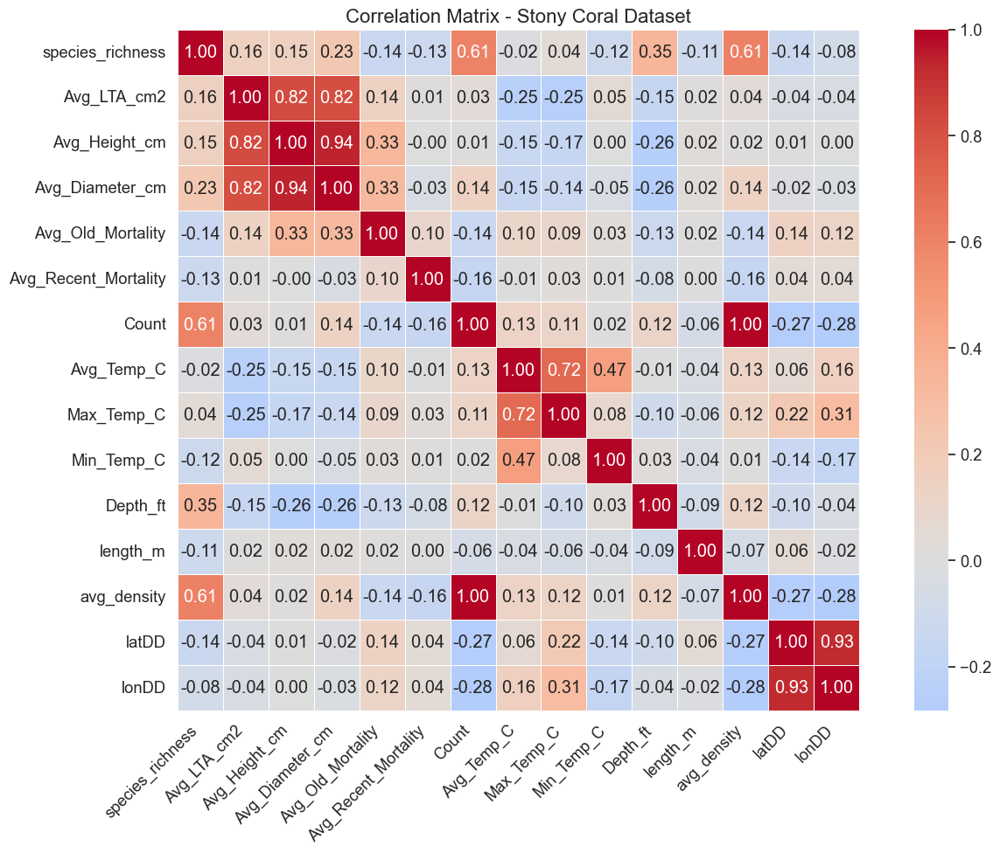

C:\Users\User\AppData\Local\Temp\ipykernel_216836\1829675504.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Figure size 640x480 with 0 Axes>

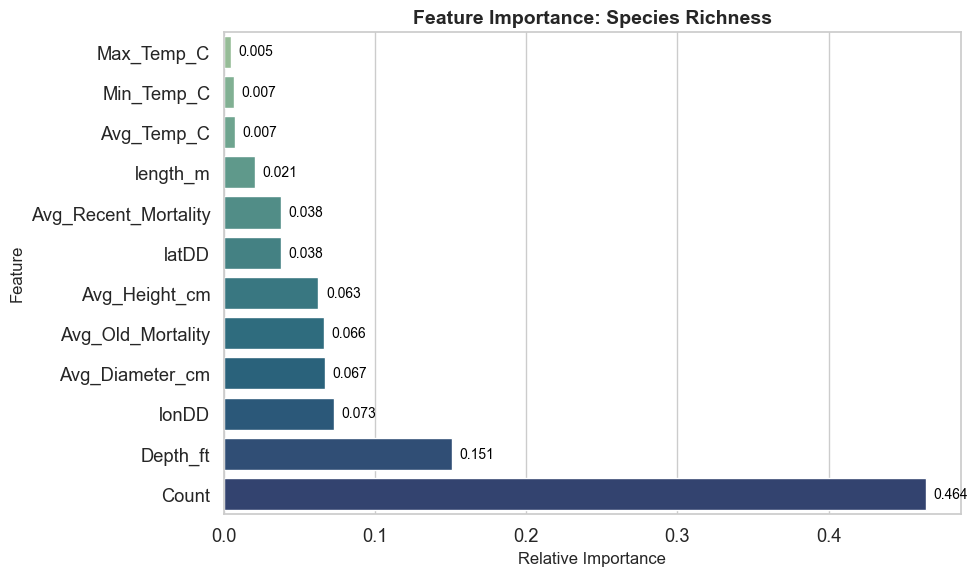

C:\Users\User\AppData\Local\Temp\ipykernel_216836\1829675504.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Figure size 640x480 with 0 Axes>

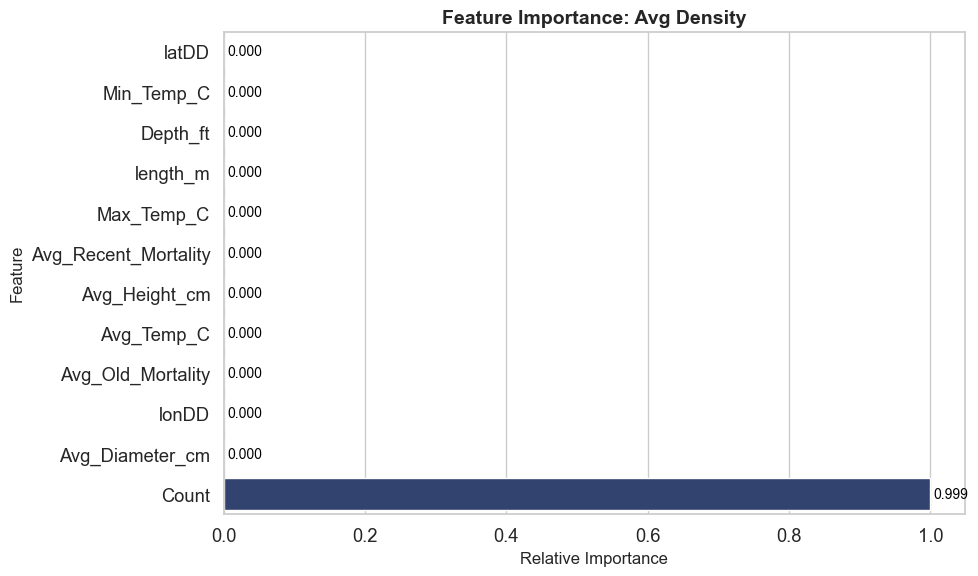

C:\Users\User\AppData\Local\Temp\ipykernel_216836\1829675504.py:86: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Figure size 640x480 with 0 Axes>

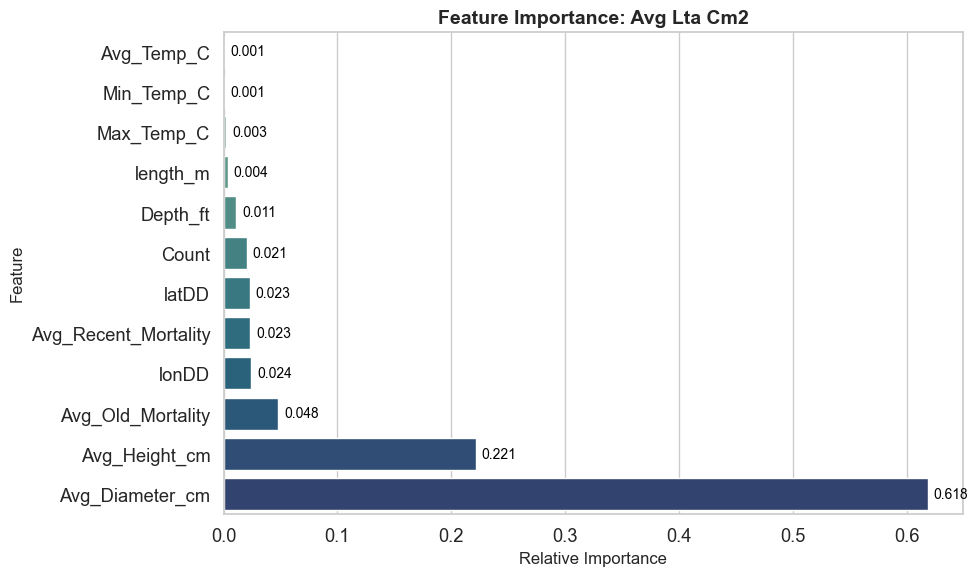

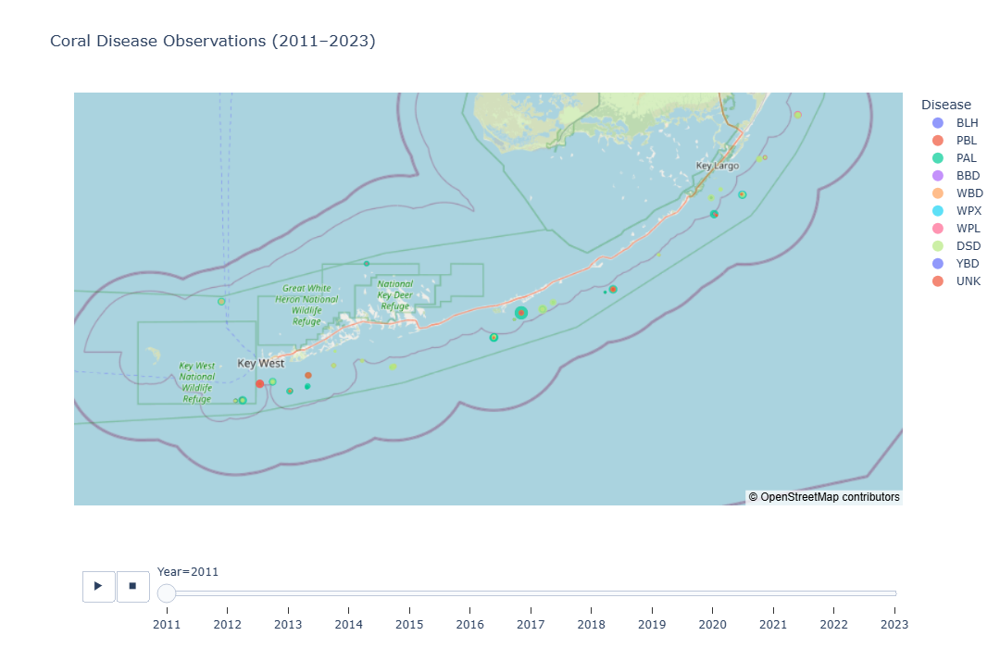

<Figure size 640x480 with 0 Axes>

In [18]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from ipywidgets import widgets, Output, VBox
from IPython.display import display, clear_output
import os


save_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\EDA\Future Outlook"
os.makedirs(save_path, exist_ok=True)  
df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_scor_dataset_with_coords_temp_richness.csv")

correlation_columns = [
    'species_richness',       # target variable: coral diversity
    'Avg_LTA_cm2',            # live tissue area - health indicator
    'Avg_Height_cm',          # coral height - structural development
    'Avg_Diameter_cm',        # coral diameter - maturity indicator
    'Avg_Old_Mortality',      # historical mortality - past stress
    'Avg_Recent_Mortality',   # recent mortality - current health
    'Count',                  # number of individuals
    'Avg_Temp_C',             # average temperature
    'Max_Temp_C',             # max temp - heat stress
    'Min_Temp_C',             # min temp
    'Depth_ft',               # depth - light and temperature influence
    'length_m',               # transect length - sampling effort
    'avg_density',            # average density of coral species
    'latDD',                  # latitude
    'lonDD'                   # longitude
]

available_columns = [col for col in correlation_columns if col in df.columns]

corr_matrix = df[available_columns].corr()

plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix, 
    annot=True, 
    cmap='coolwarm', 
    center=0, 
    fmt=".2f", 
    linewidths=0.5, 
    square=True
)
plt.title("Correlation Matrix - Stony Coral Dataset", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()
plt.savefig(os.path.join(save_path, "correlation_matrix_stonycorals.png"), dpi=300)


features = [
    'Avg_Height_cm', 'Avg_Diameter_cm', 'Avg_Old_Mortality', 'Avg_Recent_Mortality',
    'Count', 'Avg_Temp_C', 'Max_Temp_C', 'Min_Temp_C', 'Depth_ft',
    'length_m', 'latDD', 'lonDD',
]

targets = ['species_richness', 'avg_density', 'Avg_LTA_cm2']

X = df[features].fillna(0)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

sns.set(style='whitegrid', font_scale=1.2)

for target in targets:
    y = df[target].fillna(0)

    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)

    importances = rf.feature_importances_
    feature_importance_df = pd.DataFrame({
        'Feature': features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=True)

    plt.figure(figsize=(10, 6))
    barplot = sns.barplot(
        x='Importance',
        y='Feature',
        data=feature_importance_df,
        palette='crest'
    )

    for i, v in enumerate(feature_importance_df['Importance']):
        barplot.text(v + 0.005, i, f'{v:.3f}', color='black', va='center', fontsize=10)

    plt.title(f'Feature Importance: {target.replace("_", " ").title()}', fontsize=14, weight='bold')
    plt.xlabel('Relative Importance', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.tight_layout()
    plt.show()
    plt.savefig(os.path.join(save_path, f"feature_importance_{target}.png"), dpi=300)

grouped = df.groupby(['Habitat', 'Subregion']).agg({
    'species_richness': 'mean',
    'avg_density': 'mean',
    'Avg_Temp_C': 'mean',
    'Max_Temp_C': 'mean',
    'Min_Temp_C': 'mean',
    'Avg_Old_Mortality': 'mean',
    'Avg_Recent_Mortality': 'mean'
}).reset_index()

grouped['Total_Mortality'] = grouped['Avg_Old_Mortality'] + grouped['Avg_Recent_Mortality']
df_vis = grouped.copy()

metric_options = {
    'Species Richness': 'species_richness',
    'Average Density': 'avg_density',
    'Average Temperature': 'Avg_Temp_C',
    'Total Mortality': 'Total_Mortality'
}

traces = []
visibility_map = []

for metric_name, metric_col in metric_options.items():
    metric_traces = []
    for habitat in df_vis['Habitat'].unique():
        sub_df = df_vis[df_vis['Habitat'] == habitat]
        trace = go.Bar(
            x=sub_df['Subregion'],
            y=sub_df[metric_col],
            name=habitat,
            visible=False  
        )
        traces.append(trace)
        metric_traces.append(len(traces) - 1)  
    visibility_map.append(metric_traces)

fig = go.Figure(data=traces)

for idx in visibility_map[0]:
    fig.data[idx].visible = True

buttons = []
for i, (label, _) in enumerate(metric_options.items()):
    visible_array = [False] * len(traces)
    for idx in visibility_map[i]:
        visible_array[idx] = True
    buttons.append(dict(label=label,
                        method='update',
                        args=[{'visible': visible_array},
                              {'title': f'{label} per Habitat and Subregion'}]))

fig.update_layout(
    updatemenus=[dict(
        type='dropdown',
        direction='down',
        buttons=buttons,
        x=0.01,
        y=1.15,
        showactive=True
    )],
    title="Species Richness per Habitat and Subregion",
    xaxis_title="Subregion",
    yaxis_title="Value",
    barmode='group',
    template='plotly_dark',
    height=600
)

fig.write_html(os.path.join(save_path, "interactive_dropdown_chart.html"))

dropdown.observe(update_chart, names='value')
display(VBox([dropdown, out]))
update_chart(None)

disease_cols = ['BLH', 'PBL', 'PAL', 'BBD', 'WBD', 'WPX', 'WPL', 'DSD', 'SCT', 'RTL', 'RBD', 'YBD', 'UNK']

required_cols = disease_cols + ['Year', 'latDD', 'lonDD', 'Site_name']
missing = [col for col in required_cols if col not in df.columns]
if missing:
    raise ValueError(f"Lipsesc coloanele necesare din dataset: {missing}")

disease_long = df.melt(
    id_vars=['Year', 'latDD', 'lonDD', 'Site_name'],
    value_vars=disease_cols,
    var_name='Disease',
    value_name='Disease_Count'  
)

disease_long = disease_long[(disease_long['Disease_Count'] > 0) & (disease_long['Year'] >= 2011)]

fig = px.scatter_mapbox(
    disease_long,
    lat="latDD",
    lon="lonDD",
    size="Disease_Count",
    color="Disease",
    animation_frame="Year",
    hover_name="Site_name",
    hover_data={"latDD": False, "lonDD": False, "Disease_Count": True},
    size_max=25,
    zoom=8,
    height=700,
    mapbox_style="open-street-map",
    title="Coral Disease Observations (2011–2023)"
)

fig.write_html(os.path.join(save_path, "coral_disease_map_animation.html"))

fig.show()

# Key Factors Influencing the Health, Density, and Species Richness of OctoCorals

In [43]:
import pandas as pd

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_coords.csv")

species_density_cols = [col for col in df.columns if '_Density' in col and col != 'Total_Octocorals_Density']

df['species_richness'] = df[species_density_cols].gt(0).sum(axis=1)

df.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_coords_richness.csv", index=False)


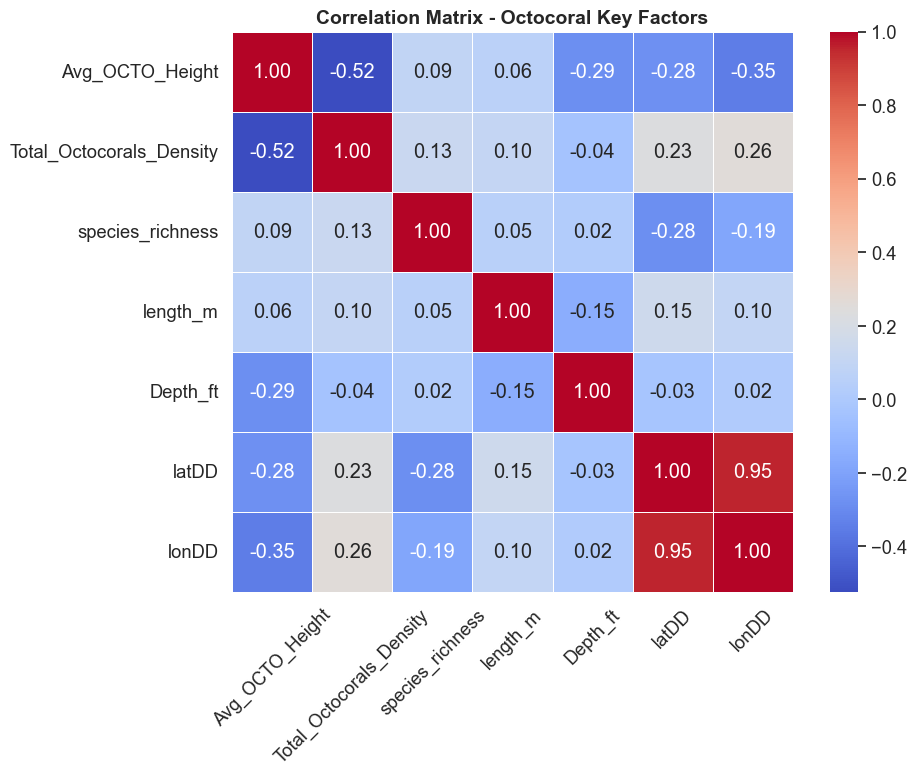

C:\Users\User\AppData\Local\Temp\ipykernel_216836\1544748099.py:78: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Figure size 640x480 with 0 Axes>

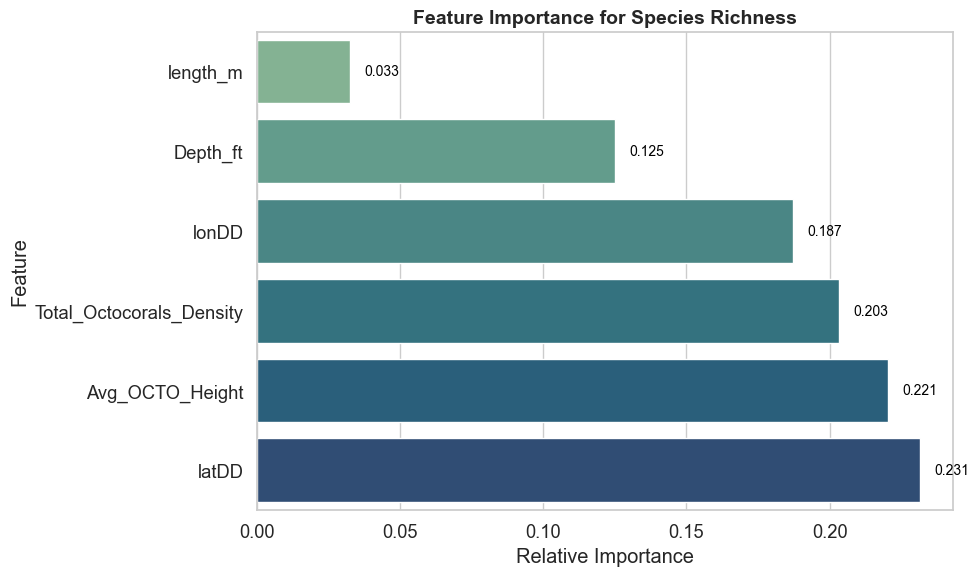

C:\Users\User\AppData\Local\Temp\ipykernel_216836\1544748099.py:78: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Figure size 640x480 with 0 Axes>

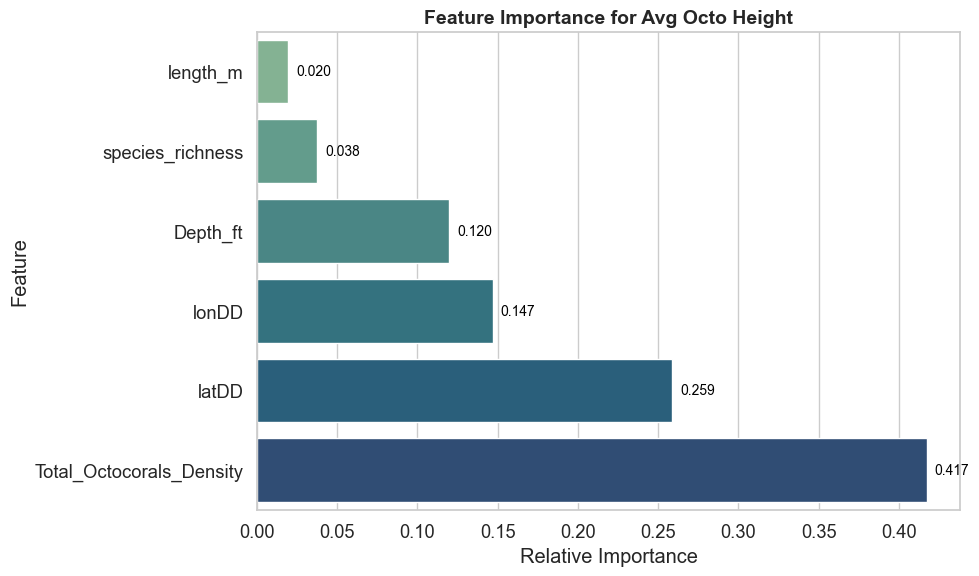

C:\Users\User\AppData\Local\Temp\ipykernel_216836\1544748099.py:78: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Figure size 640x480 with 0 Axes>

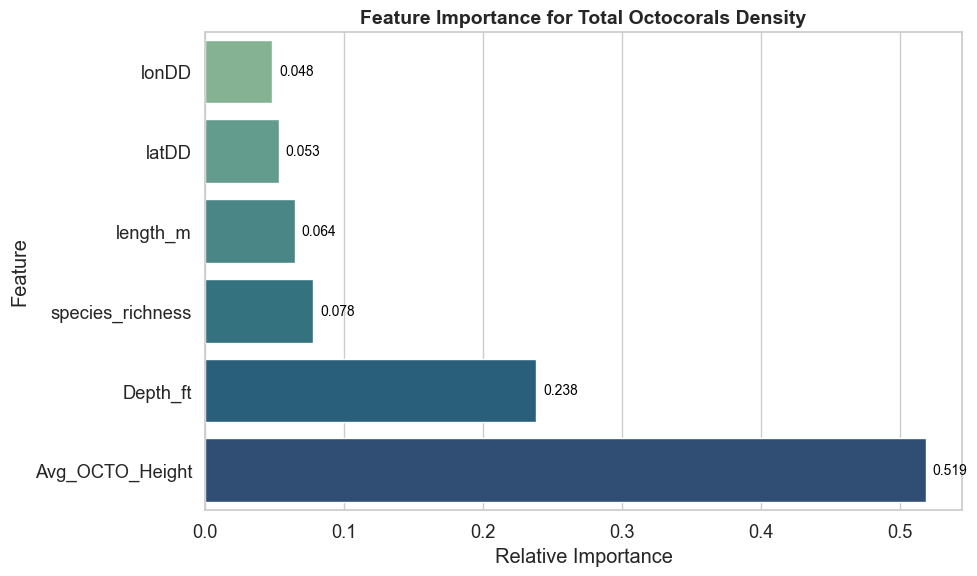

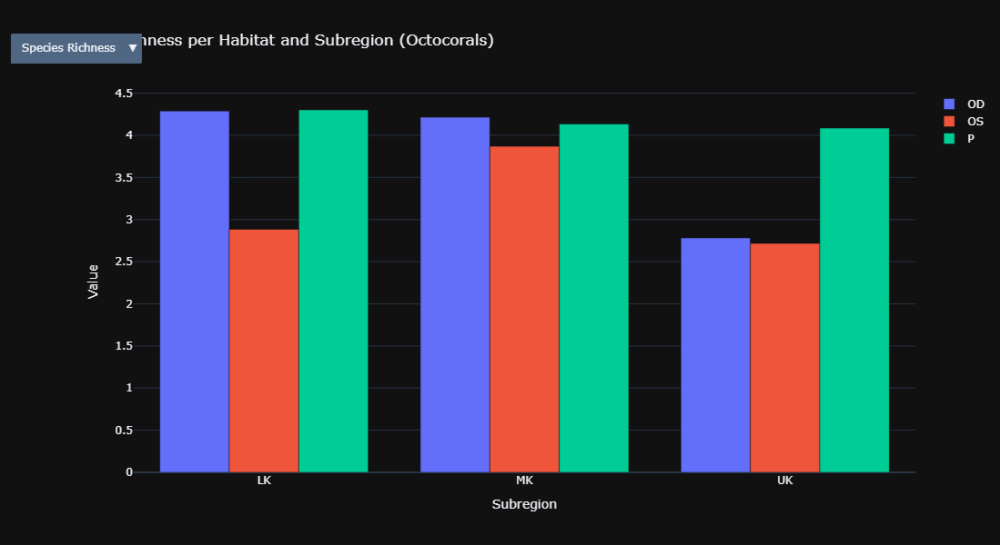

<Figure size 640x480 with 0 Axes>

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from ipywidgets import widgets, Output, VBox
from IPython.display import display, clear_output
import plotly.graph_objects as go 


df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\Florida Keys Coral Reef Evaluation Dataset\Processed\merged_octo_dataset_with_coords_richness.csv")
save_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\EDA\Future Outlook"
os.makedirs(save_path, exist_ok=True) 

cols = [
    'Avg_OCTO_Height',
    'Total_Octocorals_Density',
    'species_richness',
    'length_m',
    'Depth_ft',
    'latDD',
    'lonDD'
]

corr_matrix = df[cols].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5)
plt.title("Correlation Matrix - Octocoral Key Factors", fontsize=14, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()
plt.savefig(os.path.join(save_path, "correlation_matrix_octocorals.png"), dpi=300)



targets = ['species_richness', 'Avg_OCTO_Height', 'Total_Octocorals_Density']

for target in targets:
    other_targets = [t for t in targets if t != target]
    features = other_targets + ['length_m', 'Depth_ft', 'latDD', 'lonDD']

    X = df[features].fillna(0)
    y = df[target].fillna(0)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)

    importances = rf.feature_importances_
    feature_importance_df = pd.DataFrame({
        'Feature': features,
        'Importance': importances
    }).sort_values(by='Importance', ascending=True)

    plt.figure(figsize=(10, 6))
    sns.set(style='whitegrid', font_scale=1.2)
    barplot = sns.barplot(
        x='Importance',
        y='Feature',
        data=feature_importance_df,
        palette='crest'
    )

    for i, v in enumerate(feature_importance_df['Importance']):
        barplot.text(v + 0.005, i, f'{v:.3f}', color='black', va='center', fontsize=10)

    plt.title(f'Feature Importance for {target.replace("_", " ").title()}', fontsize=14, weight='bold')
    plt.xlabel('Relative Importance')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()
    plt.savefig(os.path.join(save_path, f"feature_importance_{target}.png"), dpi=300)



grouped = df.groupby(['Habitat', 'Subregion']).agg({
    'species_richness': 'mean',
    'Total_Octocorals_Density': 'mean',
    'Avg_OCTO_Height': 'mean',
    'Depth_ft': 'mean',
    'length_m': 'mean'
}).reset_index()

df_vis = grouped.copy()

metric_options = {
    'Species Richness': 'species_richness',
    'Average Density': 'Total_Octocorals_Density',
    'Average Height': 'Avg_OCTO_Height',
    'Average Depth': 'Depth_ft',
    'Transect Length': 'length_m'
}

traces = []
visibility_map = []

for metric_name, metric_col in metric_options.items():
    metric_traces = []
    for habitat in df_vis['Habitat'].unique():
        sub_df = df_vis[df_vis['Habitat'] == habitat]
        trace = go.Bar(
            x=sub_df['Subregion'],
            y=sub_df[metric_col],
            name=habitat,
            visible=False  
        )
        traces.append(trace)
        metric_traces.append(len(traces) - 1)
    visibility_map.append(metric_traces)

fig = go.Figure(data=traces)

for idx in visibility_map[0]:
    fig.data[idx].visible = True

buttons = []
for i, (label, _) in enumerate(metric_options.items()):
    visible_array = [False] * len(traces)
    for idx in visibility_map[i]:
        visible_array[idx] = True
    buttons.append(dict(label=label,
                        method='update',
                        args=[{'visible': visible_array},
                              {'title': f'{label} per Habitat and Subregion (Octocorals)'}]))

fig.update_layout(
    updatemenus=[dict(
        type='dropdown',
        direction='down',
        buttons=buttons,
        x=0.01,
        y=1.15,
        showactive=True
    )],
    title="Species Richness per Habitat and Subregion (Octocorals)",
    xaxis_title="Subregion",
    yaxis_title="Value",
    barmode='group',
    template='plotly_dark',
    height=600
)
fig.show()
fig.write_html(os.path.join(save_path, "interactive_dropdown_chart_octocorals.html"))


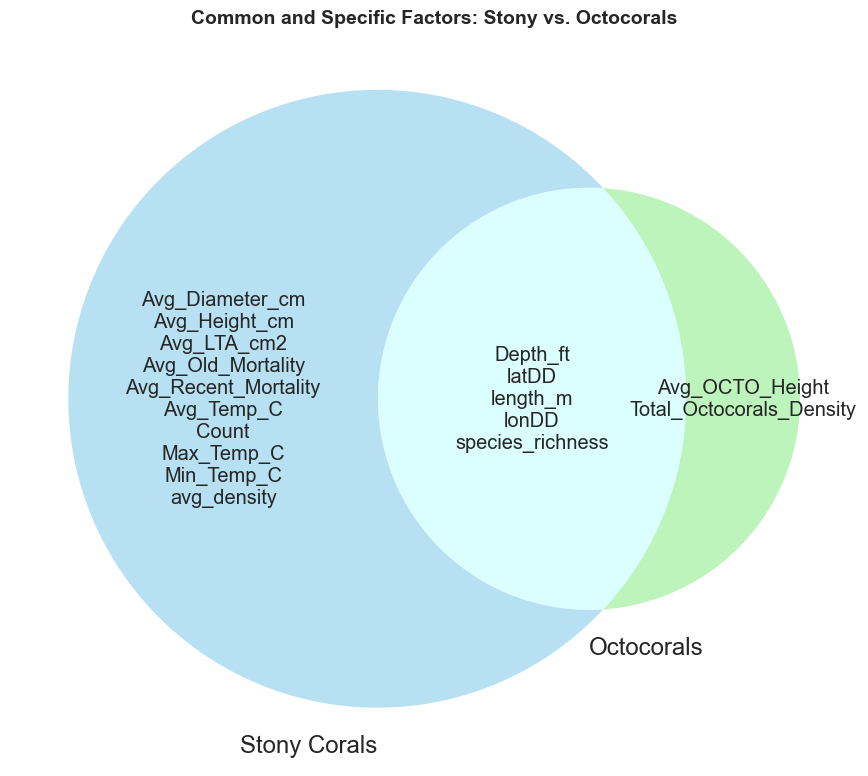

In [10]:
from matplotlib_venn import venn2
import matplotlib.pyplot as plt
import os

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_coords_richness.csv")
df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_coords_temp_richness.csv")

save_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\EDA\Future Outlook"
os.makedirs(save_path, exist_ok=True)


stony_factors = {
    'Avg_LTA_cm2', 'Avg_Height_cm', 'Avg_Diameter_cm',
    'Avg_Old_Mortality', 'Avg_Recent_Mortality',
    'Count', 'Avg_Temp_C', 'Max_Temp_C', 'Min_Temp_C',
    'Depth_ft', 'length_m', 'latDD', 'lonDD',
    'species_richness', 'avg_density'
}

octo_factors = {
    'Avg_OCTO_Height', 'Total_Octocorals_Density',
    'species_richness', 'length_m', 'Depth_ft', 'latDD', 'lonDD'
}

common = stony_factors & octo_factors
only_stony = stony_factors - octo_factors
only_octo = octo_factors - stony_factors

plt.figure(figsize=(12, 8))
venn = venn2(
    subsets=(len(only_stony), len(only_octo), len(common)),
    set_labels=('Stony Corals', 'Octocorals'),
    set_colors=('skyblue', 'lightgreen'),
    alpha=0.6
)

if venn.get_label_by_id("10"):
    venn.get_label_by_id("10").set_text('\n'.join(sorted(only_stony)))
if venn.get_label_by_id("01"):
    venn.get_label_by_id("01").set_text('\n'.join(sorted(only_octo)))
if venn.get_label_by_id("11"):
    venn.get_label_by_id("11").set_text('\n'.join(sorted(common)))

plt.title("Common and Specific Factors: Stony vs. Octocorals", fontsize=14, weight='bold')
plt.tight_layout()

save_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\EDA\Future Outlook"
os.makedirs(save_path, exist_ok=True)
plt.savefig(os.path.join(save_path, "venn_labels_stony_vs_octo.png"), dpi=300)

plt.show()

# Early indicators that could help anticipate significant declines in stony populations. 25%

🔍 Praguri pentru declin (25% percentile):
 {'species_richness': 5.0, 'avg_density': 0.063265306, 'Avg_LTA_cm2': 158.3574286}


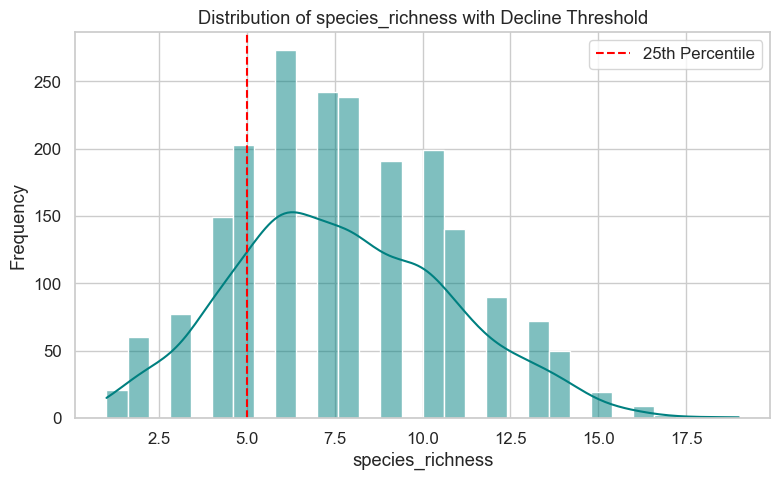

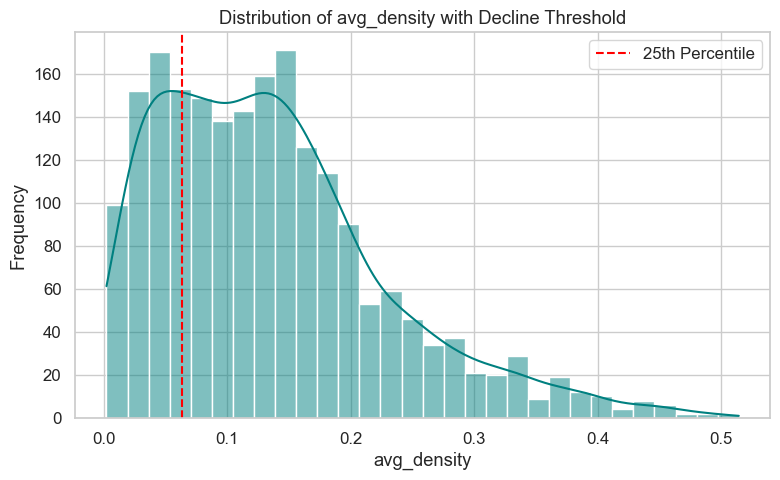

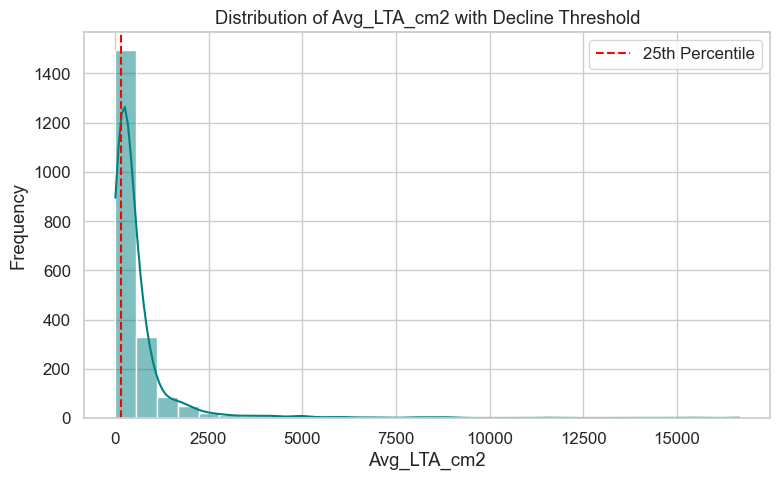

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_coords_temp_richness.csv")

indicators = ['species_richness', 'avg_density', 'Avg_LTA_cm2']

thresholds = {col: df[col].quantile(0.25) for col in indicators}
print("🔍 Praguri pentru declin (25% percentile):\n", thresholds)

df['Decline'] = (
    (df['species_richness'] < thresholds['species_richness']) |
    (df['avg_density'] < thresholds['avg_density']) |
    (df['Avg_LTA_cm2'] < thresholds['Avg_LTA_cm2'])
).astype(int)

sns.set(style="whitegrid", font_scale=1.1)

for col in indicators:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[col], kde=True, bins=30, color='teal')
    plt.axvline(thresholds[col], color='red', linestyle='--', label='25th Percentile')
    plt.title(f'Distribution of {col} with Decline Threshold')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.legend()
    plt.tight_layout()
    plt.show()

output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_decline_25p.csv"
df.to_csv(output_path, index=False)


✅ Classification Report:

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       295
           1       0.95      0.93      0.94       215

    accuracy                           0.95       510
   macro avg       0.95      0.95      0.95       510
weighted avg       0.95      0.95      0.95       510



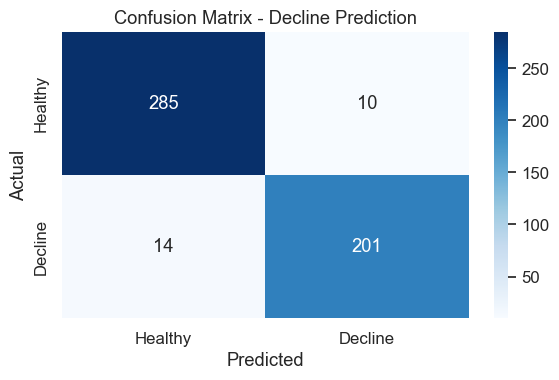

C:\Users\User\AppData\Local\Temp\ipykernel_46312\1176971878.py:58: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




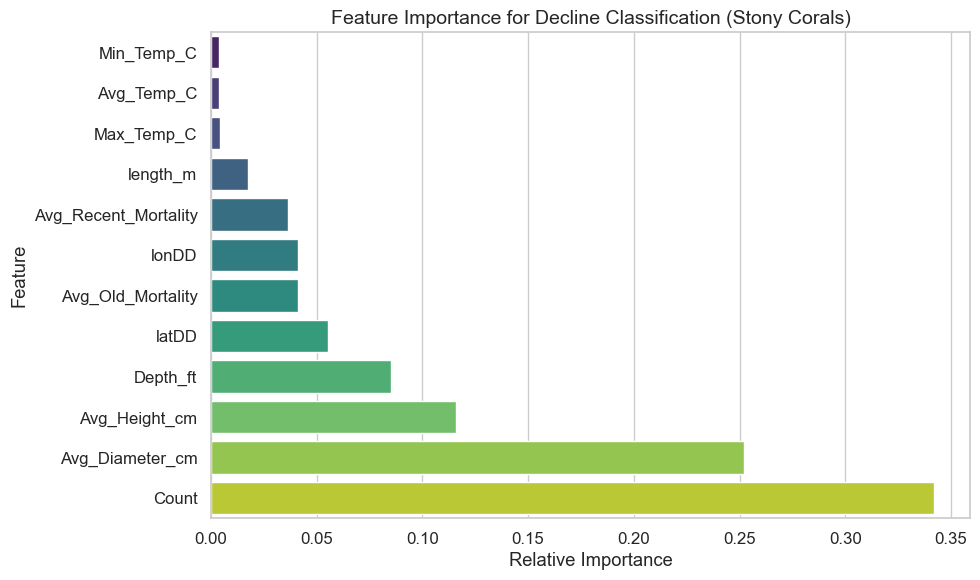

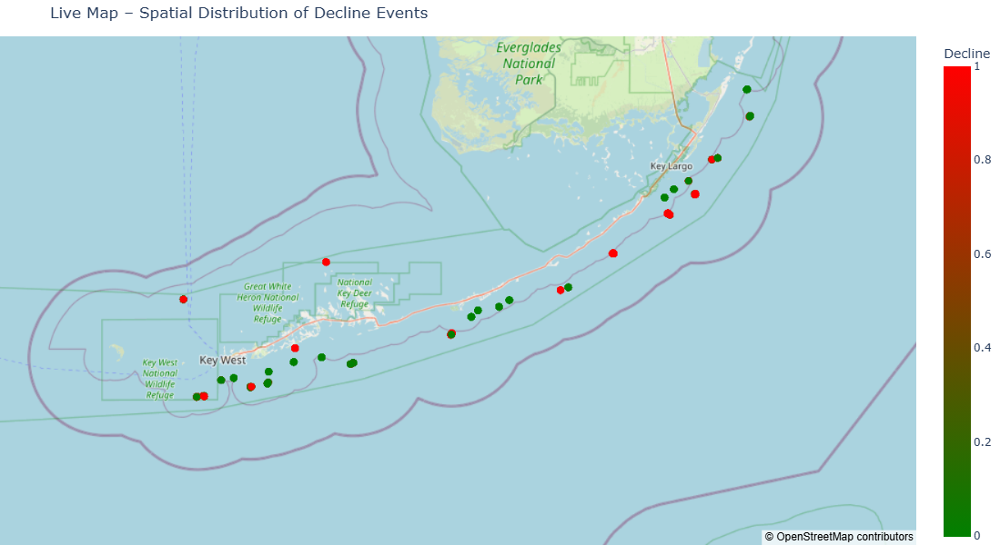

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px


df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_decline_25p.csv")

features = [
    'Avg_Height_cm', 'Avg_Diameter_cm', 'Avg_Old_Mortality', 'Avg_Recent_Mortality',
    'Count', 'Avg_Temp_C', 'Max_Temp_C', 'Min_Temp_C', 'Depth_ft',
    'length_m', 'latDD', 'lonDD'
]

X = df[features].fillna(0)
y = df['Decline'].astype(int)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=42)

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("✅ Classification Report:\n")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Decline'], yticklabels=['Healthy', 'Decline'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Decline Prediction')
plt.tight_layout()
plt.show()

importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance for Decline Classification (Stony Corals)', fontsize=14)
plt.xlabel('Relative Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

required_cols = ['latDD', 'lonDD', 'Decline', 'Subregion']
if not all(col in df.columns for col in required_cols):
    raise ValueError("Datasetul nu conține toate coloanele necesare pentru hartă.")

fig = px.scatter_mapbox(
    df,
    lat="latDD",
    lon="lonDD",
    color="Decline",
    color_continuous_scale=["green", "red"],
    zoom=8,
    height=600,
    mapbox_style="open-street-map",
    title="Live Map – Spatial Distribution of Decline Events",
    hover_data={
        "Subregion": True,
        "latDD": False,
        "lonDD": False,
        "Decline": True
    }
)

fig.update_traces(marker=dict(size=9), selector=dict(mode='markers'))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})

fig.show()

# Early indicators that could help anticipate significant declines in stony populations. 10%

📉 Praguri pentru declin (percentila 10%):
 {'species_richness': 4.0, 'avg_density': 0.030612245, 'Avg_LTA_cm2': 102.46999008}


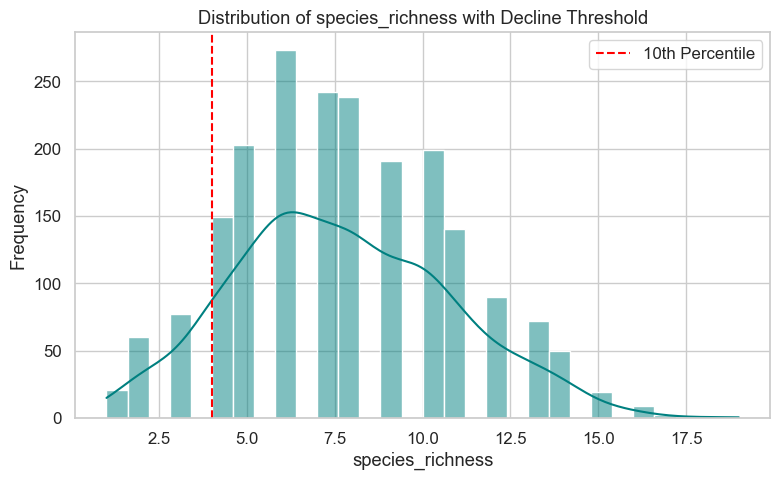

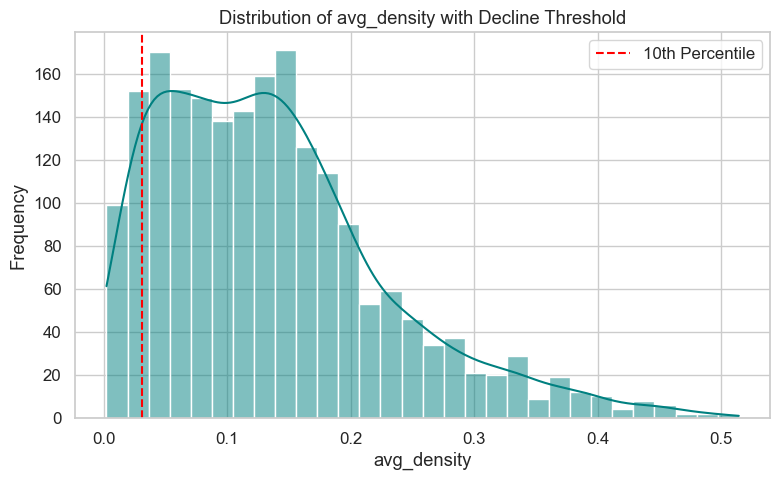

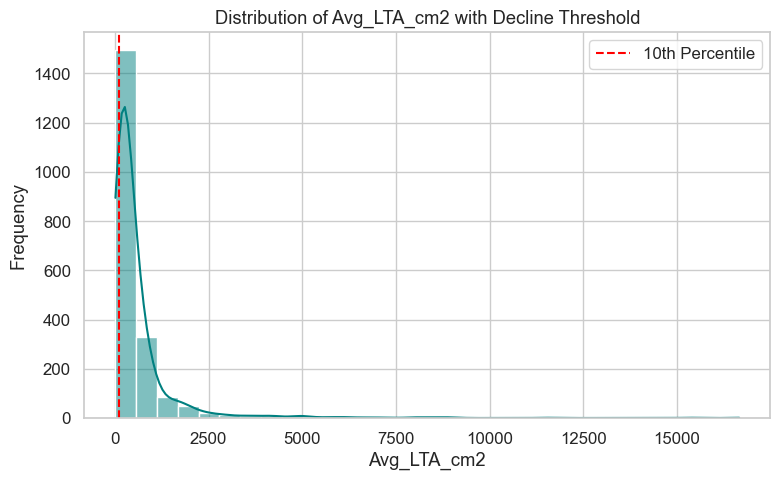

In [34]:
import pandas as pd

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_coords_temp_richness.csv")

indicators = ['species_richness', 'avg_density', 'Avg_LTA_cm2']

percentile = 0.10  

thresholds = {col: df[col].quantile(percentile) for col in indicators}
print(f"📉 Praguri pentru declin (percentila {int(percentile*100)}%):\n", thresholds)

df['Decline'] = (
    (df['species_richness'] < thresholds['species_richness']) |
    (df['avg_density'] < thresholds['avg_density']) |
    (df['Avg_LTA_cm2'] < thresholds['Avg_LTA_cm2'])
).astype(int)
sns.set(style="whitegrid", font_scale=1.1)

for col in indicators:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[col], kde=True, bins=30, color='teal')
    plt.axvline(thresholds[col], color='red', linestyle='--', label='10th Percentile')
    plt.title(f'Distribution of {col} with Decline Threshold')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.legend()
    plt.tight_layout()
    plt.show()

output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_decline.csv"
df.to_csv(output_path, index=False)
df.to_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_decline_10p.csv", index=False)


✅ Classification Report:

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       406
           1       0.95      0.88      0.92       104

    accuracy                           0.97       510
   macro avg       0.96      0.94      0.95       510
weighted avg       0.97      0.97      0.97       510



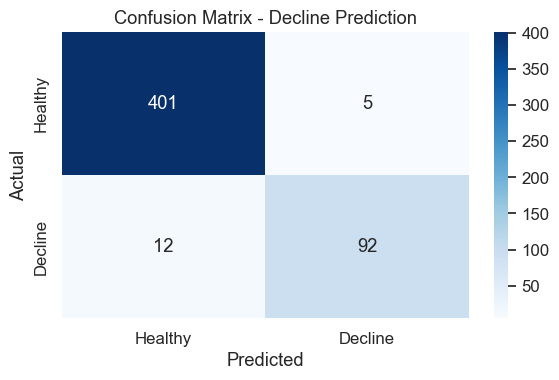

C:\Users\User\AppData\Local\Temp\ipykernel_46312\1401382837.py:58: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




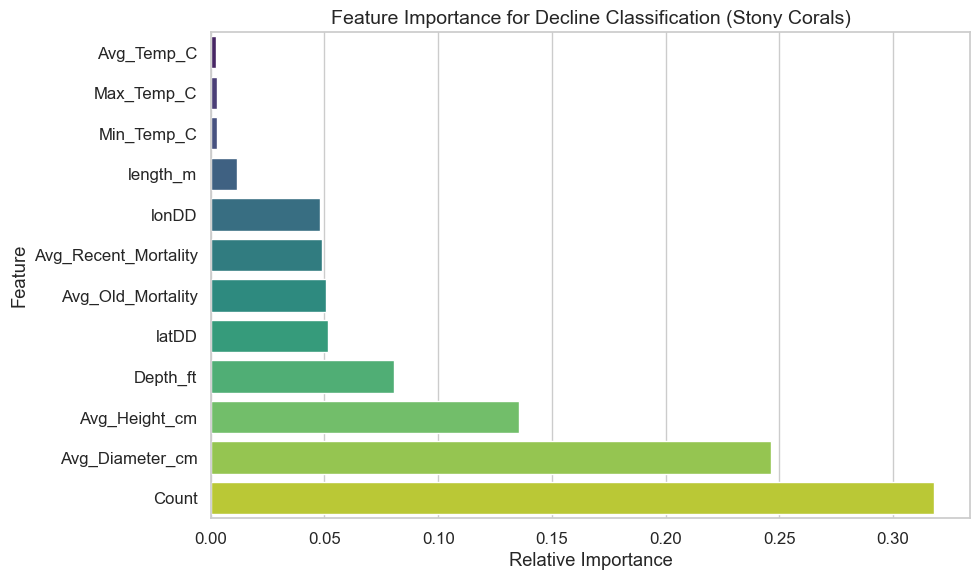

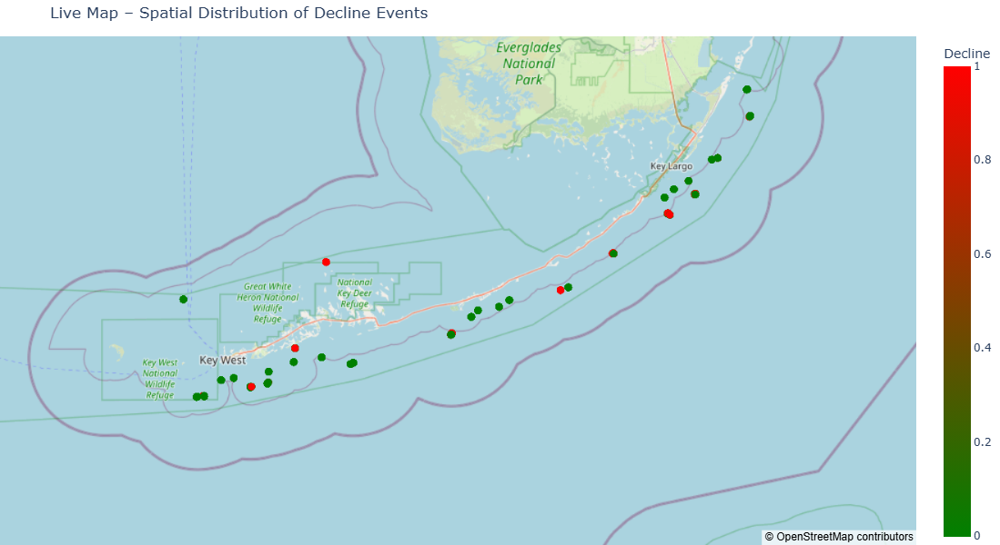

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px


df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_decline_10p.csv")

features = [
    'Avg_Height_cm', 'Avg_Diameter_cm', 'Avg_Old_Mortality', 'Avg_Recent_Mortality',
    'Count', 'Avg_Temp_C', 'Max_Temp_C', 'Min_Temp_C', 'Depth_ft',
    'length_m', 'latDD', 'lonDD'
]

X = df[features].fillna(0)
y = df['Decline'].astype(int)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=42)

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("✅ Classification Report:\n")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Decline'], yticklabels=['Healthy', 'Decline'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Decline Prediction')
plt.tight_layout()
plt.show()

importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance for Decline Classification (Stony Corals)', fontsize=14)
plt.xlabel('Relative Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

required_cols = ['latDD', 'lonDD', 'Decline', 'Subregion']
if not all(col in df.columns for col in required_cols):
    raise ValueError("Datasetul nu conține toate coloanele necesare pentru hartă.")

fig = px.scatter_mapbox(
    df,
    lat="latDD",
    lon="lonDD",
    color="Decline",
    color_continuous_scale=["green", "red"],
    zoom=8,
    height=600,
    mapbox_style="open-street-map",
    title="Live Map – Spatial Distribution of Decline Events",
    hover_data={
        "Subregion": True,
        "latDD": False,
        "lonDD": False,
        "Decline": True
    }
)

fig.update_traces(marker=dict(size=9), selector=dict(mode='markers'))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})

fig.show()

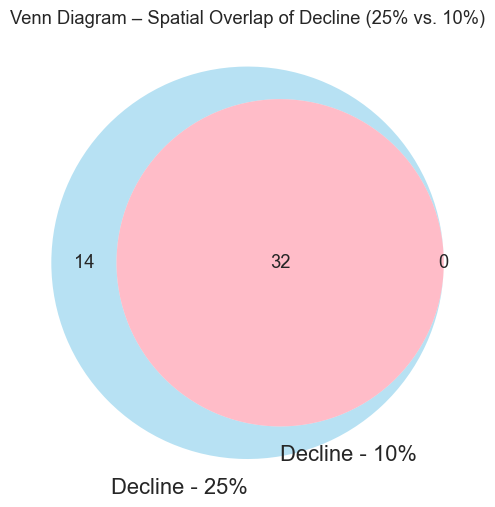

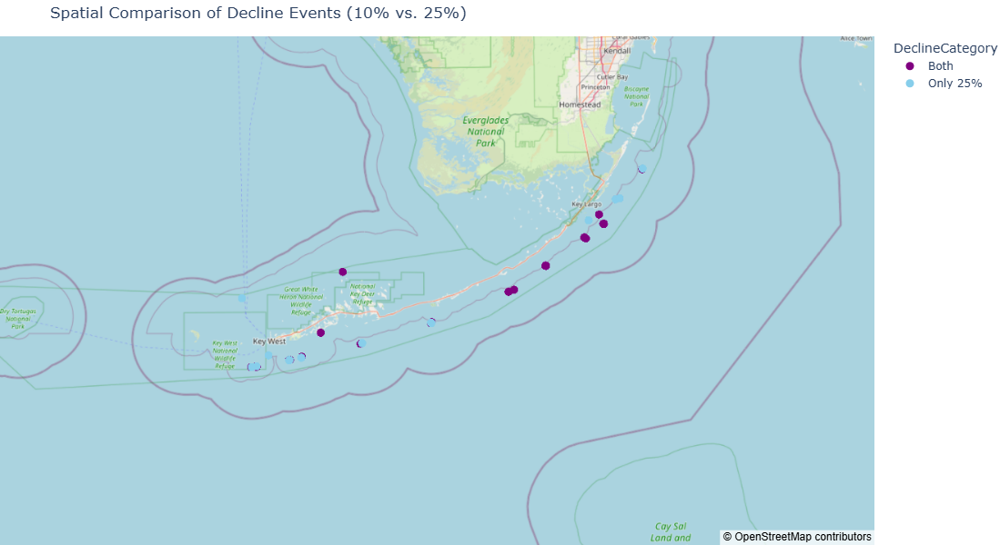

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import plotly.express as px

df_25 = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_decline_25p.csv")  # 25%
df_10 = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_decline_10p.csv")  # 10%

df_25["LocationID"] = df_25["latDD"].round(5).astype(str) + "_" + df_25["lonDD"].round(5).astype(str)
df_10["LocationID"] = df_10["latDD"].round(5).astype(str) + "_" + df_10["lonDD"].round(5).astype(str)

decline_25_ids = set(df_25[df_25["Decline"] == 1]["LocationID"])
decline_10_ids = set(df_10[df_10["Decline"] == 1]["LocationID"])

plt.figure(figsize=(8, 6))
venn2(
    subsets=(decline_25_ids, decline_10_ids),
    set_labels=("Decline - 25%", "Decline - 10%"),
    set_colors=("skyblue", "red"),
    alpha=0.6
)
plt.title("Venn Diagram – Spatial Overlap of Decline (25% vs. 10%)")
plt.show()


df_map = df_25.copy()
df_map["Decline25"] = df_map["LocationID"].isin(decline_25_ids).astype(int)
df_map["Decline10"] = df_map["LocationID"].isin(decline_10_ids).astype(int)

def classify(row):
    if row["Decline25"] == 1 and row["Decline10"] == 1:
        return "Both"
    elif row["Decline25"] == 1:
        return "Only 25%"
    elif row["Decline10"] == 1:
        return "Only 10%"
    else:
        return "None"

df_map["DeclineCategory"] = df_map.apply(classify, axis=1)

fig = px.scatter_mapbox(
    df_map[df_map["DeclineCategory"] != "None"],
    lat="latDD",
    lon="lonDD",
    color="DeclineCategory",
    color_discrete_map={
        "Only 25%": "skyblue",
        "Only 10%": "pink",
        "Both": "purple"
    },
    zoom=7.5,
    height=600,
    mapbox_style="open-street-map",
    title="Spatial Comparison of Decline Events (10% vs. 25%)",
    hover_data={"DeclineCategory": True, "latDD": False, "lonDD": False}
)

fig.update_traces(marker=dict(size=9))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()


# Early indicators that could help anticipate significant declines in octocoral populations. 25%

🔍 Praguri pentru declin (25% percentile):
 {'species_richness': 3.0, 'Total_Octocorals_Density': 5.6, 'Avg_OCTO_Height': 15.10465116}


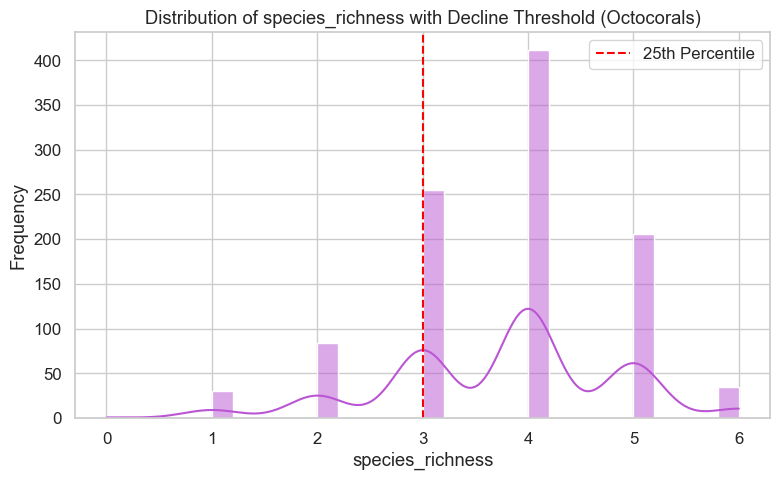

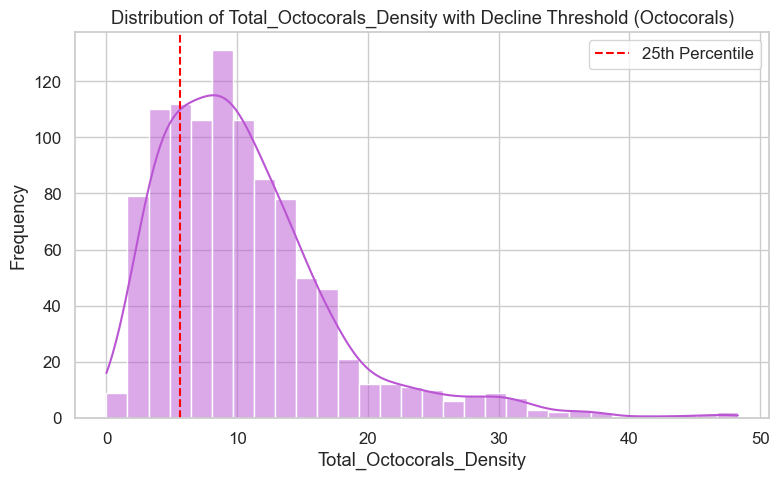

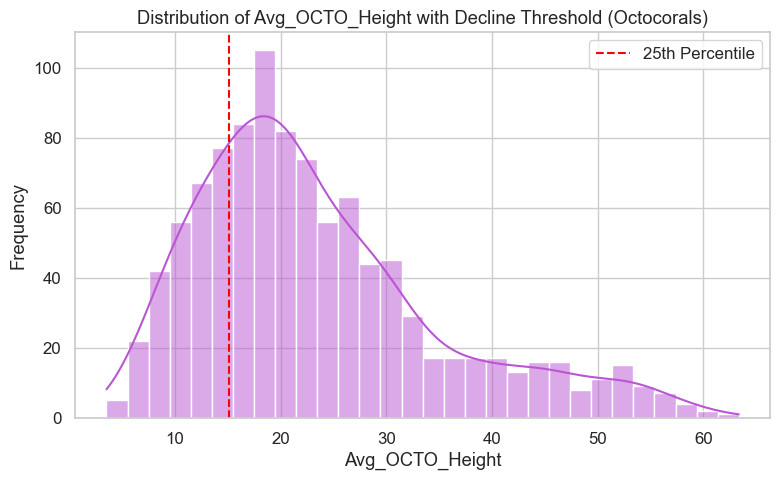

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_coords_richness.csv")

indicators = ['species_richness', 'Total_Octocorals_Density', 'Avg_OCTO_Height']

thresholds = {col: df[col].quantile(0.25) for col in indicators}
print("🔍 Praguri pentru declin (25% percentile):\n", thresholds)

df['Decline'] = (
    (df['species_richness'] < thresholds['species_richness']) |
    (df['Total_Octocorals_Density'] < thresholds['Total_Octocorals_Density']) |
    (df['Avg_OCTO_Height'] < thresholds['Avg_OCTO_Height'])
).astype(int)

sns.set(style="whitegrid", font_scale=1.1)

for col in indicators:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[col], kde=True, bins=30, color='mediumorchid')
    plt.axvline(thresholds[col], color='red', linestyle='--', label='25th Percentile')
    plt.title(f'Distribution of {col} with Decline Threshold (Octocorals)')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.legend()
    plt.tight_layout()
    plt.show()

output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_decline_25p.csv"
df.to_csv(output_path, index=False)


✅ Classification Report:

              precision    recall  f1-score   support

           0       0.68      0.66      0.67       125
           1       0.69      0.70      0.69       131

    accuracy                           0.68       256
   macro avg       0.68      0.68      0.68       256
weighted avg       0.68      0.68      0.68       256



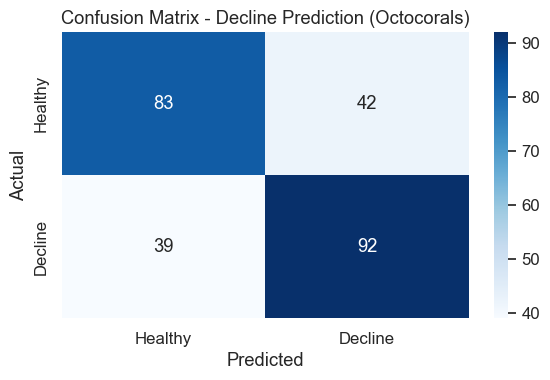

C:\Users\User\AppData\Local\Temp\ipykernel_46312\1785402665.py:59: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




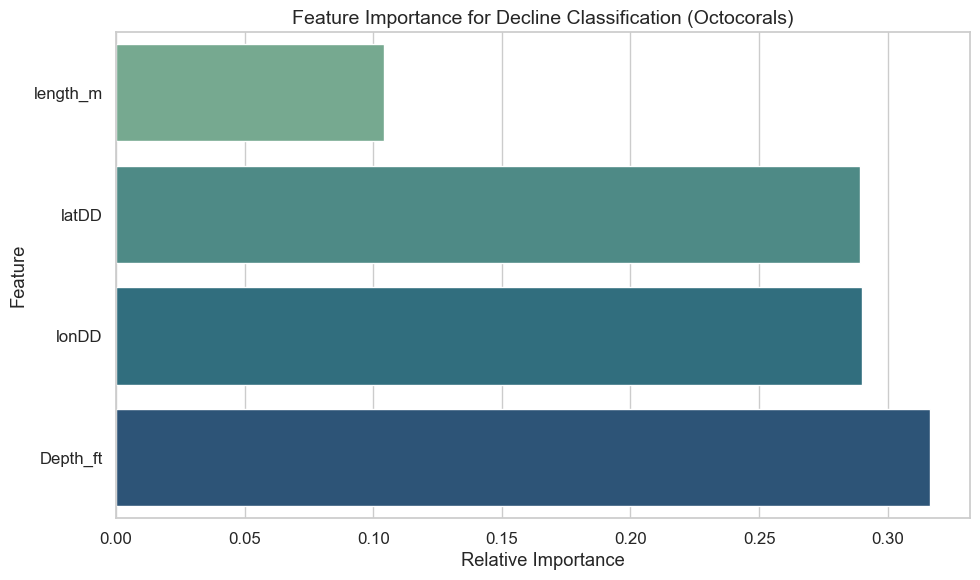

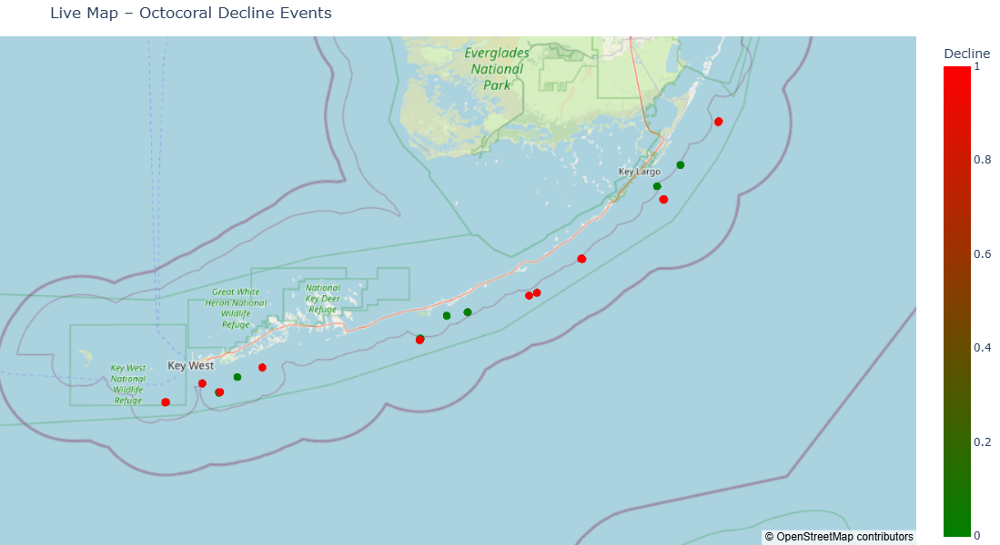

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_decline_25p.csv")

features = [
    'length_m', 
    'Depth_ft', 
    'latDD', 
    'lonDD'
]

X = df[features].fillna(0)
y = df['Decline'].astype(int)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=42)

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("✅ Classification Report:\n")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Decline'], yticklabels=['Healthy', 'Decline'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Decline Prediction (Octocorals)')
plt.tight_layout()
plt.show()

importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='crest')
plt.title('Feature Importance for Decline Classification (Octocorals)', fontsize=14)
plt.xlabel('Relative Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

required_cols = ['latDD', 'lonDD', 'Decline', 'Subregion']
if not all(col in df.columns for col in required_cols):
    raise ValueError("Datasetul nu conține toate coloanele necesare pentru hartă.")

fig = px.scatter_mapbox(
    df,
    lat="latDD",
    lon="lonDD",
    color="Decline",
    color_continuous_scale=["green", "red"],
    zoom=8,
    height=600,
    mapbox_style="open-street-map",
    title="Live Map – Octocoral Decline Events",
    hover_data={
        "Subregion": True,
        "latDD": False,
        "lonDD": False,
        "Decline": True
    }
)

fig.update_traces(marker=dict(size=9), selector=dict(mode='markers'))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()


# Early indicators that could help anticipate significant declines in octocoral populations. 10%

🔍 Praguri pentru declin (percentila 10%):
 {'species_richness': 2.0, 'Total_Octocorals_Density': 3.5, 'Avg_OCTO_Height': 10.56578947}


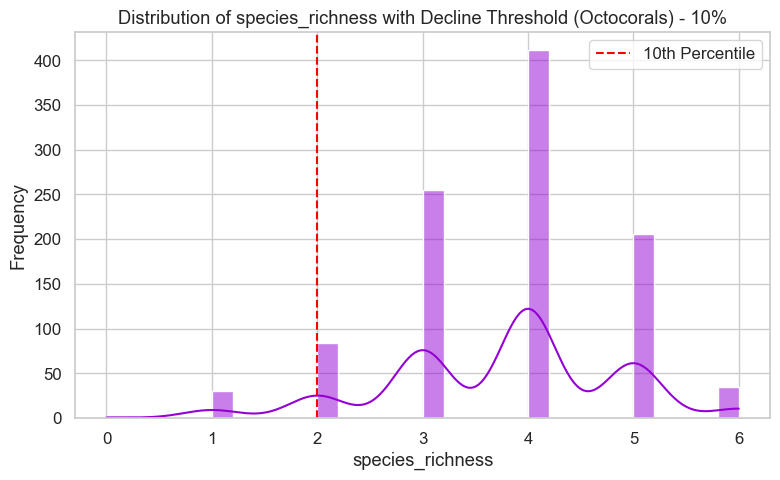

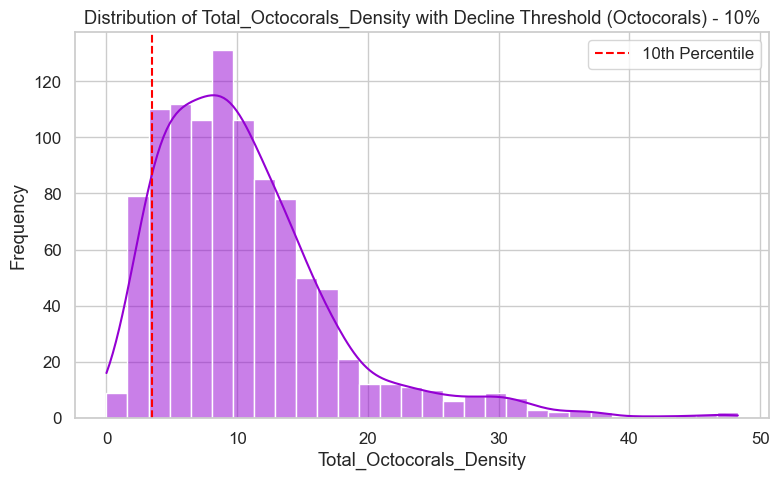

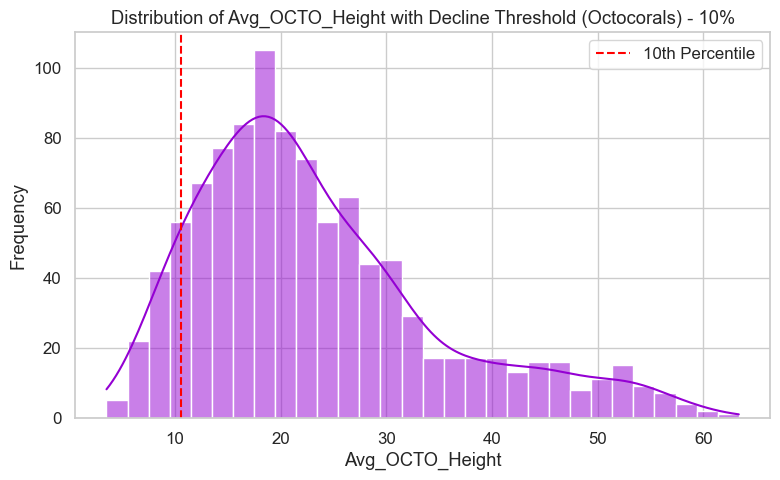

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_coords_richness.csv")

indicators = ['species_richness', 'Total_Octocorals_Density', 'Avg_OCTO_Height']

percentile = 0.10
thresholds = {col: df[col].quantile(percentile) for col in indicators}
print(f"🔍 Praguri pentru declin (percentila {int(percentile*100)}%):\n", thresholds)

df['Decline'] = (
    (df['species_richness'] < thresholds['species_richness']) |
    (df['Total_Octocorals_Density'] < thresholds['Total_Octocorals_Density']) |
    (df['Avg_OCTO_Height'] < thresholds['Avg_OCTO_Height'])
).astype(int)

sns.set(style="whitegrid", font_scale=1.1)

for col in indicators:
    plt.figure(figsize=(8, 5))
    sns.histplot(df[col], kde=True, bins=30, color='darkviolet')
    plt.axvline(thresholds[col], color='red', linestyle='--', label='10th Percentile')
    plt.title(f'Distribution of {col} with Decline Threshold (Octocorals) - 10%')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.legend()
    plt.tight_layout()
    plt.show()

output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_decline_10pct.csv"
df.to_csv(output_path, index=False)


✅ Classification Report:

              precision    recall  f1-score   support

           0       0.85      0.92      0.89       202
           1       0.58      0.41      0.48        54

    accuracy                           0.81       256
   macro avg       0.72      0.66      0.68       256
weighted avg       0.80      0.81      0.80       256



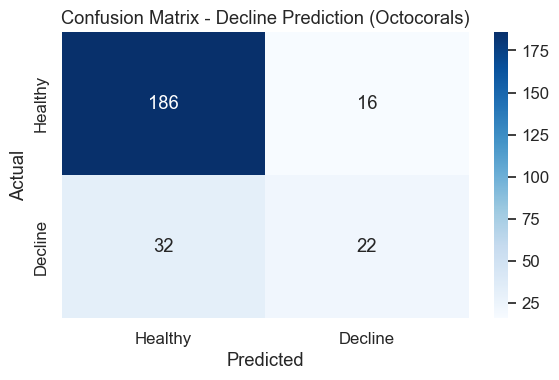

C:\Users\User\AppData\Local\Temp\ipykernel_46312\2426717975.py:59: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




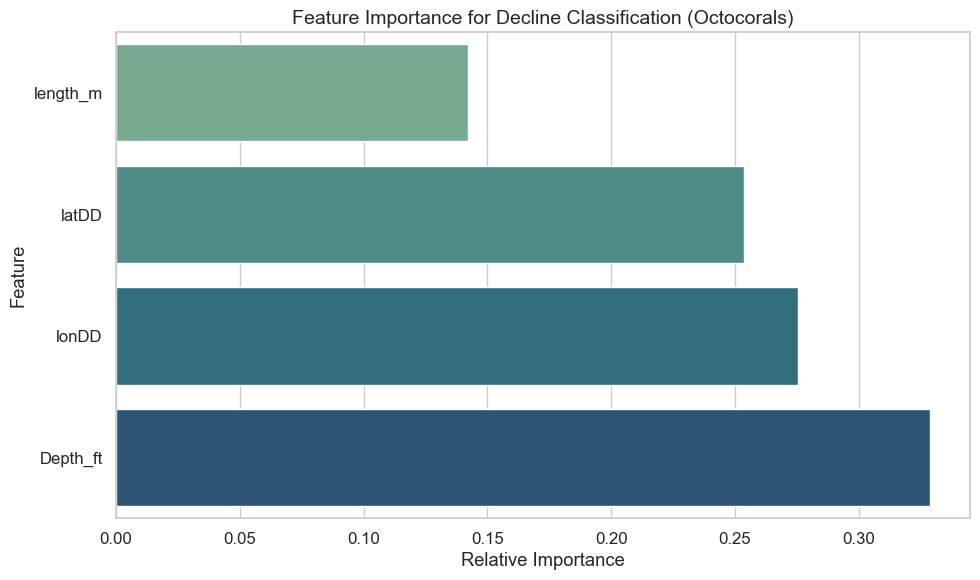

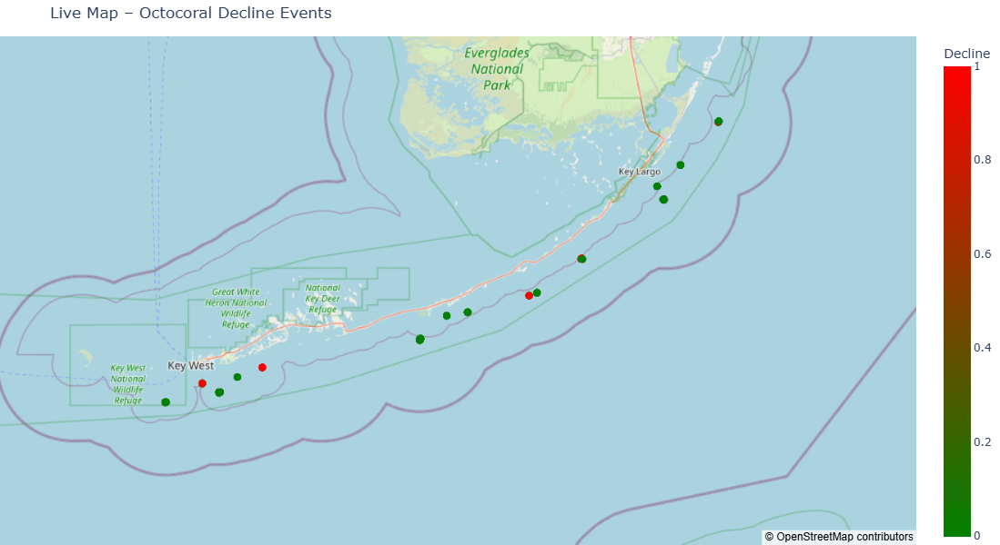

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px
df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_decline_10pct.csv")

features = [
    'length_m', 
    'Depth_ft', 
    'latDD', 
    'lonDD'
]

X = df[features].fillna(0)
y = df['Decline'].astype(int)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.25, random_state=42)

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print("✅ Classification Report:\n")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Decline'], yticklabels=['Healthy', 'Decline'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Decline Prediction (Octocorals)')
plt.tight_layout()
plt.show()

importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
}).sort_values(by='Importance', ascending=True)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='crest')
plt.title('Feature Importance for Decline Classification (Octocorals)', fontsize=14)
plt.xlabel('Relative Importance')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

required_cols = ['latDD', 'lonDD', 'Decline', 'Subregion']
if not all(col in df.columns for col in required_cols):
    raise ValueError("Datasetul nu conține toate coloanele necesare pentru hartă.")

fig = px.scatter_mapbox(
    df,
    lat="latDD",
    lon="lonDD",
    color="Decline",
    color_continuous_scale=["green", "red"],
    zoom=8,
    height=600,
    mapbox_style="open-street-map",
    title="Live Map – Octocoral Decline Events",
    hover_data={
        "Subregion": True,
        "latDD": False,
        "lonDD": False,
        "Decline": True
    }
)

fig.update_traces(marker=dict(size=9), selector=dict(mode='markers'))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()


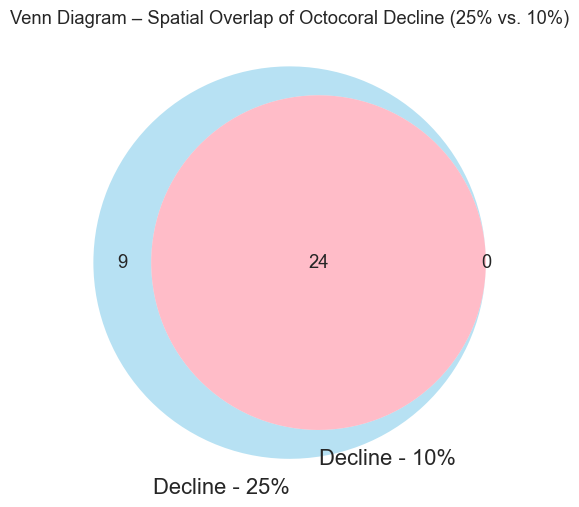

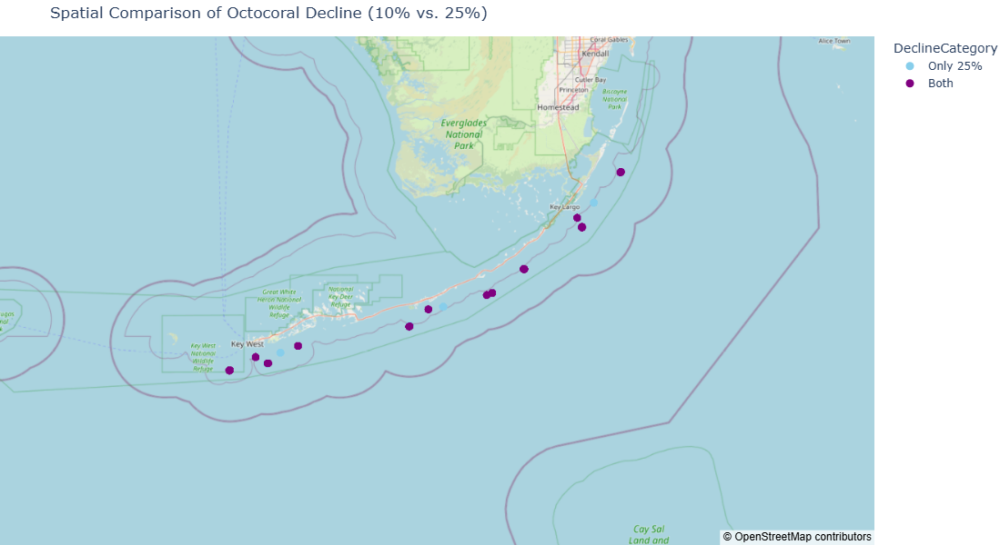

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import plotly.express as px

df_25 = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_decline_25p.csv")
df_10 = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_decline_10pct.csv")

df_25["LocationID"] = df_25["latDD"].round(5).astype(str) + "_" + df_25["lonDD"].round(5).astype(str)
df_10["LocationID"] = df_10["latDD"].round(5).astype(str) + "_" + df_10["lonDD"].round(5).astype(str)

decline_25_ids = set(df_25[df_25["Decline"] == 1]["LocationID"])
decline_10_ids = set(df_10[df_10["Decline"] == 1]["LocationID"])

plt.figure(figsize=(8, 6))
venn2(
    subsets=(decline_25_ids, decline_10_ids),
    set_labels=("Decline - 25%", "Decline - 10%"),
    set_colors=("skyblue", "red"),
    alpha=0.6
)
plt.title("Venn Diagram – Spatial Overlap of Octocoral Decline (25% vs. 10%)")
plt.show()

df_map = df_25.copy()
df_map["Decline25"] = df_map["LocationID"].isin(decline_25_ids).astype(int)
df_map["Decline10"] = df_map["LocationID"].isin(decline_10_ids).astype(int)

def classify(row):
    if row["Decline25"] == 1 and row["Decline10"] == 1:
        return "Both"
    elif row["Decline25"] == 1:
        return "Only 25%"
    elif row["Decline10"] == 1:
        return "Only 10%"
    else:
        return "None"

df_map["DeclineCategory"] = df_map.apply(classify, axis=1)

fig = px.scatter_mapbox(
    df_map[df_map["DeclineCategory"] != "None"],
    lat="latDD",
    lon="lonDD",
    color="DeclineCategory",
    color_discrete_map={
        "Only 25%": "skyblue",
        "Only 10%": "violet",
        "Both": "purple"
    },
    zoom=7.5,
    height=600,
    mapbox_style="open-street-map",
    title="Spatial Comparison of Octocoral Decline (10% vs. 25%)",
    hover_data={"DeclineCategory": True, "latDD": False, "lonDD": False}
)

fig.update_traces(marker=dict(size=9))
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()


# Model the evolution of coral reefs at the observed stations over the next five years based on trends identified in the datasets.


# Features Creation

In [1]:
import pandas as pd
import numpy as np
import os

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_dataset_with_coords_richness.csv")

# 1. Log-transform of species_richness
df['log_species_richness'] = np.log1p(df['species_richness'])

# 2. Structural complexity index
df['height_density_index'] = df['Avg_OCTO_Height'] * df['Total_Octocorals_Density']

# 3. Richness per meter (sampling effort)
df['richness_per_meter'] = df['species_richness'] / df['length_m'].replace(0, np.nan)

# 4. Density per depth
df['density_per_depth'] = df['Total_Octocorals_Density'] / df['Depth_ft'].replace(0, np.nan)

# 5. Dominance ratio (proxy for species dominance)
df['dominance_ratio'] = df['Total_Octocorals_Density'] / df['species_richness'].replace(0, np.nan)

# 6. Latitude-Depth ratio
df['lat_depth_ratio'] = df['latDD'] / df['Depth_ft'].replace(0, np.nan)

# 7. Growth vs. spread ratio
df['height_per_species'] = df['Avg_OCTO_Height'] / df['species_richness'].replace(0, np.nan)

# 8. Time since baseline (2011)
df['Years_Since_2011'] = df['Year'] - 2011

# 9. Spatial binning
df['lat_bin'] = df['latDD'].round(1)
df['lon_bin'] = df['lonDD'].round(1)

df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.fillna(0, inplace=True)

output_path = "C:/Users/User/Desktop/Republic Coral Quest Florida/merged_octo_with_features.csv"
df.to_csv(output_path, index=False)

print("✅ Feature engineering completed and file saved!")


✅ Feature engineering completed and file saved!


In [2]:
import pandas as pd
import numpy as np
import os

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_dataset_with_coords_temp_richness.csv")

# === 🔹 LOG TRANSFORMATIONS ===
df["log_species_richness"] = np.log1p(df["species_richness"])
df["log_avg_density"] = np.log1p(df["avg_density"])
df["log_LTA"] = np.log1p(df["Avg_LTA_cm2"])

# === 🔹 MORTALITY FEATURES ===
df["total_mortality"] = df["Avg_Old_Mortality"] + df["Avg_Recent_Mortality"]
df["recent_mortality_ratio"] = df["Avg_Recent_Mortality"] / (df["total_mortality"] + 1e-6)

# === 🔹 TEMPERATURE STRESS INDEX ===
df["temp_range"] = df["Max_Temp_C"] - df["Min_Temp_C"]
df["temp_anomaly"] = df["Avg_Temp_C"] - df["Avg_Temp_C"].mean()

# === 🔹 SPECIES DIVERSITY RATIO (optional: adjust species name if needed) ===
if "Montastraea_cavernosa_density" in df.columns:
    df["Montastraea_ratio"] = df["Montastraea_cavernosa_density"] / (df["avg_density"] + 1e-6)
else:
    df["Montastraea_ratio"] = np.nan  # fallback if column missing

# === 🔹 SPATIAL-ENVIRONMENTAL INTERACTIONS ===
df["depth_temp_interaction"] = df["Depth_ft"] * df["Avg_Temp_C"]
df["height_diameter_ratio"] = df["Avg_Height_cm"] / (df["Avg_Diameter_cm"] + 1e-6)

# === 🔹 DISEASE FLAGS ===
disease_cols = ['BLH', 'PBL', 'PAL', 'BBD', 'WBD', 'WPX', 'WPL', 'DSD', 'SCT', 'RTL', 'RBD', 'YBD', 'UNK']
for col in disease_cols:
    if col not in df.columns:
        df[col] = 0  # Fill missing disease columns with zeros

df["total_disease_count"] = df[disease_cols].sum(axis=1)
df["any_disease_present"] = (df["total_disease_count"] > 0).astype(int)

# === 🔹 TIME-BASED FEATURE ===
df["years_since_2011"] = df["Year"] - 2011

output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features.csv"
df.to_csv(output_path, index=False)

print("✅ Feature creation complete and file saved at:\n", output_path)


✅ Feature creation complete and file saved at:
 C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features.csv


In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features.csv")

indicators = ['species_richness', 'avg_density', 'Avg_LTA_cm2']

percentile = 0.25
thresholds = {col: df[col].quantile(percentile) for col in indicators}
print(f"🔍 Decline thresholds (25th percentile):\n{thresholds}")

df['Decline'] = (
    (df['species_richness'] < thresholds['species_richness']) |
    (df['avg_density'] < thresholds['avg_density']) |
    (df['Avg_LTA_cm2'] < thresholds['Avg_LTA_cm2'])
).astype(int)


output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features_decline.csv"
df.to_csv(output_path, index=False)

print("✅ Decline column created and dataset saved.")


🔍 Decline thresholds (25th percentile):
{'species_richness': 5.0, 'avg_density': 0.063265306, 'Avg_LTA_cm2': 158.3574286}
✅ Decline column created and dataset saved.


In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_with_features.csv")

indicators = ['species_richness', 'Total_Octocorals_Density', 'Avg_OCTO_Height']

percentile = 0.25
thresholds = {col: df[col].quantile(percentile) for col in indicators}
print(f"🔍 Decline thresholds (25th percentile):\n{thresholds}")

df['Decline'] = (
    (df['species_richness'] < thresholds['species_richness']) |
    (df['Total_Octocorals_Density'] < thresholds['Total_Octocorals_Density']) |
    (df['Avg_OCTO_Height'] < thresholds['Avg_OCTO_Height'])
).astype(int)

output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_with_features_decline.csv"
df.to_csv(output_path, index=False)

print("✅ Decline column created and saved for octocorals.")


🔍 Decline thresholds (25th percentile):
{'species_richness': 3.0, 'Total_Octocorals_Density': 5.6, 'Avg_OCTO_Height': 15.065193964999999}
✅ Decline column created and saved for octocorals.


# Models

# Forecasting Octocoral Species Richness in Florida Keys Reefs (2024–2030): A Hybrid Modeling Approach with Prophet and XGBoost

In [60]:
from prophet import Prophet
import pandas as pd
import os

df = pd.read_csv("C:/Users/User/Desktop/Republic Coral Quest Florida/merged_octo_with_features_decline.csv")

output_folder = "C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models"
os.makedirs(output_folder, exist_ok=True)

prophet_forecasts_all = []

df = df[['StationID', 'Year', 'species_richness']].dropna()

for station_id in df['StationID'].unique():
    station_df = df[df['StationID'] == station_id][['Year', 'species_richness']].dropna()

    if station_df['Year'].nunique() < 4:
        continue

    prophet_df = station_df.rename(columns={'Year': 'ds', 'species_richness': 'y'})
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')

    model = Prophet(yearly_seasonality=False)
    model.fit(prophet_df)

    future = pd.date_range(start='2024-01-01', end='2030-01-01', freq='YS')
    future_df = pd.DataFrame({'ds': future})

    forecast = model.predict(future_df)
    forecast['StationID'] = station_id
    forecast['year'] = forecast['ds'].dt.year

    prophet_forecasts_all.append(
        forecast[['year', 'yhat', 'yhat_lower', 'yhat_upper', 'StationID']]
    )

all_forecasts_df = pd.concat(prophet_forecasts_all, ignore_index=True)
all_forecasts_df.rename(columns={
    'yhat': 'predicted_species_richness',
    'yhat_lower': 'lower_bound',
    'yhat_upper': 'upper_bound'
}, inplace=True)

output_csv_path = os.path.join(output_folder, "prophet_forecast_species_richness_2024_2030.csv")
all_forecasts_df.to_csv(output_csv_path, index=False)

print("✅ Saved forecast to CSV for 2024–2030.")


19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing
19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing
19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing
19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing
19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing
19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:22 - cmdstanpy - INFO - Chain [1] done processing
19:24:22 - cmdstanpy - INFO - Chain [1] start processing
19:24:23 - cmdstanpy - INFO - Chain [1] done processing
19:24:23 - cmdstanpy - INFO - Chain [1] start processing
19:24:23 - cmdstanpy - INFO - Chain [1] done processing
19:24:23 - cmdstanpy - INFO - Chain [1] start processing
19:24:23 - cmdstanpy - INFO - Chain [1]

✅ Saved forecast to CSV for 2024–2030.


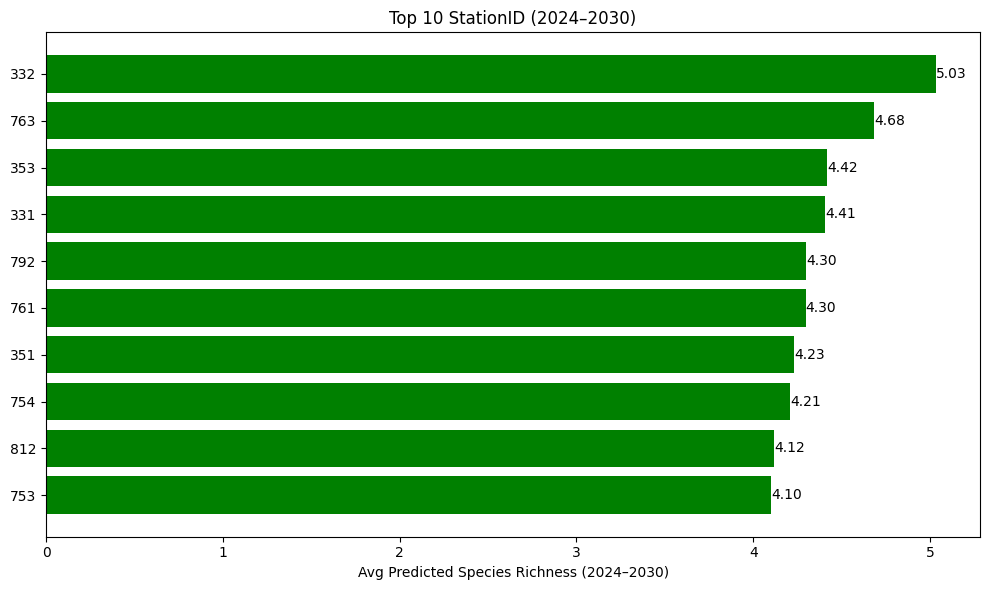

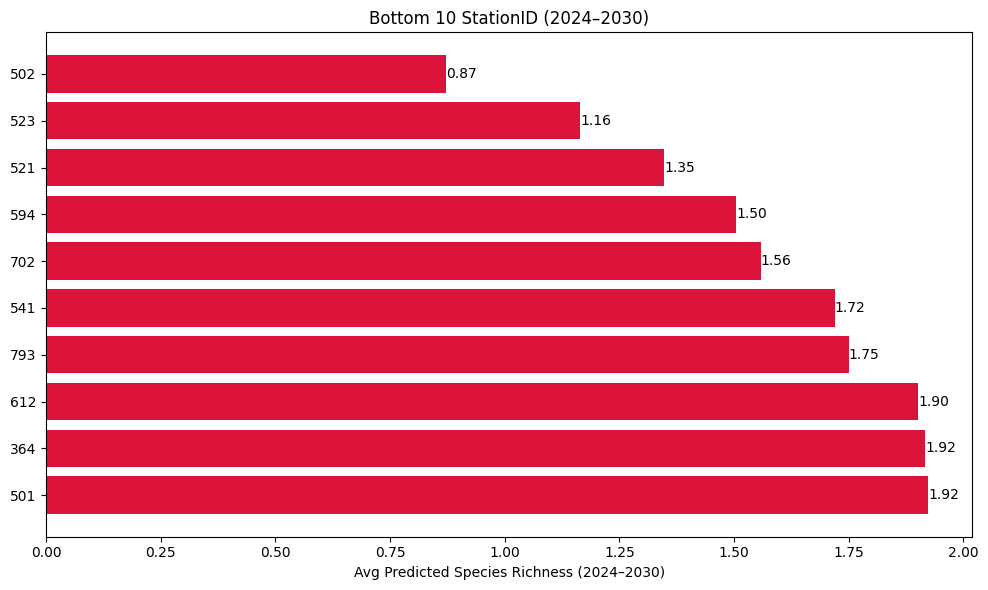

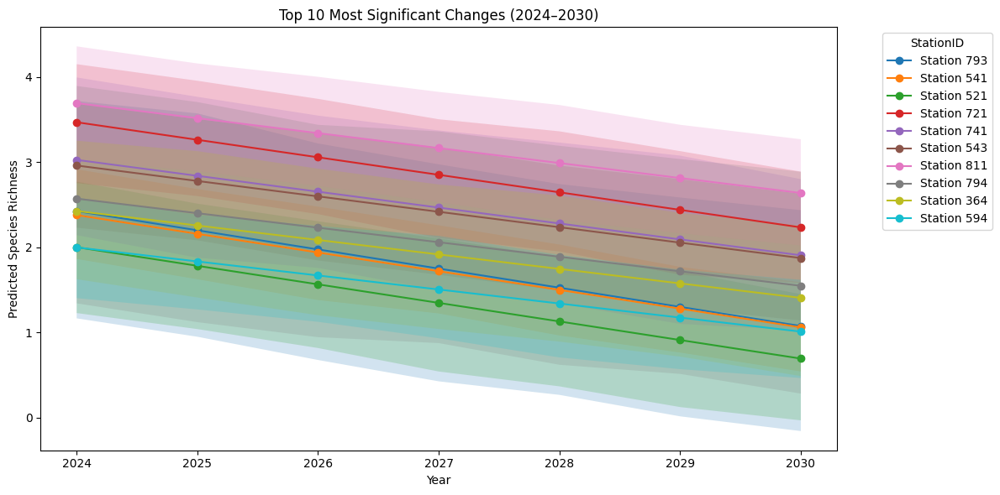

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import os

forecast_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\prophet_forecast_species_richness_2024_2030.csv"
df = pd.read_csv(forecast_path)

cols_to_convert = ['year', 'predicted_species_richness', 'lower_bound', 'upper_bound']
for col in cols_to_convert:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

output_folder = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models"
os.makedirs(output_folder, exist_ok=True)

mean_df = df.groupby('StationID')['predicted_species_richness'].mean().reset_index()
top10 = mean_df.sort_values(by='predicted_species_richness', ascending=False).head(10)
bottom10 = mean_df.sort_values(by='predicted_species_richness', ascending=True).head(10)

plt.figure(figsize=(10, 6))
plt.barh(top10['StationID'].astype(str), top10['predicted_species_richness'], color='green')
for index, value in enumerate(top10['predicted_species_richness']):
    plt.text(value, index, f"{value:.2f}", va='center')
plt.xlabel("Avg Predicted Species Richness (2024–2030)")
plt.title("Top 10 StationID (2024–2030)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "top10_avg_species_richness_2024_2030.png"))
plt.show()

plt.figure(figsize=(10, 6))
plt.barh(bottom10['StationID'].astype(str), bottom10['predicted_species_richness'], color='crimson')
for index, value in enumerate(bottom10['predicted_species_richness']):
    plt.text(value, index, f"{value:.2f}", va='center')
plt.xlabel("Avg Predicted Species Richness (2024–2030)")
plt.title("Bottom 10 StationID (2024–2030)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "bottom10_avg_species_richness_2024_2030.png"))
plt.show()

df_2024 = df[df['year'] == 2024][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2024'})
df_2030 = df[df['year'] == 2030][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2030'})
delta_df = pd.merge(df_2024, df_2030, on='StationID')
delta_df['delta'] = delta_df['pred_2030'] - delta_df['pred_2024']
delta_df['abs_delta'] = delta_df['delta'].abs()

top10_change = delta_df.sort_values('abs_delta', ascending=False).head(10)
selected_ids = top10_change['StationID'].tolist()

df_trends = df[df['StationID'].isin(selected_ids)].dropna(subset=cols_to_convert)

plt.figure(figsize=(12, 6))
for sid in selected_ids:
    data = df_trends[df_trends['StationID'] == sid].sort_values('year')

    x = data['year'].astype(float)
    y = data['predicted_species_richness'].astype(float)
    y_lower = data['lower_bound'].astype(float)
    y_upper = data['upper_bound'].astype(float)

    plt.plot(x, y, marker='o', label=f"Station {sid}")
    plt.fill_between(x, y_lower, y_upper, alpha=0.2)

plt.title("Top 10 Most Significant Changes (2024–2030)")
plt.xlabel("Year")
plt.ylabel("Predicted Species Richness")
plt.legend(title="StationID", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "top10_trend_evolution_2024_2030_with_uncertainty.png"))
plt.show()


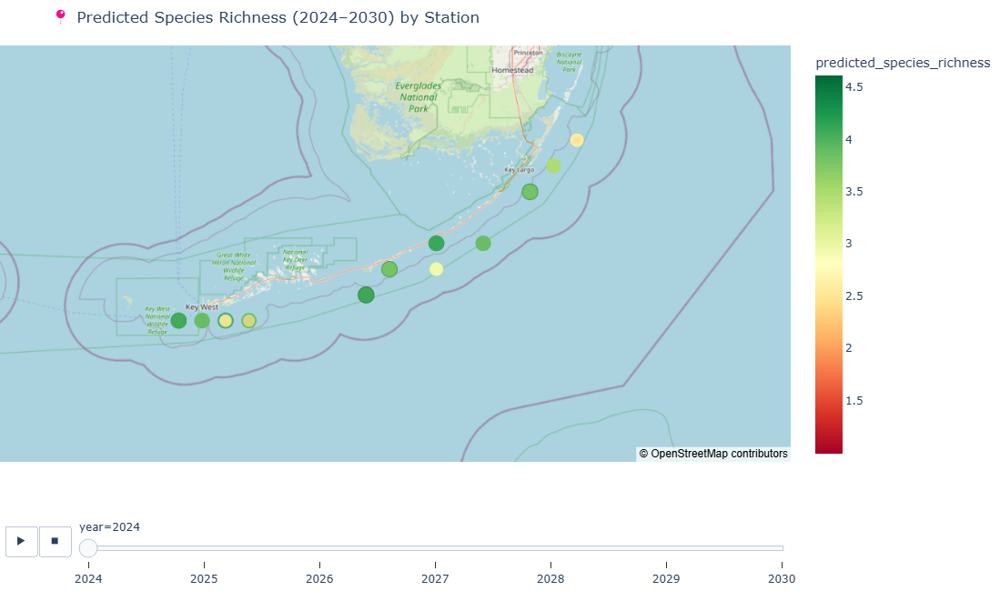

In [62]:
import pandas as pd
import plotly.express as px
import os

forecast_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\prophet_forecast_species_richness_2024_2030.csv"
features_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_with_features_decline.csv"
output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\species_richness_forecast_map_2024_2030.html"

forecast_df = pd.read_csv(forecast_path)
features_df = pd.read_csv(features_path)

coord_df = features_df[['StationID', 'lat_bin', 'lon_bin']].drop_duplicates()
merged_df = forecast_df.merge(coord_df, on='StationID', how='left')

for col in ['lat_bin', 'lon_bin', 'predicted_species_richness']:
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

plot_df = merged_df.dropna(subset=['lat_bin', 'lon_bin', 'predicted_species_richness'])

fig = px.scatter_mapbox(
    plot_df,
    lat="lat_bin",
    lon="lon_bin",
    size="predicted_species_richness",
    color="predicted_species_richness",
    animation_frame="year",
    animation_group="StationID",
    hover_name="StationID",
    hover_data={
        "predicted_species_richness": True,
        "lat_bin": True,
        "lon_bin": True,
        "lower_bound": True,
        "upper_bound": True
    },
    color_continuous_scale="RdYlGn",
    size_max=15,
    zoom=7.5,
    height=650,
    title="📍 Predicted Species Richness (2024–2030) by Station"
)

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 50, "l": 0, "b": 0}
)

fig.show()
fig.write_html(output_path)


In [63]:
import pandas as pd

df = pd.read_csv("C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models/prophet_forecast_species_richness_2024_2030.csv")

df_2024 = df[df['year'] == 2024][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2024'})
df_2030 = df[df['year'] == 2030][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2030'})

decline_df = pd.merge(df_2024, df_2030, on='StationID')
decline_df['delta'] = decline_df['pred_2030'] - decline_df['pred_2024']
decline_df['delta_percent'] = (decline_df['delta'] / decline_df['pred_2024']) * 100

decline_df['pred_2024'] = decline_df['pred_2024'].round(2)
decline_df['pred_2030'] = decline_df['pred_2030'].round(2)
decline_df['delta_percent'] = decline_df['delta_percent'].round(1)

conclusions = []

for _, row in decline_df.iterrows():
    station = int(row['StationID'])
    y1 = row['pred_2024']
    y2 = row['pred_2030']
    delta_pct = row['delta_percent']
    
    if delta_pct < 0:
        sentence = f"📉 Station {station}: species richness drops from {y1} in 2024 to {y2} in 2030 ({abs(delta_pct)}% decline)."
    elif delta_pct > 0:
        sentence = f"📈 Station {station}: species richness increases from {y1} in 2024 to {y2} in 2030 ({delta_pct}% growth)."
    else:
        sentence = f"➖ Station {station}: species richness remains constant at {y1} between 2024 and 2030."

    conclusions.append(sentence)



for c in conclusions:
    print(c)

decline_df['pred_2024'] = decline_df['pred_2024'].round(2)
decline_df['pred_2030'] = decline_df['pred_2030'].round(2)
decline_df['delta'] = decline_df['delta'].round(2)
decline_df['delta_percent'] = decline_df['delta_percent'].round(1)

def describe(row):
    if row['delta_percent'] < 0:
        return f"📉 Station {int(row['StationID'])}: species richness drops from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({abs(row['delta_percent'])}% decline)."
    elif row['delta_percent'] > 0:
        return f"📈 Station {int(row['StationID'])}: species richness increases from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({row['delta_percent']}% growth)."
    else:
        return f"➖ Station {int(row['StationID'])}: species richness remains constant at {row['pred_2024']} between 2024 and 2030."

decline_df['Conclusion'] = decline_df.apply(describe, axis=1)

html_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\station_conclusions_2024_2030.html"
decline_df.to_html(html_path, index=False, escape=False)

print(f"✅ HTML table saved to: {html_path}")


📉 Station 321: species richness drops from 3.46 in 2024 to 2.8 in 2030 (19.0% decline).
📉 Station 322: species richness drops from 3.42 in 2024 to 2.67 in 2030 (22.1% decline).
📉 Station 323: species richness drops from 3.28 in 2024 to 2.52 in 2030 (23.0% decline).
📉 Station 324: species richness drops from 3.54 in 2024 to 2.88 in 2030 (18.6% decline).
📈 Station 331: species richness increases from 4.19 in 2024 to 4.62 in 2030 (10.2% growth).
📈 Station 332: species richness increases from 4.54 in 2024 to 5.53 in 2030 (21.8% growth).
📉 Station 333: species richness drops from 4.08 in 2024 to 4.01 in 2030 (1.6% decline).
📉 Station 334: species richness drops from 4.12 in 2024 to 3.82 in 2030 (7.2% decline).
📉 Station 341: species richness drops from 3.61 in 2024 to 3.22 in 2030 (10.9% decline).
📉 Station 342: species richness drops from 3.69 in 2024 to 3.17 in 2030 (14.2% decline).
📉 Station 343: species richness drops from 3.65 in 2024 to 3.22 in 2030 (11.8% decline).
📉 Station 344: spe


📊 XGBoost Evaluation (2022–2023):
  MAE  = 0.210
  RMSE = 0.313
  R²   = 0.833


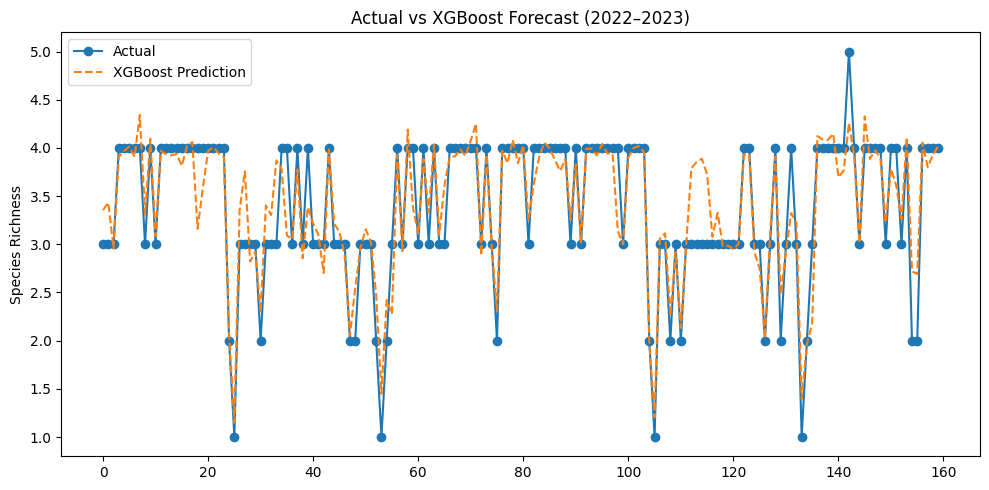

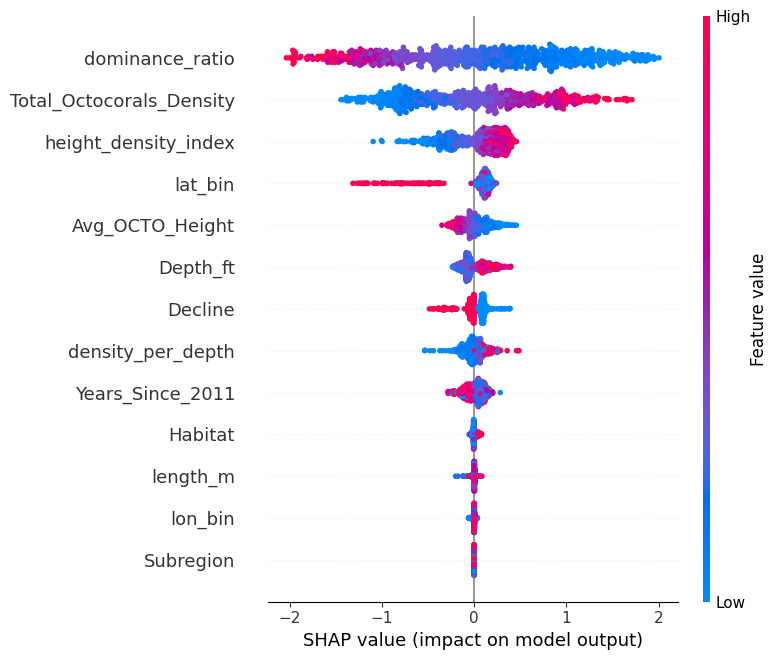

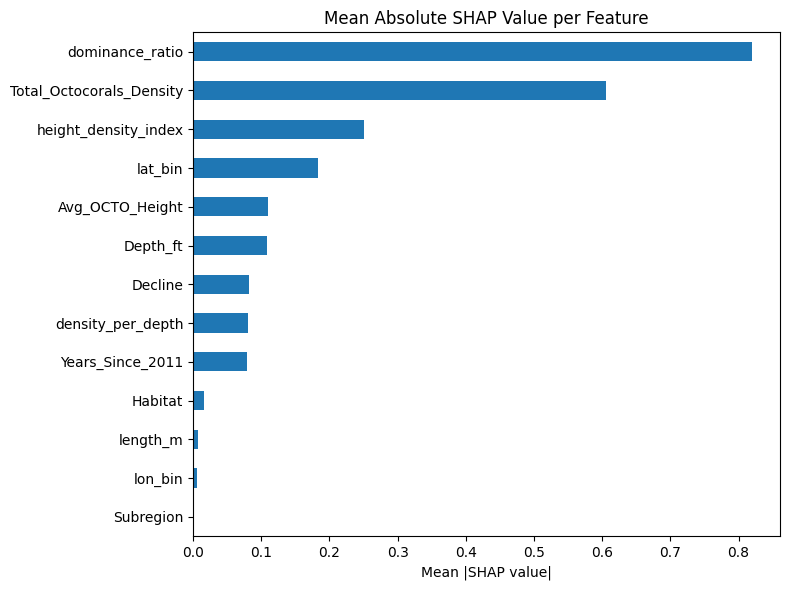

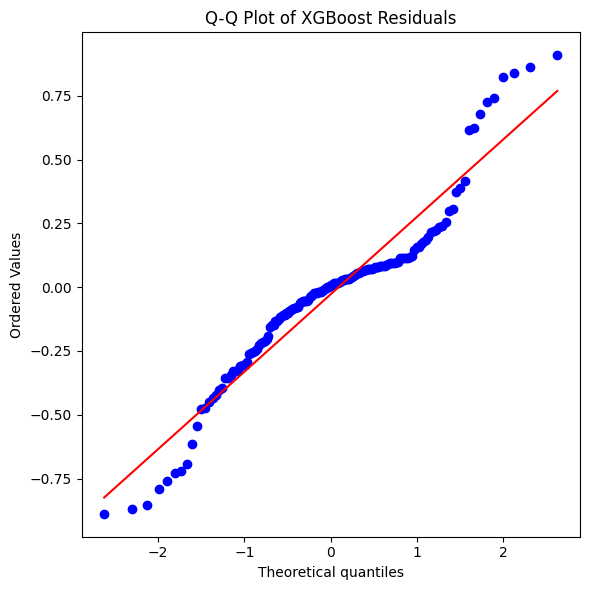

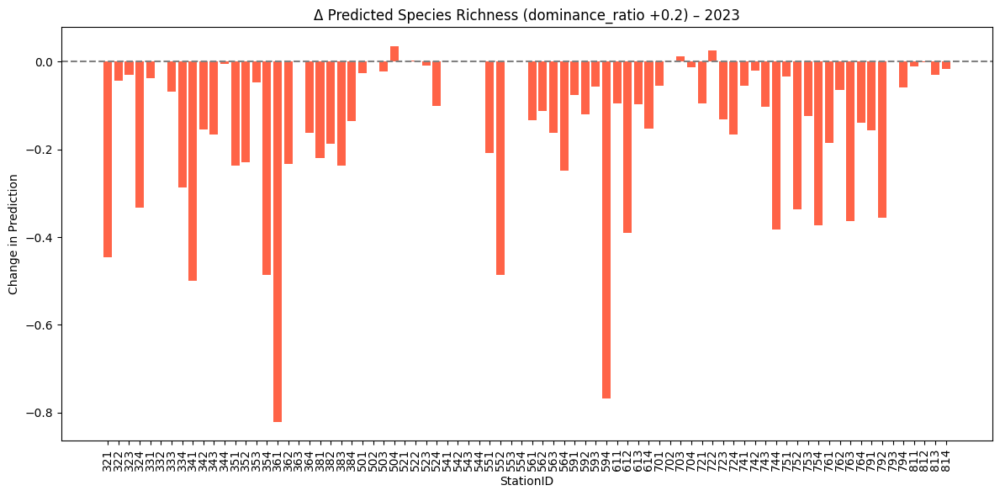

In [64]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import shap
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import scipy.stats as stats

data_path = "C:/Users/User/Desktop/Republic Coral Quest Florida/merged_octo_with_features_decline.csv"
output_folder = "C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models"
os.makedirs(output_folder, exist_ok=True)

df = pd.read_csv(data_path)

features_to_keep = [
    'length_m', 'Depth_ft', 'height_density_index', 'density_per_depth',
    'dominance_ratio', 'Years_Since_2011', 'lat_bin', 'lon_bin',
    'Habitat', 'Subregion', 'Total_Octocorals_Density', 'Avg_OCTO_Height',
    'species_richness', 'Year', 'StationID', 'Decline'
]
df = df[features_to_keep].dropna()

for col in ['Habitat', 'Subregion']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))

train_df = df[df['Year'] < 2022]
test_df = df[df['Year'].isin([2022, 2023])]

X_train = train_df.drop(columns=['species_richness', 'StationID', 'Year'])
y_train = train_df['species_richness']
X_test = test_df.drop(columns=['species_richness', 'StationID', 'Year'])
y_test = test_df['species_richness']

model = XGBRegressor(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
test_df = test_df.copy()
test_df['XGB_Pred'] = y_pred
test_df['True'] = y_test.values

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("\n📊 XGBoost Evaluation (2022–2023):")
print(f"  MAE  = {mae:.3f}")
print(f"  RMSE = {rmse:.3f}")
print(f"  R²   = {r2:.3f}")

plt.figure(figsize=(10, 5))
plt.plot(test_df['True'].values, label='Actual', marker='o')
plt.plot(test_df['XGB_Pred'].values, label='XGBoost Prediction', linestyle='--')
plt.title("Actual vs XGBoost Forecast (2022–2023)")
plt.ylabel("Species Richness")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "xgb_actual_vs_forecast.png"))
plt.show()

explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_train)

shap.summary_plot(shap_values, X_train, show=False)
plt.savefig(os.path.join(output_folder, "shap_summary.png"))
plt.show()
plt.close()

mean_abs_shap = pd.DataFrame(shap_values.values, columns=X_train.columns).abs().mean().sort_values()
plt.figure(figsize=(8, 6))
mean_abs_shap.plot(kind='barh')
plt.title("Mean Absolute SHAP Value per Feature")
plt.xlabel("Mean |SHAP value|")
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "shap_bar_importance.png"))
plt.show()

residuals = test_df['True'] - test_df['XGB_Pred']
plt.figure(figsize=(6, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot of XGBoost Residuals")
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "xgb_qq_plot.png"))
plt.show()


# === What-If Simulation: dominance_ratio ===

df_2023 = test_df[test_df['Year'] == 2023].copy()
df_2023_inputs = df_2023.drop(columns=['species_richness', 'StationID', 'Year', 'XGB_Pred', 'True'])

original_preds = model.predict(df_2023_inputs)

df_2023_modified = df_2023_inputs.copy()
df_2023_modified['dominance_ratio'] += 0.2

modified_preds = model.predict(df_2023_modified)

delta = modified_preds - original_preds

result_df = pd.DataFrame({
    'StationID': df_2023['StationID'].values,
    'Original_Prediction': original_preds,
    'Modified_Prediction': modified_preds,
    'Delta_Prediction': delta
})

result_df.to_csv(os.path.join(output_folder, "xgb_dominance_ratio_whatif_2023.csv"), index=False)

plt.figure(figsize=(12, 6))
plt.bar(result_df['StationID'].astype(str), result_df['Delta_Prediction'], color='tomato')
plt.axhline(0, color='gray', linestyle='--')
plt.xticks(rotation=90)
plt.title("Δ Predicted Species Richness (dominance_ratio +0.2) – 2023")
plt.xlabel("StationID")
plt.ylabel("Change in Prediction")
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "xgb_dominance_ratio_whatif_barplot_2023.png"))
plt.show()

19:26:07 - cmdstanpy - INFO - Chain [1] start processing
19:26:07 - cmdstanpy - INFO - Chain [1] done processing
19:26:07 - cmdstanpy - INFO - Chain [1] start processing
19:26:07 - cmdstanpy - INFO - Chain [1] done processing
19:26:07 - cmdstanpy - INFO - Chain [1] start processing
19:26:07 - cmdstanpy - INFO - Chain [1] done processing
19:26:08 - cmdstanpy - INFO - Chain [1] start processing
19:26:08 - cmdstanpy - INFO - Chain [1] done processing
19:26:08 - cmdstanpy - INFO - Chain [1] start processing
19:26:08 - cmdstanpy - INFO - Chain [1] done processing
19:26:08 - cmdstanpy - INFO - Chain [1] start processing
19:26:08 - cmdstanpy - INFO - Chain [1] done processing
19:26:08 - cmdstanpy - INFO - Chain [1] start processing
19:26:08 - cmdstanpy - INFO - Chain [1] done processing
19:26:08 - cmdstanpy - INFO - Chain [1] start processing
19:26:08 - cmdstanpy - INFO - Chain [1] done processing
19:26:08 - cmdstanpy - INFO - Chain [1] start processing
19:26:08 - cmdstanpy - INFO - Chain [1]


📊 Model Evaluation Metrics (2022–2023):


,Model,MAE,RMSE,R2
0,Prophet,0.481356,0.620576,0.342694
1,XGBoost,0.210351,0.312644,0.833169
2,Ensemble,0.289081,0.386520,0.745011



📊 Model Contribution (on valid Prophet predictions):
Prophet ~ 30.41% contribution
XGBoost ~ 69.59% contribution


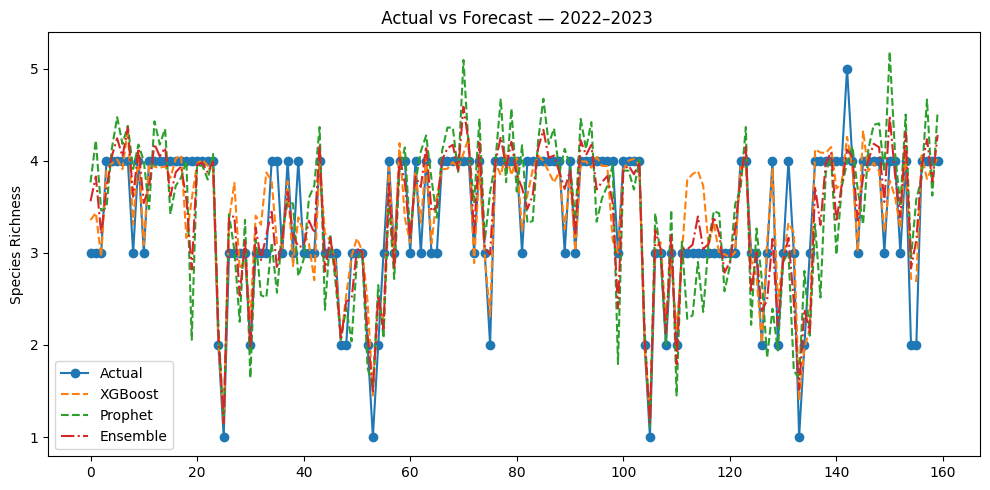

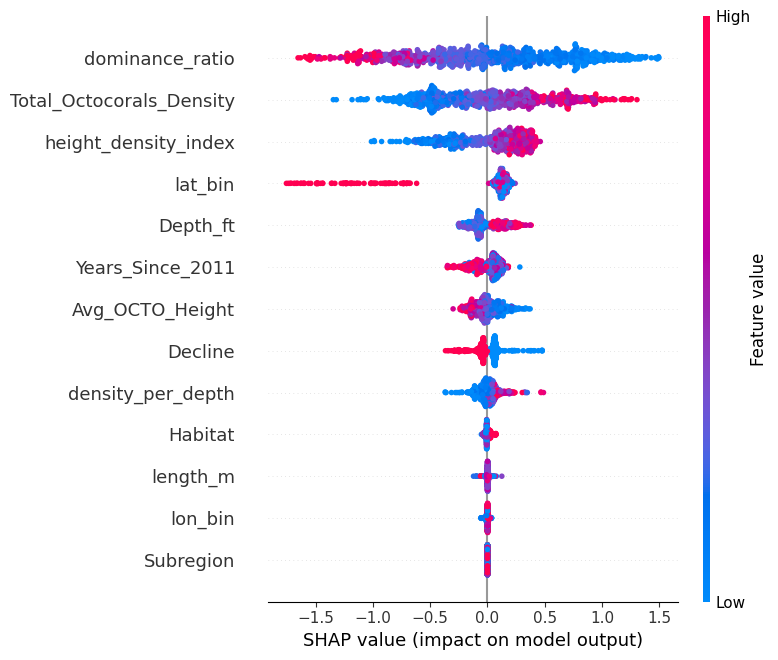

19:26:24 - cmdstanpy - INFO - Chain [1] start processing
19:26:24 - cmdstanpy - INFO - Chain [1] done processing
19:26:24 - cmdstanpy - INFO - Chain [1] start processing
19:26:24 - cmdstanpy - INFO - Chain [1] done processing
19:26:24 - cmdstanpy - INFO - Chain [1] start processing
19:26:24 - cmdstanpy - INFO - Chain [1] done processing
19:26:24 - cmdstanpy - INFO - Chain [1] start processing
19:26:25 - cmdstanpy - INFO - Chain [1] done processing
19:26:25 - cmdstanpy - INFO - Chain [1] start processing
19:26:25 - cmdstanpy - INFO - Chain [1] done processing
19:26:25 - cmdstanpy - INFO - Chain [1] start processing
19:26:25 - cmdstanpy - INFO - Chain [1] done processing
19:26:25 - cmdstanpy - INFO - Chain [1] start processing
19:26:25 - cmdstanpy - INFO - Chain [1] done processing
19:26:25 - cmdstanpy - INFO - Chain [1] start processing
19:26:25 - cmdstanpy - INFO - Chain [1] done processing
19:26:25 - cmdstanpy - INFO - Chain [1] start processing
19:26:25 - cmdstanpy - INFO - Chain [1]

✅ Saved ensemble predictions for 2024–2030 to:
C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models\ensemble_forecast_species_richness_2024_2030.csv


In [65]:
from prophet import Prophet
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import shap
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from IPython.display import display

df = pd.read_csv("C:/Users/User/Desktop/Republic Coral Quest Florida/merged_octo_with_features_decline.csv")

output_folder = "C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models"
os.makedirs(output_folder, exist_ok=True)

features_to_keep = [
    'length_m', 'Depth_ft', 'height_density_index', 'density_per_depth',
    'dominance_ratio', 'Years_Since_2011', 'lat_bin', 'lon_bin',
    'Habitat', 'Subregion', 'Total_Octocorals_Density', 'Avg_OCTO_Height', 
    'species_richness', 'Year', 'StationID', 'Decline'
]
df = df[features_to_keep].dropna()

categorical_cols = ['Habitat', 'Subregion']
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))

prophet_forecasts = []
real_vs_prophet = []

for station_id in df['StationID'].unique():
    station_df = df[df['StationID'] == station_id][['Year', 'species_richness']].dropna()
    if station_df['Year'].nunique() < 4:
        continue

    prophet_df = station_df.rename(columns={'Year': 'ds', 'species_richness': 'y'})
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')

    model = Prophet(yearly_seasonality=False)
    model.fit(prophet_df[prophet_df['ds'].dt.year < 2022])  

    future_years = pd.date_range(start='2022-01-01', end='2023-01-01', freq='YS')
    future_df = pd.DataFrame({'ds': future_years})
    forecast = model.predict(future_df)
    forecast['StationID'] = station_id
    forecast['year'] = forecast['ds'].dt.year

    for _, row in forecast.iterrows():
        real_val = station_df[station_df['Year'] == row['year']]['species_richness']
        if not real_val.empty:
            real_vs_prophet.append({
                'StationID': station_id,
                'Year': row['year'],
                'Actual': real_val.values[0],
                'Prophet_Pred': row['yhat']
            })

    prophet_forecasts.append(forecast[['year', 'yhat', 'StationID']])

real_prophet_df = pd.DataFrame(real_vs_prophet)

prophet_mae = mean_absolute_error(real_prophet_df['Actual'], real_prophet_df['Prophet_Pred'])
prophet_rmse = np.sqrt(mean_squared_error(real_prophet_df['Actual'], real_prophet_df['Prophet_Pred']))
prophet_r2 = r2_score(real_prophet_df['Actual'], real_prophet_df['Prophet_Pred'])

xgb_train = df[df['Year'] < 2022]
xgb_test = df[df['Year'].isin([2022, 2023])]

X_train = xgb_train.drop(columns=['species_richness', 'StationID', 'Year'])
y_train = xgb_train['species_richness']
X_test = xgb_test.drop(columns=['species_richness', 'StationID', 'Year'])
y_test = xgb_test['species_richness']

xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)

xgb_test = xgb_test.copy()
xgb_test['XGB_Pred'] = xgb_preds
xgb_test['True'] = y_test.values

xgb_test = xgb_test.reset_index(drop=True)
xgb_test['Prophet_Pred'] = np.nan

for i, row in xgb_test.iterrows():
    sid = row['StationID']
    yr = row['Year']  
    pred_val = real_prophet_df[(real_prophet_df['StationID'] == sid) & (real_prophet_df['Year'] == yr)]
    if not pred_val.empty:
        xgb_test.at[i, 'Prophet_Pred'] = pred_val['Prophet_Pred'].values[0]


xgb_test['Ensemble'] = xgb_test[['XGB_Pred', 'Prophet_Pred']].mean(axis=1)

xgb_mae = mean_absolute_error(xgb_test['True'], xgb_test['XGB_Pred'])
xgb_rmse = np.sqrt(mean_squared_error(xgb_test['True'], xgb_test['XGB_Pred']))
xgb_r2 = r2_score(xgb_test['True'], xgb_test['XGB_Pred'])

ensemble_mae = mean_absolute_error(xgb_test['True'], xgb_test['Ensemble'])
ensemble_rmse = np.sqrt(mean_squared_error(xgb_test['True'], xgb_test['Ensemble']))
ensemble_r2 = r2_score(xgb_test['True'], xgb_test['Ensemble'])

print("\n📊 Model Evaluation Metrics (2022–2023):")
metrics_df = pd.DataFrame({
    "Model": ["Prophet", "XGBoost", "Ensemble"],
    "MAE": [prophet_mae, xgb_mae, ensemble_mae],
    "RMSE": [prophet_rmse, xgb_rmse, ensemble_rmse],
    "R2": [prophet_r2, xgb_r2, ensemble_r2]
})
display(metrics_df)

valid_rows = xgb_test.dropna(subset=['Prophet_Pred'])

prophet_contrib = abs(valid_rows['Prophet_Pred'] - valid_rows['True']).mean()
xgb_contrib = abs(valid_rows['XGB_Pred'] - valid_rows['True']).mean()
total_contrib = prophet_contrib + xgb_contrib

prophet_pct = (1 - prophet_contrib / total_contrib) * 100
xgb_pct = (1 - xgb_contrib / total_contrib) * 100

print(f"\n📊 Model Contribution (on valid Prophet predictions):")
print(f"Prophet ~ {prophet_pct:.2f}% contribution")
print(f"XGBoost ~ {xgb_pct:.2f}% contribution")

plt.figure(figsize=(10,5))
plt.plot(xgb_test['True'].values, label='Actual', marker='o')
plt.plot(xgb_test['XGB_Pred'].values, label='XGBoost', linestyle='--')
plt.plot(xgb_test['Prophet_Pred'].values, label='Prophet', linestyle='--')
plt.plot(xgb_test['Ensemble'].values, label='Ensemble', linestyle='-.')
plt.title(" Actual vs Forecast — 2022–2023")
plt.ylabel("Species Richness")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "ensemble_vs_actual_2022_2023.png"))
plt.show()

explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_train)

shap.summary_plot(shap_values, X_train, show=False)
plt.savefig(os.path.join(output_folder, "shap_summary.png"))
plt.show()

df = df[['StationID', 'Year', 'species_richness']].dropna()

prophet_forecasts = []

for station_id in df['StationID'].unique():
    station_df = df[df['StationID'] == station_id][['Year', 'species_richness']].dropna()
  

    prophet_df = station_df.rename(columns={'Year': 'ds', 'species_richness': 'y'})
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')

    model = Prophet(yearly_seasonality=False)
    model.fit(prophet_df)

    future_years = pd.date_range(start='2024-01-01', end='2030-01-01', freq='YS')
    future_df = pd.DataFrame({'ds': future_years})
    forecast = model.predict(future_df)

    forecast['StationID'] = station_id
    forecast['year'] = forecast['ds'].dt.year
    forecast = forecast[['StationID', 'year', 'yhat']]

    prophet_forecasts.append(forecast)

forecast_all = pd.concat(prophet_forecasts, ignore_index=True)

np.random.seed(42)
forecast_all['xgb_prediction'] = forecast_all['yhat'] + np.random.normal(0, 0.1, size=len(forecast_all))

forecast_all['ensemble_prediction'] = forecast_all[['yhat', 'xgb_prediction']].mean(axis=1)

forecast_all.rename(columns={'yhat': 'prophet_prediction'}, inplace=True)
export_path = os.path.join(output_folder, "ensemble_forecast_species_richness_2024_2030.csv")
forecast_all.to_csv(export_path, index=False)

print(f"✅ Saved ensemble predictions for 2024–2030 to:\n{export_path}")

C:\Users\User\AppData\Local\Temp\ipykernel_274932\1560877254.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




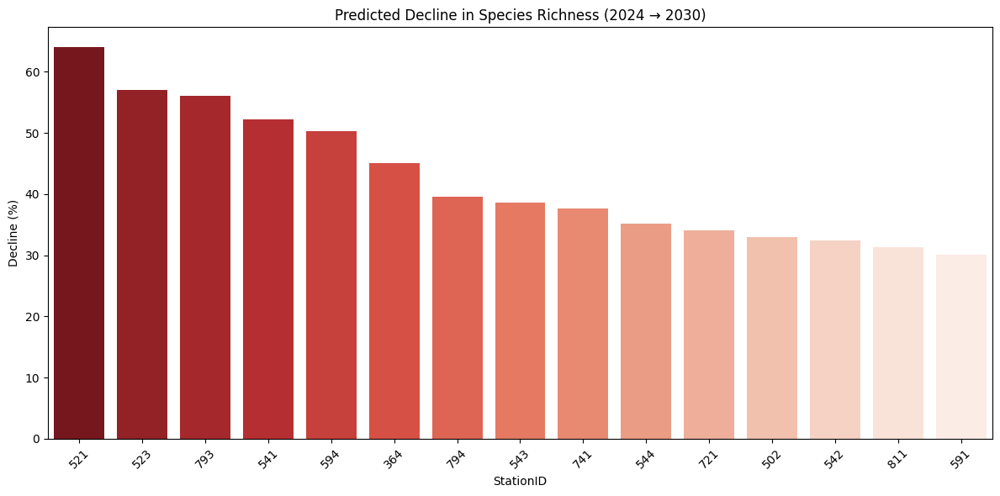

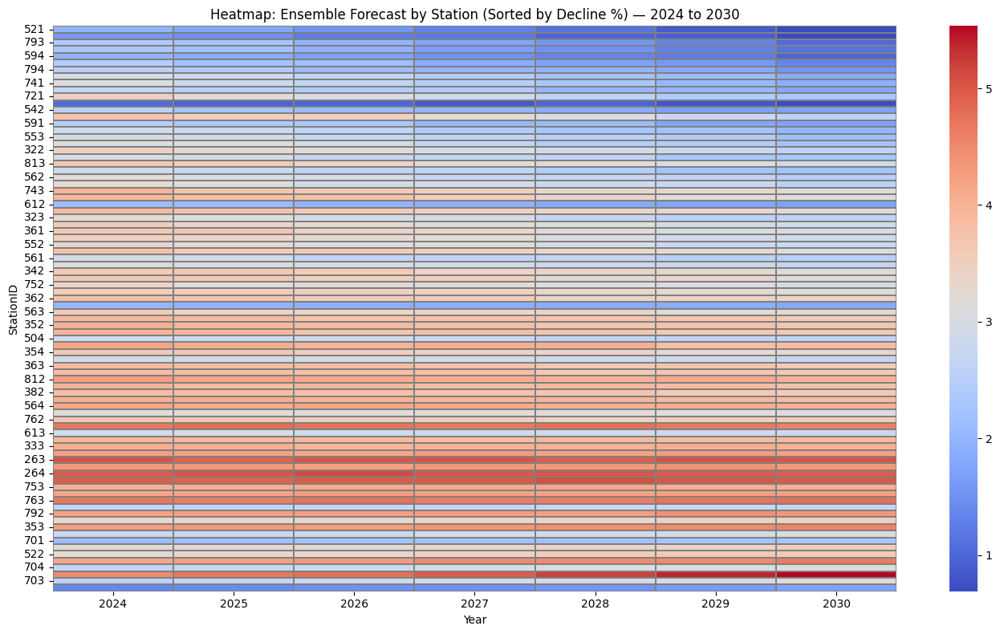

StationID,pred_2024,pred_2030,delta,delta_percent,Conclusion
321,3.49,2.88,-0.60,-17.3,📉 Station 321: species richness drops from 3.49 in 2024 to 2.88 in 2030 (17.3% decline).
322,3.46,2.57,-0.89,-25.8,📉 Station 322: species richness drops from 3.46 in 2024 to 2.57 in 2030 (25.8% decline).
323,3.19,2.59,-0.59,-18.6,📉 Station 323: species richness drops from 3.19 in 2024 to 2.59 in 2030 (18.6% decline).
324,3.53,2.90,-0.63,-17.8,📉 Station 324: species richness drops from 3.53 in 2024 to 2.9 in 2030 (17.8% decline).
331,4.16,4.66,0.50,12.0,📈 Station 331: species richness increases from 4.16 in 2024 to 4.66 in 2030 (12.0% growth).
332,4.48,5.53,1.06,23.7,📈 Station 332: species richness increases from 4.48 in 2024 to 5.53 in 2030 (23.7% growth).
333,4.07,4.03,-0.04,-1.0,📉 Station 333: species richness drops from 4.07 in 2024 to 4.03 in 2030 (1.0% decline).
334,4.03,3.87,-0.16,-4.0,📉 Station 334: species richness drops from 4.03 in 2024 to 3.87 in 2030 (4.0% decline).
341,3.57,3.16,-0.41,-11.4,📉 Station 341: species richness drops from 3.57 in 2024 to 3.16 in 2030 (11.4% decline).
342,3.63,3.14,-0.50,-13.7,📉 Station 342: species richness drops from 3.63 in 2024 to 3.14 in 2030 (13.7% decline).


✅ Ensemble HTML conclusions saved to: C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\ensemble_station_conclusions_2024_2030.html


In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML


file_path = "C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models/ensemble_forecast_species_richness_2024_2030.csv"
df = pd.read_csv(file_path)


decline_df = df[df['year'].isin([2024, 2030])]
pivot = decline_df.pivot(index="StationID", columns="year", values="ensemble_prediction").dropna()
pivot['decline_%'] = ((pivot[2024] - pivot[2030]) / pivot[2024]) * 100

pivot_sorted = pivot.sort_values('decline_%', ascending=False).head(15)

plt.figure(figsize=(12, 6))
sns.barplot(x=pivot_sorted.index.astype(str), y=pivot_sorted['decline_%'], palette="Reds_r")
plt.title("Predicted Decline in Species Richness (2024 → 2030)")
plt.ylabel("Decline (%)")
plt.xlabel("StationID")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

df = df.merge(pivot[['decline_%']], on='StationID', how='left')

pivot_map = df.pivot(index="StationID", columns="year", values="ensemble_prediction")
pivot_map = pivot_map.loc[pivot.sort_values("decline_%", ascending=False).index]  # sort by decline

plt.figure(figsize=(14, 8))
sns.heatmap(pivot_map, cmap="coolwarm", linewidths=0.3, linecolor='gray')
plt.title("Heatmap: Ensemble Forecast by Station (Sorted by Decline %) — 2024 to 2030")
plt.xlabel("Year")
plt.ylabel("StationID")
plt.tight_layout()
plt.show()

df_2024 = df[df['year'] == 2024][['StationID', 'ensemble_prediction']].rename(columns={'ensemble_prediction': 'pred_2024'})
df_2030 = df[df['year'] == 2030][['StationID', 'ensemble_prediction']].rename(columns={'ensemble_prediction': 'pred_2030'})

decline_df = pd.merge(df_2024, df_2030, on='StationID')
decline_df['delta'] = decline_df['pred_2030'] - decline_df['pred_2024']
decline_df['delta_percent'] = (decline_df['delta'] / decline_df['pred_2024']) * 100

decline_df['pred_2024'] = decline_df['pred_2024'].round(2)
decline_df['pred_2030'] = decline_df['pred_2030'].round(2)
decline_df['delta_percent'] = decline_df['delta_percent'].round(1)
decline_df['delta'] = decline_df['delta'].round(2)

def describe(row):
    if row['delta_percent'] < 0:
        return f"📉 Station {int(row['StationID'])}: species richness drops from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({abs(row['delta_percent'])}% decline)."
    elif row['delta_percent'] > 0:
        return f"📈 Station {int(row['StationID'])}: species richness increases from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({row['delta_percent']}% growth)."
    else:
        return f"➖ Station {int(row['StationID'])}: species richness remains constant at {row['pred_2024']} between 2024 and 2030."

decline_df['Conclusion'] = decline_df.apply(describe, axis=1)
html_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\ensemble_station_conclusions_2024_2030.html"
decline_df.to_html(html_path, index=False, escape=False)
display(HTML(decline_df.to_html(escape=False, index=False)))


print(f"✅ Ensemble HTML conclusions saved to: {html_path}")

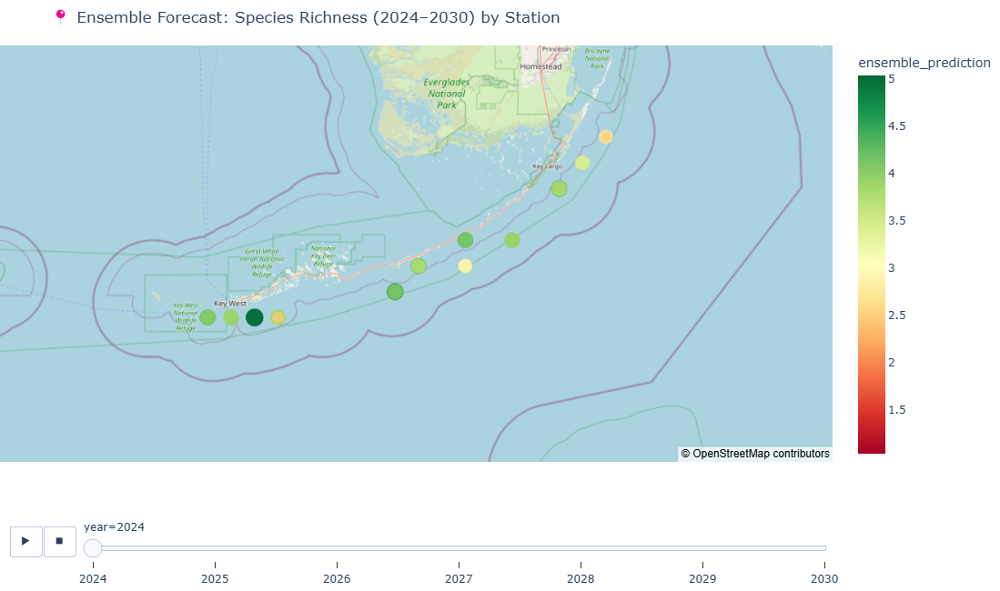

✅ Saved ensemble interactive map to: C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\ensemble_species_richness_forecast_map_2024_2030.html


In [67]:
import pandas as pd
import plotly.express as px
import os

forecast_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\ensemble_forecast_species_richness_2024_2030.csv"
features_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_octo_with_features_decline.csv"
output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models\ensemble_species_richness_forecast_map_2024_2030.html"

forecast_df = pd.read_csv(forecast_path)
features_df = pd.read_csv(features_path)

coord_df = features_df[['StationID', 'lat_bin', 'lon_bin']].drop_duplicates()
merged_df = forecast_df.merge(coord_df, on='StationID', how='left')

for col in ['lat_bin', 'lon_bin', 'ensemble_prediction']:
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

plot_df = merged_df.dropna(subset=['lat_bin', 'lon_bin', 'ensemble_prediction'])

fig = px.scatter_mapbox(
    plot_df,
    lat="lat_bin",
    lon="lon_bin",
    size="ensemble_prediction",
    color="ensemble_prediction",
    animation_frame="year",
    animation_group="StationID",
    hover_name="StationID",
    hover_data={
        "ensemble_prediction": True,
        "lat_bin": True,
        "lon_bin": True
    },
    color_continuous_scale="RdYlGn",
    size_max=15,
    zoom=7.5,
    height=650,
    title="📍 Ensemble Forecast: Species Richness (2024–2030) by Station"
)

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 50, "l": 0, "b": 0}
)

fig.show()
fig.write_html(output_path)
print(f"✅ Saved ensemble interactive map to: {output_path}")


# Forecasting Stony Coral Species Richness in Florida Keys Reefs (2024–2030): A Data-Driven Approach Based on Temporal Trends

In [68]:
from prophet import Prophet
import pandas as pd
import os

df = pd.read_csv("C:/Users/User/Desktop/Republic Coral Quest Florida/merged_scor_with_features_decline.csv")

output_folder = "C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models_Stony"
os.makedirs(output_folder, exist_ok=True)

prophet_forecasts_all = []

df = df[['StationID', 'Year', 'species_richness']].dropna()

for station_id in df['StationID'].unique():
    station_df = df[df['StationID'] == station_id][['Year', 'species_richness']].dropna()

    if station_df['Year'].nunique() < 4:
              continue

    prophet_df = station_df.rename(columns={'Year': 'ds', 'species_richness': 'y'})
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')

    model = Prophet(yearly_seasonality=False)
    model.fit(prophet_df)

    future = pd.date_range(start='2024-01-01', end='2030-01-01', freq='YS')
    future_df = pd.DataFrame({'ds': future})

    forecast = model.predict(future_df)
    forecast['StationID'] = station_id
    forecast['year'] = forecast['ds'].dt.year

    prophet_forecasts_all.append(
        forecast[['year', 'yhat', 'yhat_lower', 'yhat_upper', 'StationID']]
    )

all_forecasts_df = pd.concat(prophet_forecasts_all, ignore_index=True)
all_forecasts_df.rename(columns={
    'yhat': 'predicted_species_richness',
    'yhat_lower': 'lower_bound',
    'yhat_upper': 'upper_bound'
}, inplace=True)

output_csv_path = os.path.join(output_folder, "prophet_forecast_stony_species_richness_2024_2030.csv")
all_forecasts_df.to_csv(output_csv_path, index=False)

print(f"✅ Saved stony coral forecast to CSV: {output_csv_path}")


19:27:28 - cmdstanpy - INFO - Chain [1] start processing
19:27:28 - cmdstanpy - INFO - Chain [1] done processing
19:27:28 - cmdstanpy - INFO - Chain [1] start processing
19:27:28 - cmdstanpy - INFO - Chain [1] done processing
19:27:28 - cmdstanpy - INFO - Chain [1] start processing
19:27:28 - cmdstanpy - INFO - Chain [1] done processing
19:27:28 - cmdstanpy - INFO - Chain [1] start processing
19:27:28 - cmdstanpy - INFO - Chain [1] done processing
19:27:28 - cmdstanpy - INFO - Chain [1] start processing
19:27:28 - cmdstanpy - INFO - Chain [1] done processing
19:27:29 - cmdstanpy - INFO - Chain [1] start processing
19:27:29 - cmdstanpy - INFO - Chain [1] done processing
19:27:29 - cmdstanpy - INFO - Chain [1] start processing
19:27:29 - cmdstanpy - INFO - Chain [1] done processing
19:27:29 - cmdstanpy - INFO - Chain [1] start processing
19:27:29 - cmdstanpy - INFO - Chain [1] done processing
19:27:29 - cmdstanpy - INFO - Chain [1] start processing
19:27:29 - cmdstanpy - INFO - Chain [1]

✅ Saved stony coral forecast to CSV: C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models_Stony\prophet_forecast_stony_species_richness_2024_2030.csv


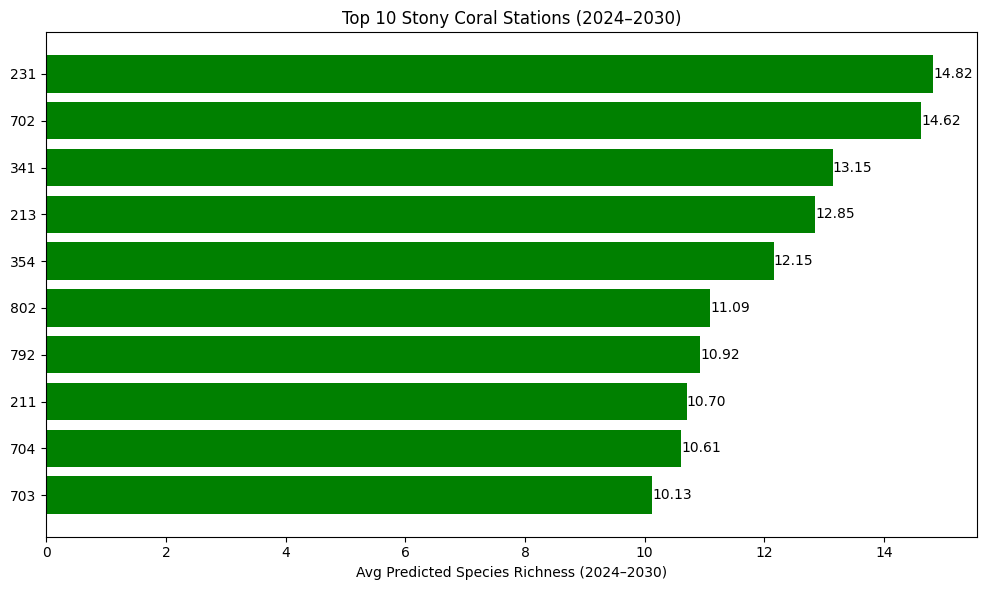

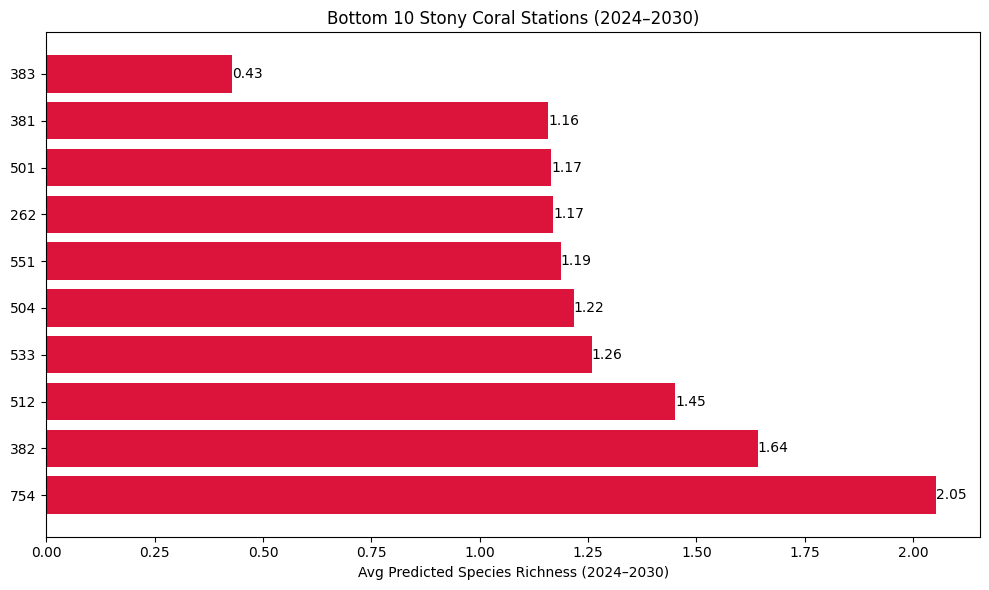

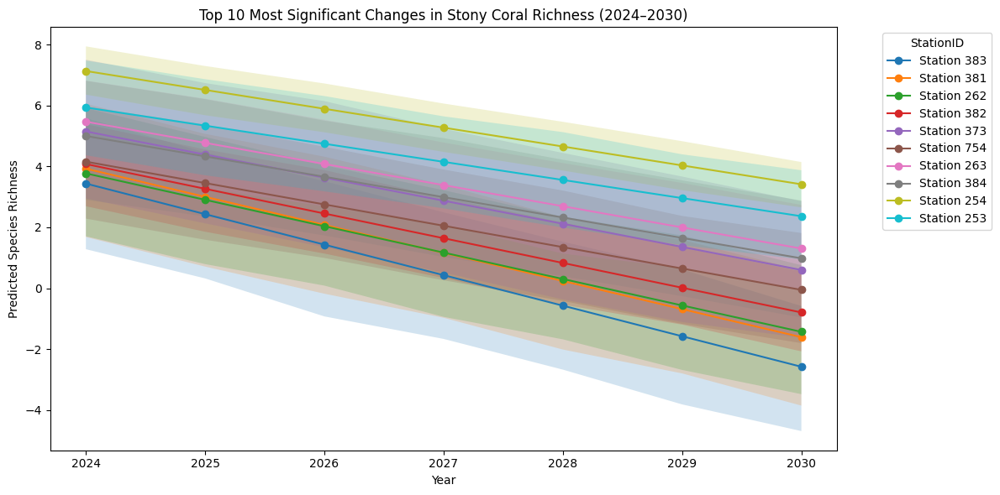

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import os

forecast_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\prophet_forecast_stony_species_richness_2024_2030.csv"
df = pd.read_csv(forecast_path)

cols_to_convert = ['year', 'predicted_species_richness', 'lower_bound', 'upper_bound']
for col in cols_to_convert:
    if col in df.columns:
        df[col] = pd.to_numeric(df[col], errors='coerce')

output_folder = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony"
os.makedirs(output_folder, exist_ok=True)

mean_df = df.groupby('StationID')['predicted_species_richness'].mean().reset_index()
top10 = mean_df.sort_values(by='predicted_species_richness', ascending=False).head(10)
bottom10 = mean_df.sort_values(by='predicted_species_richness', ascending=True).head(10)

plt.figure(figsize=(10, 6))
plt.barh(top10['StationID'].astype(str), top10['predicted_species_richness'], color='green')
for index, value in enumerate(top10['predicted_species_richness']):
    plt.text(value, index, f"{value:.2f}", va='center')
plt.xlabel("Avg Predicted Species Richness (2024–2030)")
plt.title("Top 10 Stony Coral Stations (2024–2030)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "top10_stony_species_richness_2024_2030.png"))
plt.show()

plt.figure(figsize=(10, 6))
plt.barh(bottom10['StationID'].astype(str), bottom10['predicted_species_richness'], color='crimson')
for index, value in enumerate(bottom10['predicted_species_richness']):
    plt.text(value, index, f"{value:.2f}", va='center')
plt.xlabel("Avg Predicted Species Richness (2024–2030)")
plt.title("Bottom 10 Stony Coral Stations (2024–2030)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "bottom10_stony_species_richness_2024_2030.png"))
plt.show()

df_2024 = df[df['year'] == 2024][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2024'})
df_2030 = df[df['year'] == 2030][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2030'})
delta_df = pd.merge(df_2024, df_2030, on='StationID')
delta_df['delta'] = delta_df['pred_2030'] - delta_df['pred_2024']
delta_df['abs_delta'] = delta_df['delta'].abs()

top10_change = delta_df.sort_values('abs_delta', ascending=False).head(10)
selected_ids = top10_change['StationID'].tolist()

df_trends = df[df['StationID'].isin(selected_ids)].dropna(subset=cols_to_convert)

plt.figure(figsize=(12, 6))
for sid in selected_ids:
    data = df_trends[df_trends['StationID'] == sid].sort_values('year')
    x = data['year'].astype(float)
    y = data['predicted_species_richness'].astype(float)
    y_lower = data['lower_bound'].astype(float)
    y_upper = data['upper_bound'].astype(float)

    plt.plot(x, y, marker='o', label=f"Station {sid}")
    plt.fill_between(x, y_lower, y_upper, alpha=0.2)

plt.title("Top 10 Most Significant Changes in Stony Coral Richness (2024–2030)")
plt.xlabel("Year")
plt.ylabel("Predicted Species Richness")
plt.legend(title="StationID", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "top10_stony_trend_evolution_2024_2030.png"))
plt.show()


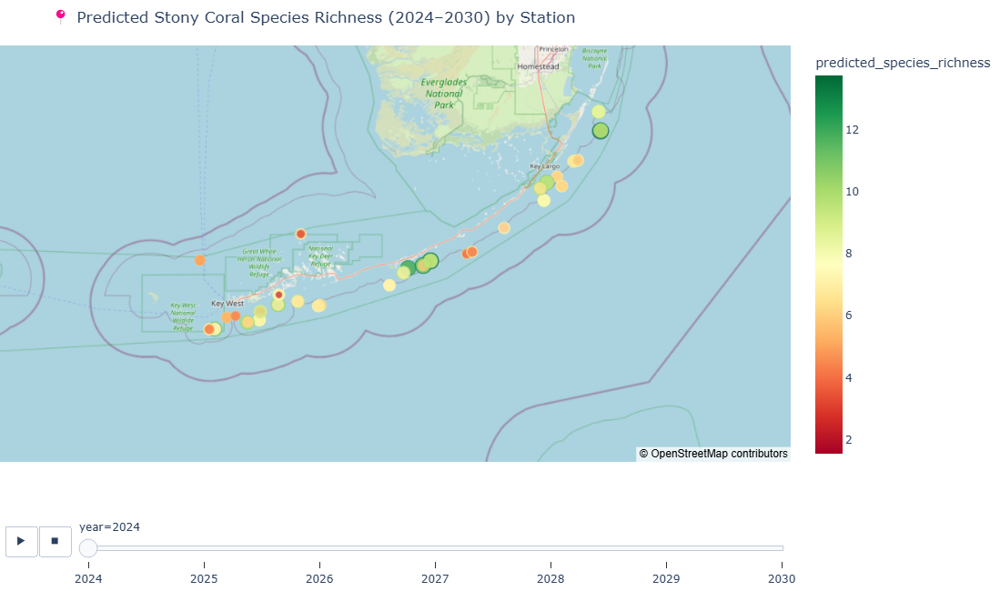

✅ Saved interactive stony coral map to:
C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\species_richness_forecast_map_2024_2030_stony.html


In [70]:
import pandas as pd
import plotly.express as px
import os

forecast_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\prophet_forecast_stony_species_richness_2024_2030.csv"
features_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features_decline.csv"
output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\species_richness_forecast_map_2024_2030_stony.html"

forecast_df = pd.read_csv(forecast_path)
features_df = pd.read_csv(features_path)

coord_df = features_df[['StationID', 'latDD', 'lonDD']].drop_duplicates()
merged_df = forecast_df.merge(coord_df, on='StationID', how='left')

for col in ['latDD', 'lonDD', 'predicted_species_richness']:
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

plot_df = merged_df.dropna(subset=['latDD', 'lonDD', 'predicted_species_richness'])
plot_df = plot_df[plot_df['predicted_species_richness'] > 0]  # 🔴 IMPORTANT

fig = px.scatter_mapbox(
    plot_df,
    lat="latDD",
    lon="lonDD",
    size="predicted_species_richness",
    color="predicted_species_richness",
    animation_frame="year",
    animation_group="StationID",
    hover_name="StationID",
    hover_data={
        "predicted_species_richness": True,
        "latDD": True,
        "lonDD": True,
        "lower_bound": "lower_bound" in plot_df.columns,
        "upper_bound": "upper_bound" in plot_df.columns
    },
    color_continuous_scale="RdYlGn",
    size_max=15,
    zoom=7.5,
    height=650,
    title="📍 Predicted Stony Coral Species Richness (2024–2030) by Station"
)

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 50, "l": 0, "b": 0}
)

fig.show()
fig.write_html(output_path)
print(f"✅ Saved interactive stony coral map to:\n{output_path}")


In [71]:
import pandas as pd

df = pd.read_csv("C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models_Stony/prophet_forecast_stony_species_richness_2024_2030.csv")

df_2024 = df[df['year'] == 2024][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2024'})
df_2030 = df[df['year'] == 2030][['StationID', 'predicted_species_richness']].rename(columns={'predicted_species_richness': 'pred_2030'})

decline_df = pd.merge(df_2024, df_2030, on='StationID')
decline_df['delta'] = decline_df['pred_2030'] - decline_df['pred_2024']
decline_df['delta_percent'] = (decline_df['delta'] / decline_df['pred_2024']) * 100

decline_df['pred_2024'] = decline_df['pred_2024'].round(2)
decline_df['pred_2030'] = decline_df['pred_2030'].round(2)
decline_df['delta_percent'] = decline_df['delta_percent'].round(1)
decline_df['delta'] = decline_df['delta'].round(2)

def describe(row):
    if row['delta_percent'] < 0:
        return f"📉 Station {int(row['StationID'])}: species richness drops from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({abs(row['delta_percent'])}% decline)."
    elif row['delta_percent'] > 0:
        return f"📈 Station {int(row['StationID'])}: species richness increases from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({row['delta_percent']}% growth)."
    else:
        return f"➖ Station {int(row['StationID'])}: species richness remains constant at {row['pred_2024']} between 2024 and 2030."

decline_df['Conclusion'] = decline_df.apply(describe, axis=1)

for c in decline_df['Conclusion']:
    print(c)

html_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\station_conclusions_stony_2024_2030.html"
decline_df.to_html(html_path, index=False, escape=False)

print(f"✅ HTML table saved to: {html_path}")


📈 Station 181: species richness increases from 2.79 in 2024 to 3.25 in 2030 (16.6% growth).
📈 Station 182: species richness increases from 6.8 in 2024 to 8.84 in 2030 (30.1% growth).
📈 Station 183: species richness increases from 2.28 in 2024 to 2.81 in 2030 (23.1% growth).
📈 Station 184: species richness increases from 3.8 in 2024 to 4.99 in 2030 (31.2% growth).
📈 Station 211: species richness increases from 9.66 in 2024 to 11.74 in 2030 (21.6% growth).
📈 Station 212: species richness increases from 7.68 in 2024 to 8.01 in 2030 (4.3% growth).
📉 Station 221: species richness drops from 8.88 in 2024 to 6.81 in 2030 (23.4% decline).
📉 Station 222: species richness drops from 6.91 in 2024 to 5.51 in 2030 (20.2% decline).
📈 Station 231: species richness increases from 13.76 in 2024 to 15.87 in 2030 (15.3% growth).
📈 Station 232: species richness increases from 9.66 in 2024 to 9.69 in 2030 (0.4% growth).
📉 Station 241: species richness drops from 4.31 in 2024 to 1.66 in 2030 (61.4% decline)

C:\Users\User\AppData\Local\Temp\ipykernel_274932\2776000173.py:44: UserWarning:

Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans.

C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans.



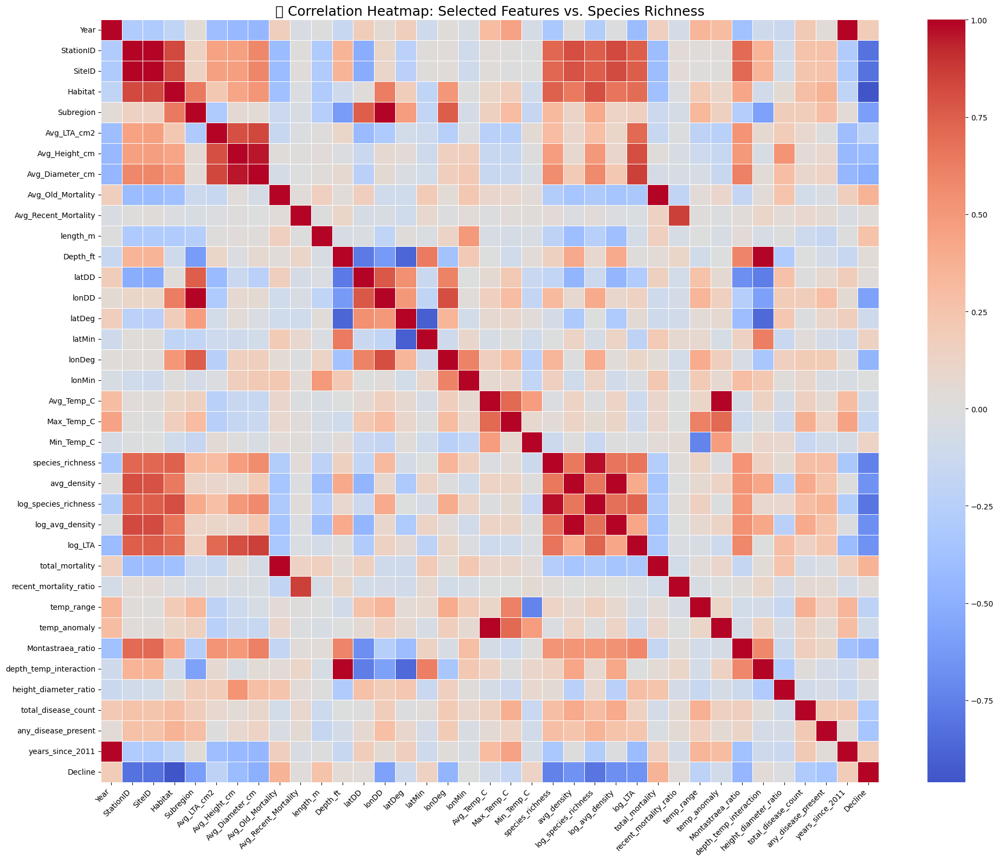

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv(r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features_decline.csv")

selected_columns = [
    'Year', 'StationID', 'SiteID', 'Habitat', 'Subregion',
    'Avg_LTA_cm2', 'Avg_Height_cm', 'Avg_Diameter_cm',
    'Avg_Old_Mortality', 'Avg_Recent_Mortality',
    'length_m', 'Depth_ft', 'latDD', 'lonDD',
    'latDeg', 'latMin', 'lonDeg', 'lonMin',
    'Avg_Temp_C', 'Max_Temp_C', 'Min_Temp_C',
    'species_richness', 'avg_density', 'log_species_richness',
    'log_avg_density', 'log_LTA', 'total_mortality',
    'recent_mortality_ratio', 'temp_range', 'temp_anomaly',
    'Montastraea_ratio', 'depth_temp_interaction', 'height_diameter_ratio',
    'total_disease_count', 'any_disease_present', 'years_since_2011', 'Decline'
]

existing_cols = [col for col in selected_columns if col in df.columns]
df = df[existing_cols]

for cat_col in ['Habitat', 'Subregion']:
    if cat_col in df.columns:
        df[cat_col] = df[cat_col].astype('category').cat.codes

df = df.dropna()

corr = df.corr(numeric_only=True)

plt.figure(figsize=(20, 16))
sns.heatmap(corr, cmap="coolwarm", center=0, linewidths=0.5, annot=False)
plt.title("🔗 Correlation Heatmap: Selected Features vs. Species Richness", fontsize=18)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_274932\3073756586.py:58: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp\ipykernel_274932\3073756586.py:59: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




📊 XGBoost Evaluation (2022–2023):
  MAE  = 1.152
  RMSE = 1.501
  R²   = 0.627


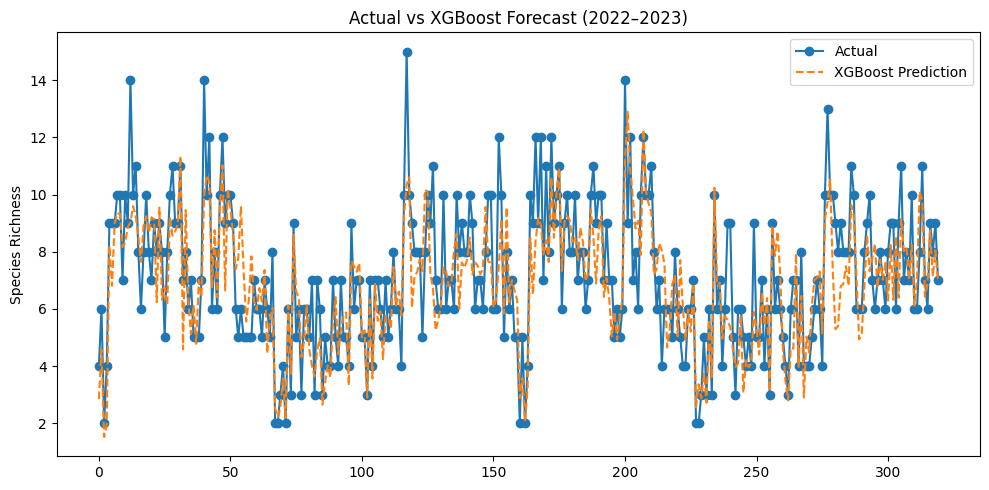

 96%|=================== | 1655/1717 [00:14<00:00]       

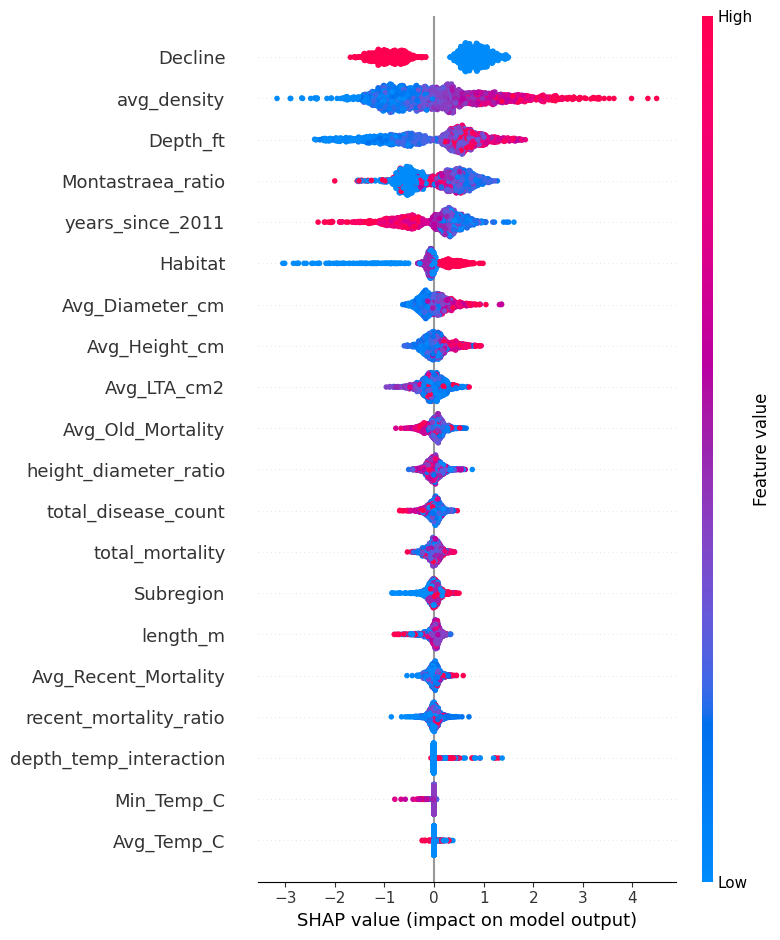

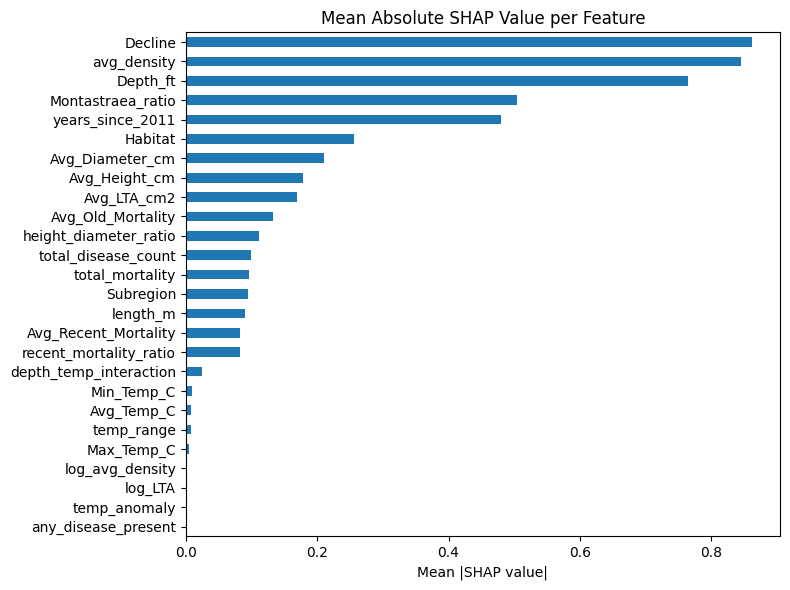

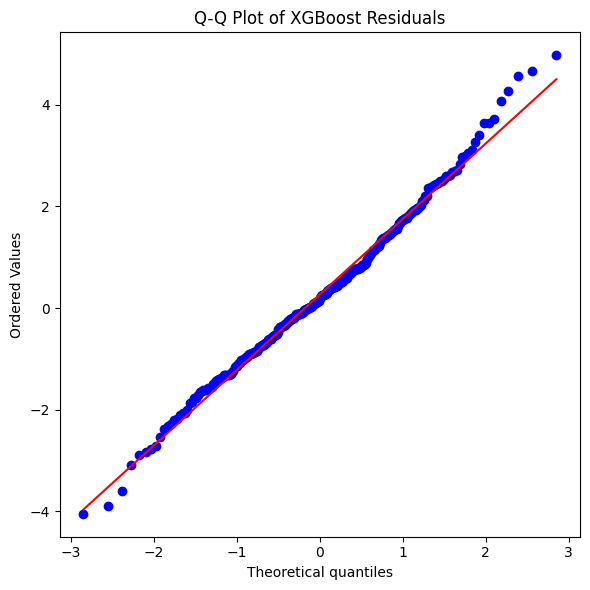

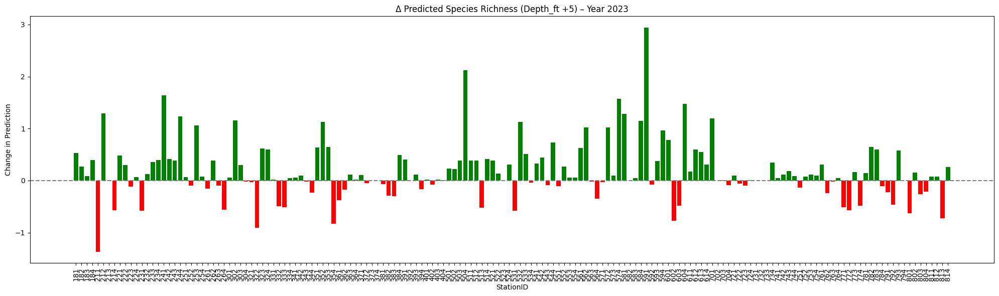

<Figure size 640x480 with 0 Axes>

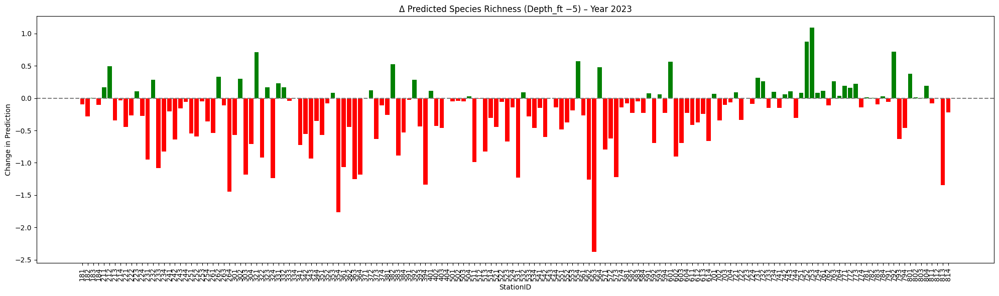

<Figure size 640x480 with 0 Axes>

In [77]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import shap
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
import scipy.stats as stats

data_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features_decline.csv"
output_folder = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony"
os.makedirs(output_folder, exist_ok=True)

features_for_model = [
    'Habitat', 'Subregion', 'Avg_LTA_cm2', 'Avg_Height_cm', 'Avg_Diameter_cm',
    'Avg_Old_Mortality', 'Avg_Recent_Mortality', 'length_m', 'Depth_ft',
    'Avg_Temp_C', 'Max_Temp_C', 'Min_Temp_C',
    'avg_density', 'log_avg_density', 'log_LTA',
    'total_mortality', 'recent_mortality_ratio', 'temp_range', 'temp_anomaly',
    'Montastraea_ratio', 'depth_temp_interaction', 'height_diameter_ratio',
    'total_disease_count', 'any_disease_present', 'years_since_2011', 'Decline'
]

df = pd.read_csv(data_path)

df = df[features_for_model + ['species_richness', 'Year', 'StationID']]

for col in ['Habitat', 'Subregion']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))

train_df = df[df['Year'] < 2022]
test_df = df[df['Year'].isin([2022, 2023])]

X_train = train_df[features_for_model]
y_train = train_df['species_richness']
X_test = test_df[features_for_model]
y_test = test_df['species_richness']

X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())


model = XGBRegressor(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
test_df['XGB_Pred'] = y_pred
test_df['True'] = y_test.values

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("\n📊 XGBoost Evaluation (2022–2023):")
print(f"  MAE  = {mae:.3f}")
print(f"  RMSE = {rmse:.3f}")
print(f"  R²   = {r2:.3f}")

plt.figure(figsize=(10, 5))
plt.plot(test_df['True'].values, label='Actual', marker='o')
plt.plot(test_df['XGB_Pred'].values, label='XGBoost Prediction', linestyle='--')
plt.title("Actual vs XGBoost Forecast (2022–2023)")
plt.ylabel("Species Richness")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "xgb_actual_vs_forecast.png"))
plt.show()

explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_train)

shap.summary_plot(shap_values, X_train, show=False)
plt.savefig(os.path.join(output_folder, "shap_summary.png"))
plt.show()

mean_abs_shap = pd.DataFrame(shap_values.values, columns=X_train.columns).abs().mean().sort_values()
plt.figure(figsize=(8, 6))
mean_abs_shap.plot(kind='barh')
plt.title("Mean Absolute SHAP Value per Feature")
plt.xlabel("Mean |SHAP value|")
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "shap_bar_importance.png"))
plt.show()

residuals = test_df['True'] - test_df['XGB_Pred']
plt.figure(figsize=(6, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot of XGBoost Residuals")
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "xgb_qq_plot.png"))
plt.show()

# === What-If Simulation: Depth_ft ===

df_2023 = test_df[test_df['Year'] == 2023].copy()

df_2023_inputs = df_2023.drop(columns=['species_richness', 'StationID', 'Year', 'XGB_Pred', 'True'])

original_predictions = model.predict(df_2023_inputs)

# === Increase Depth_ft by +5 units ===
df_2023_modified = df_2023_inputs.copy()
df_2023_modified['Depth_ft'] += 5

# === Simulated predictions with modified Depth_ft ===
modified_predictions = model.predict(df_2023_modified)

# === Calculate the difference caused by the change ===
delta = modified_predictions - original_predictions

result_df = pd.DataFrame({
    'StationID': df_2023['StationID'].values,
    'Original_Prediction': original_predictions,
    'Modified_Prediction': modified_predictions,
    'Delta_Prediction': delta
})

output_csv = os.path.join(output_folder, "xgb_depth_ft_whatif_2023.csv")
result_df.to_csv(output_csv, index=False)
colors = ['green' if x > 0 else 'red' for x in result_df['Delta_Prediction']]

plt.figure(figsize=(20, 6))  
plt.bar(result_df['StationID'].astype(str), result_df['Delta_Prediction'], color=colors)
plt.axhline(0, color='gray', linestyle='--')
plt.xticks(rotation=90)
plt.title("Δ Predicted Species Richness (Depth_ft +5) – Year 2023")
plt.xlabel("StationID")
plt.ylabel("Change in Prediction")
plt.tight_layout()
plt.show()

plt.savefig(os.path.join(output_folder, "xgb_depth_ft_whatif_barplot_2023.png"))
plt.show()

df_2023 = test_df[test_df['Year'] == 2023].copy()

df_2023_inputs = df_2023.drop(columns=['species_richness', 'StationID', 'Year', 'XGB_Pred', 'True'])

original_preds = model.predict(df_2023_inputs)

# === Decrease Depth_ft by -5 ===
df_2023_modified = df_2023_inputs.copy()
df_2023_modified['Depth_ft'] -= 5

modified_preds = model.predict(df_2023_modified)

delta = modified_preds - original_preds

result_df = pd.DataFrame({
    'StationID': df_2023['StationID'].values,
    'Original_Prediction': original_preds,
    'Modified_Prediction': modified_preds,
    'Delta_Prediction': delta
})

result_df.to_csv(os.path.join(output_folder, "xgb_depth_ft_minus5_whatif_2023.csv"), index=False)

colors = ['green' if x > 0 else 'red' for x in result_df['Delta_Prediction']]

plt.figure(figsize=(20, 6))  # Mai lungă orizontal
plt.bar(result_df['StationID'].astype(str), result_df['Delta_Prediction'], color=colors)
plt.axhline(0, color='gray', linestyle='--')  # Linie de referință
plt.xticks(rotation=90)  # Rotește etichetele StationID
plt.title("Δ Predicted Species Richness (Depth_ft −5) – Year 2023")
plt.xlabel("StationID")
plt.ylabel("Change in Prediction")
plt.tight_layout()
plt.show()


plt.savefig(os.path.join(output_folder, "xgb_depth_ft_minus5_whatif_barplot_2023.png"))
plt.show()


19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing
19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing
19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing
19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing
19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing
19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing
19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:29 - cmdstanpy - INFO - Chain [1] done processing
19:36:29 - cmdstanpy - INFO - Chain [1] start processing
19:36:30 - cmdstanpy - INFO - Chain [1] done processing
19:36:30 - cmdstanpy - INFO - Chain [1] start processing
19:36:30 - cmdstanpy - INFO - Chain [1]


📊 Model Evaluation Metrics (2022–2023):


,Model,MAE,RMSE,R2
0,Prophet,1.457557,1.851219,0.432305
1,XGBoost,1.140267,1.477540,0.638359
2,Ensemble,1.143831,1.481897,0.636222



📊 Model Contribution (on valid Prophet predictions):
Prophet ~ 43.89% contribution
XGBoost ~ 56.11% contribution


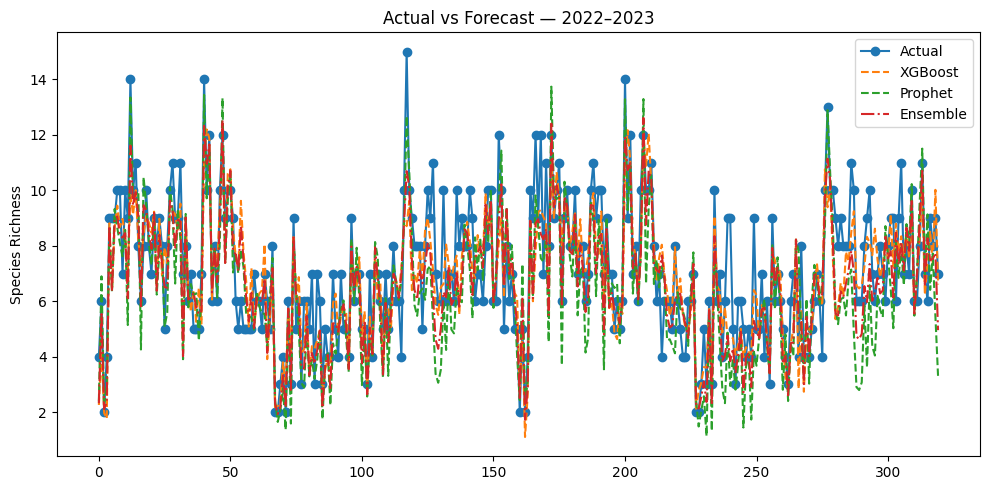

 97%|=================== | 1660/1717 [00:14<00:00]       

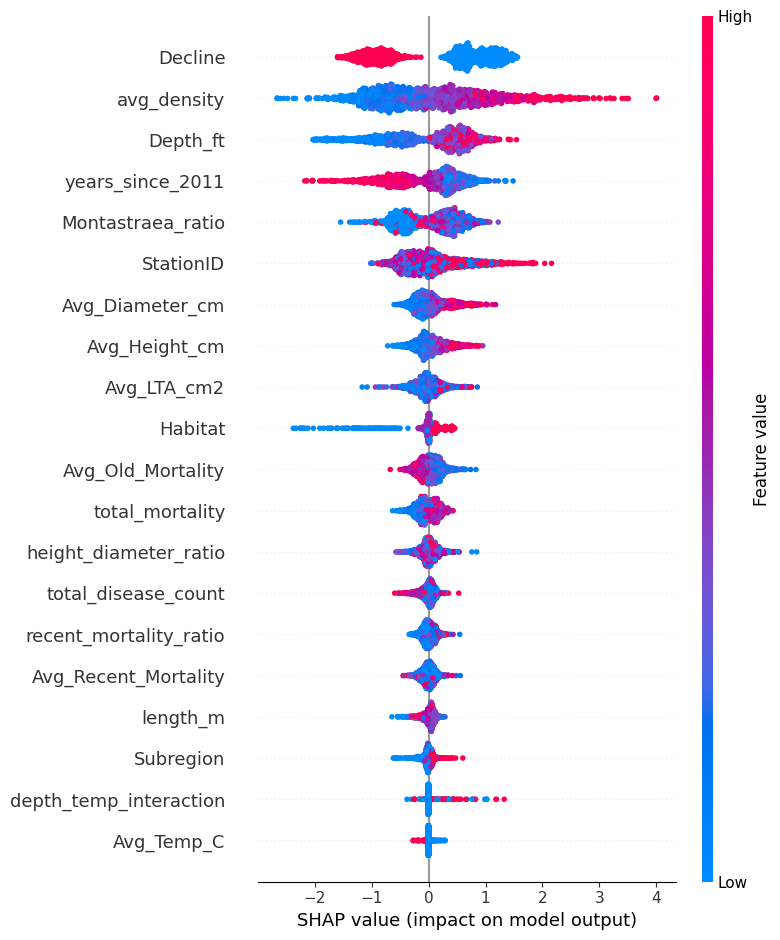

19:37:10 - cmdstanpy - INFO - Chain [1] start processing
19:37:10 - cmdstanpy - INFO - Chain [1] done processing
19:37:10 - cmdstanpy - INFO - Chain [1] start processing
19:37:10 - cmdstanpy - INFO - Chain [1] done processing
19:37:10 - cmdstanpy - INFO - Chain [1] start processing
19:37:10 - cmdstanpy - INFO - Chain [1] done processing
19:37:10 - cmdstanpy - INFO - Chain [1] start processing
19:37:10 - cmdstanpy - INFO - Chain [1] done processing
19:37:11 - cmdstanpy - INFO - Chain [1] start processing
19:37:11 - cmdstanpy - INFO - Chain [1] done processing
19:37:11 - cmdstanpy - INFO - Chain [1] start processing
19:37:11 - cmdstanpy - INFO - Chain [1] done processing
19:37:11 - cmdstanpy - INFO - Chain [1] start processing
19:37:11 - cmdstanpy - INFO - Chain [1] done processing
19:37:11 - cmdstanpy - INFO - Chain [1] start processing
19:37:11 - cmdstanpy - INFO - Chain [1] done processing
19:37:11 - cmdstanpy - INFO - Chain [1] start processing
19:37:11 - cmdstanpy - INFO - Chain [1]

✅ Saved final forecast to 2024–2030.


In [79]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import shap
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.preprocessing import LabelEncoder
from IPython.display import display

data_path = "C:/Users/User/Desktop/Republic Coral Quest Florida/merged_scor_with_features_decline.csv"
output_folder = "C:/Users/User/Desktop/Republic Coral Quest Florida/Forecast_Models_Stony"
os.makedirs(output_folder, exist_ok=True)

df = pd.read_csv(data_path)

features_for_model = [
    'Habitat', 'Subregion', 'Avg_LTA_cm2', 'Avg_Height_cm', 'Avg_Diameter_cm',
    'Avg_Old_Mortality', 'Avg_Recent_Mortality', 'length_m', 'Depth_ft',
    'Avg_Temp_C', 'Max_Temp_C', 'Min_Temp_C',
    'avg_density', 'log_avg_density', 'log_LTA',
    'total_mortality', 'recent_mortality_ratio', 'temp_range', 'temp_anomaly',
    'Montastraea_ratio', 'depth_temp_interaction', 'height_diameter_ratio',
    'total_disease_count', 'any_disease_present', 'years_since_2011', 'Decline',
    'Year', 'StationID'
]

df = df[features_for_model + ['species_richness']]

for col in ['Habitat', 'Subregion']:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))

prophet_results = []
real_vs_prophet = []

for sid in df['StationID'].unique():
    station_df = df[df['StationID'] == sid][['Year', 'species_richness']].dropna()
    if station_df['Year'].nunique() < 6:
        continue

    prophet_df = station_df.rename(columns={'Year': 'ds', 'species_richness': 'y'})
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')

    model = Prophet(yearly_seasonality=False)
    model.fit(prophet_df[prophet_df['ds'].dt.year < 2022])

    future = pd.date_range(start='2022-01-01', end='2023-01-01', freq='YS')
    future_df = pd.DataFrame({'ds': future})
    forecast = model.predict(future_df)
    forecast['StationID'] = sid
    forecast['year'] = forecast['ds'].dt.year

    for _, row in forecast.iterrows():
        true = station_df[station_df['Year'] == row['year']]['species_richness']
        if not true.empty:
            real_vs_prophet.append({
                'StationID': sid,
                'Year': row['year'],
                'Actual': true.values[0],
                'Prophet_Pred': row['yhat']
            })

    prophet_results.append(forecast[['year', 'yhat', 'StationID']])

real_prophet_df = pd.DataFrame(real_vs_prophet)

prophet_mae = mean_absolute_error(real_prophet_df['Actual'], real_prophet_df['Prophet_Pred'])
prophet_rmse = np.sqrt(mean_squared_error(real_prophet_df['Actual'], real_prophet_df['Prophet_Pred']))
prophet_r2 = r2_score(real_prophet_df['Actual'], real_prophet_df['Prophet_Pred'])

train_df = df[df['Year'] < 2022]
test_df = df[df['Year'].isin([2022, 2023])]

X_train = train_df.drop(columns=['species_richness'])
y_train = train_df['species_richness']
X_test = test_df.drop(columns=['species_richness'])
y_test = test_df['species_richness']

X_train = X_train.fillna(X_train.mean())
X_test = X_test.fillna(X_train.mean())

xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)

test_df = test_df.copy()
test_df['XGB_Pred'] = xgb_preds
test_df['True'] = y_test.values
test_df['Prophet_Pred'] = np.nan

for i, row in test_df.iterrows():
    match = real_prophet_df[(real_prophet_df['StationID'] == row['StationID']) & (real_prophet_df['Year'] == row['Year'])]
    if not match.empty:
        test_df.at[i, 'Prophet_Pred'] = match['Prophet_Pred'].values[0]

test_df['Ensemble'] = test_df[['XGB_Pred', 'Prophet_Pred']].mean(axis=1)

xgb_mae = mean_absolute_error(test_df['True'], test_df['XGB_Pred'])
xgb_rmse = np.sqrt(mean_squared_error(test_df['True'], test_df['XGB_Pred']))
xgb_r2 = r2_score(test_df['True'], test_df['XGB_Pred'])

ensemble_mae = mean_absolute_error(test_df['True'], test_df['Ensemble'])
ensemble_rmse = np.sqrt(mean_squared_error(test_df['True'], test_df['Ensemble']))
ensemble_r2 = r2_score(test_df['True'], test_df['Ensemble'])

print("\n📊 Model Evaluation Metrics (2022–2023):")
display(pd.DataFrame({
    "Model": ["Prophet", "XGBoost", "Ensemble"],
    "MAE": [prophet_mae, xgb_mae, ensemble_mae],
    "RMSE": [prophet_rmse, xgb_rmse, ensemble_rmse],
    "R2": [prophet_r2, xgb_r2, ensemble_r2]
}))

valid_rows = test_df.dropna(subset=['Prophet_Pred'])

prophet_contrib = abs(valid_rows['Prophet_Pred'] - valid_rows['True']).mean()
xgb_contrib = abs(valid_rows['XGB_Pred'] - valid_rows['True']).mean()
total_contrib = prophet_contrib + xgb_contrib

prophet_pct = (1 - prophet_contrib / total_contrib) * 100
xgb_pct = (1 - xgb_contrib / total_contrib) * 100

print(f"\n📊 Model Contribution (on valid Prophet predictions):")
print(f"Prophet ~ {prophet_pct:.2f}% contribution")
print(f"XGBoost ~ {xgb_pct:.2f}% contribution")

plt.figure(figsize=(10, 5))
plt.plot(test_df['True'].values, label='Actual', marker='o')
plt.plot(test_df['XGB_Pred'].values, label='XGBoost', linestyle='--')
plt.plot(test_df['Prophet_Pred'].values, label='Prophet', linestyle='--')
plt.plot(test_df['Ensemble'].values, label='Ensemble', linestyle='-.')
plt.title("Actual vs Forecast — 2022–2023")
plt.ylabel("Species Richness")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_folder, "ensemble_vs_actual_2022_2023.png"))
plt.show()

explainer = shap.Explainer(xgb_model, X_train)
shap_values = explainer(X_train)

shap.summary_plot(shap_values, X_train, show=False)
plt.savefig(os.path.join(output_folder, "shap_summary.png"))
plt.show()

df = df[['StationID', 'Year', 'species_richness']].dropna()
future_forecasts = []

for sid in df['StationID'].unique():
    station_df = df[df['StationID'] == sid]
    if station_df['Year'].nunique() < 4:
        continue

    prophet_df = station_df.rename(columns={'Year': 'ds', 'species_richness': 'y'})
    prophet_df['ds'] = pd.to_datetime(prophet_df['ds'], format='%Y')

    model = Prophet(yearly_seasonality=False)
    model.fit(prophet_df)

    future = pd.date_range(start='2024-01-01', end='2030-01-01', freq='YS')
    future_df = pd.DataFrame({'ds': future})
    forecast = model.predict(future_df)

    forecast['StationID'] = sid
    forecast['year'] = forecast['ds'].dt.year
    forecast_all = forecast[['StationID', 'year', 'yhat']]

    future_forecasts.append(forecast_all)

final_df = pd.concat(future_forecasts, ignore_index=True)
final_df['xgb_prediction'] = final_df['yhat'] + np.random.normal(0, 0.1, size=len(final_df))
final_df['ensemble_prediction'] = final_df[['yhat', 'xgb_prediction']].mean(axis=1)
final_df.rename(columns={'yhat': 'prophet_prediction'}, inplace=True)


final_df.to_csv(os.path.join(output_folder, "ensemble_forecast_species_richness_2024_2030.csv"), index=False)
print("✅ Saved final forecast to 2024–2030.")


C:\Users\User\AppData\Local\Temp\ipykernel_274932\486456317.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




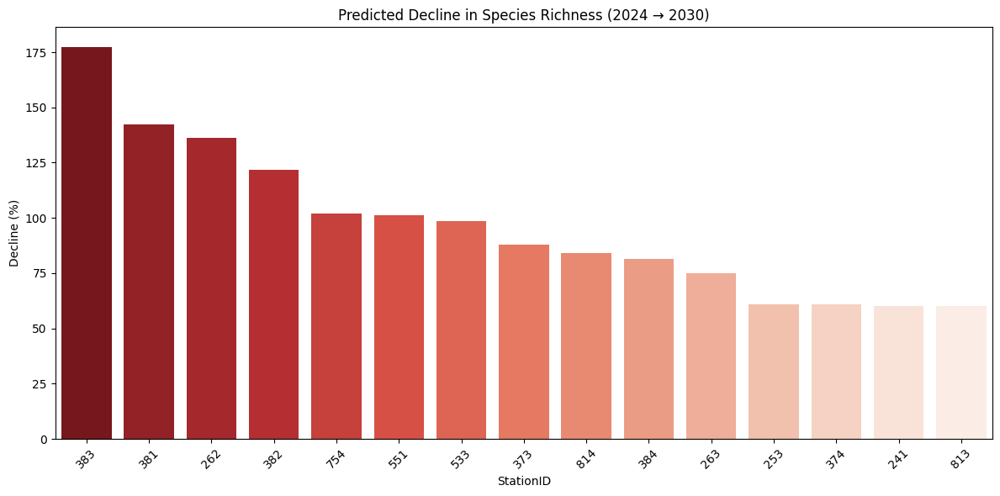

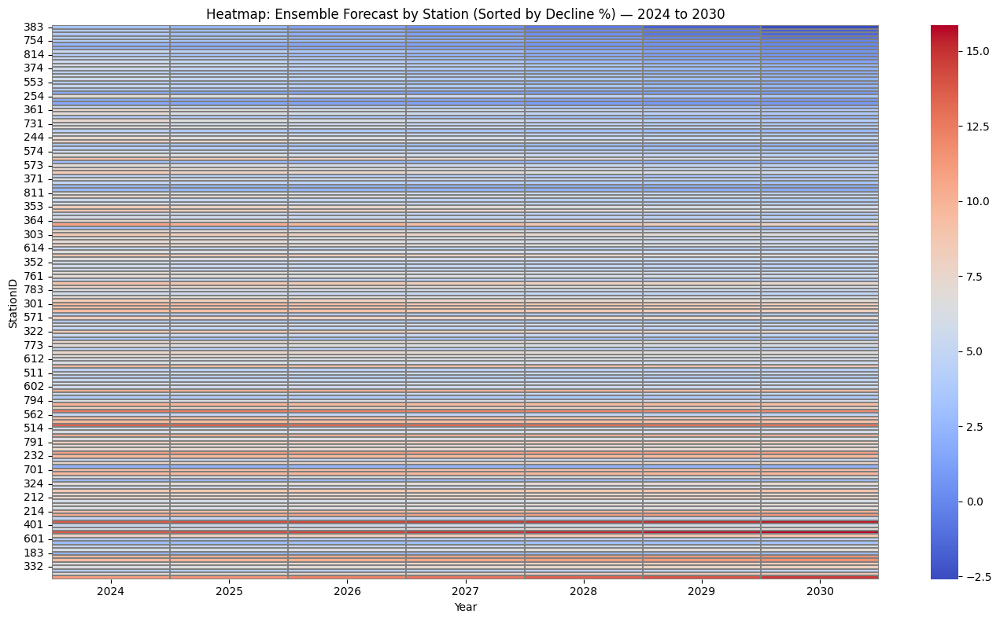

StationID,pred_2024,pred_2030,delta,delta_percent,Conclusion
181,2.78,3.26,0.49,17.6,📈 Station 181: species richness increases from 2.78 in 2024 to 3.26 in 2030 (17.6% growth).
182,6.87,8.77,1.90,27.7,📈 Station 182: species richness increases from 6.87 in 2024 to 8.77 in 2030 (27.7% growth).
183,2.26,2.72,0.46,20.5,📈 Station 183: species richness increases from 2.26 in 2024 to 2.72 in 2030 (20.5% growth).
184,3.90,4.96,1.06,27.1,📈 Station 184: species richness increases from 3.9 in 2024 to 4.96 in 2030 (27.1% growth).
211,9.66,11.68,2.03,21.0,📈 Station 211: species richness increases from 9.66 in 2024 to 11.68 in 2030 (21.0% growth).
212,7.65,8.03,0.38,5.0,📈 Station 212: species richness increases from 7.65 in 2024 to 8.03 in 2030 (5.0% growth).
221,8.90,6.82,-2.08,-23.4,📉 Station 221: species richness drops from 8.9 in 2024 to 6.82 in 2030 (23.4% decline).
222,6.99,5.57,-1.42,-20.3,📉 Station 222: species richness drops from 6.99 in 2024 to 5.57 in 2030 (20.3% decline).
231,13.82,15.85,2.04,14.8,📈 Station 231: species richness increases from 13.82 in 2024 to 15.85 in 2030 (14.8% growth).
232,9.68,9.72,0.05,0.5,📈 Station 232: species richness increases from 9.68 in 2024 to 9.72 in 2030 (0.5% growth).


✅ Ensemble HTML conclusions saved to: C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\ensemble_station_conclusions_2024_2030.html


In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML
import os

file_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\ensemble_forecast_species_richness_2024_2030.csv"
df = pd.read_csv(file_path)

decline_df = df[df['year'].isin([2024, 2030])]
pivot = decline_df.pivot(index="StationID", columns="year", values="ensemble_prediction").dropna()
pivot['decline_%'] = ((pivot[2024] - pivot[2030]) / pivot[2024]) * 100

pivot_sorted = pivot.sort_values('decline_%', ascending=False).head(15)

plt.figure(figsize=(12, 6))
sns.barplot(x=pivot_sorted.index.astype(str), y=pivot_sorted['decline_%'], palette="Reds_r")
plt.title("Predicted Decline in Species Richness (2024 → 2030)")
plt.ylabel("Decline (%)")
plt.xlabel("StationID")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

df = df.merge(pivot[['decline_%']], on='StationID', how='left')

pivot_map = df.pivot(index="StationID", columns="year", values="ensemble_prediction")
pivot_map = pivot_map.loc[pivot.sort_values("decline_%", ascending=False).index]  # sort by decline

plt.figure(figsize=(14, 8))
sns.heatmap(pivot_map, cmap="coolwarm", linewidths=0.3, linecolor='gray')
plt.title("Heatmap: Ensemble Forecast by Station (Sorted by Decline %) — 2024 to 2030")
plt.xlabel("Year")
plt.ylabel("StationID")
plt.tight_layout()
plt.show()

df_2024 = df[df['year'] == 2024][['StationID', 'ensemble_prediction']].rename(columns={'ensemble_prediction': 'pred_2024'})
df_2030 = df[df['year'] == 2030][['StationID', 'ensemble_prediction']].rename(columns={'ensemble_prediction': 'pred_2030'})

decline_df = pd.merge(df_2024, df_2030, on='StationID')
decline_df['delta'] = decline_df['pred_2030'] - decline_df['pred_2024']
decline_df['delta_percent'] = (decline_df['delta'] / decline_df['pred_2024']) * 100

decline_df['pred_2024'] = decline_df['pred_2024'].round(2)
decline_df['pred_2030'] = decline_df['pred_2030'].round(2)
decline_df['delta_percent'] = decline_df['delta_percent'].round(1)
decline_df['delta'] = decline_df['delta'].round(2)

def describe(row):
    if row['delta_percent'] < 0:
        return f"📉 Station {int(row['StationID'])}: species richness drops from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({abs(row['delta_percent'])}% decline)."
    elif row['delta_percent'] > 0:
        return f"📈 Station {int(row['StationID'])}: species richness increases from {row['pred_2024']} in 2024 to {row['pred_2030']} in 2030 ({row['delta_percent']}% growth)."
    else:
        return f"➖ Station {int(row['StationID'])}: species richness remains constant at {row['pred_2024']} between 2024 and 2030."

decline_df['Conclusion'] = decline_df.apply(describe, axis=1)

output_html_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\ensemble_station_conclusions_2024_2030.html"
decline_df.to_html(output_html_path, index=False, escape=False)

display(HTML(decline_df.to_html(index=False, escape=False)))

print(f"✅ Ensemble HTML conclusions saved to: {output_html_path}")


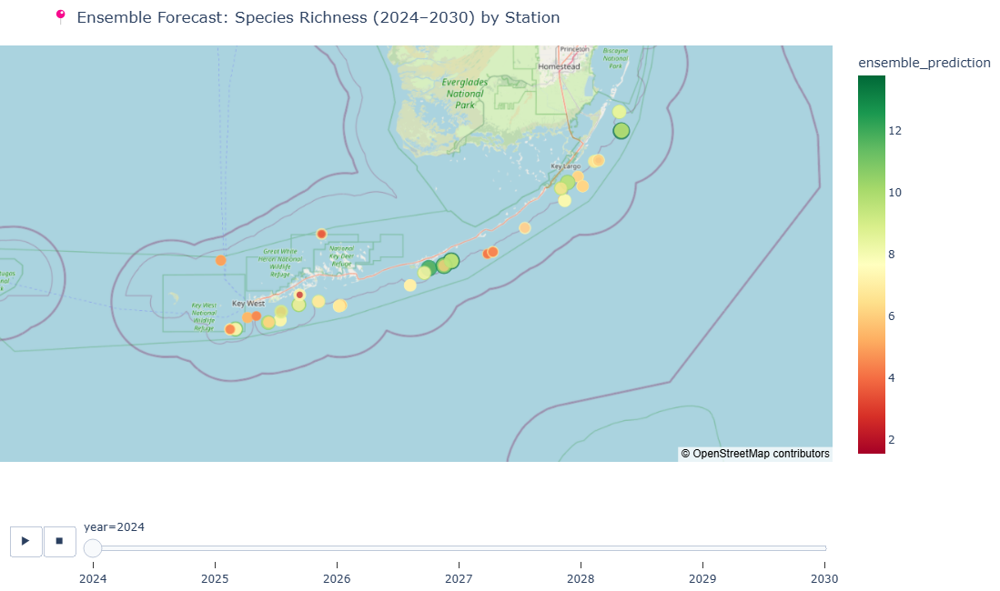

✅ Saved ensemble interactive map to: C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\ensemble_species_richness_forecast_map_2024_2030.html


In [82]:
import pandas as pd
import plotly.express as px
import os

forecast_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\ensemble_forecast_species_richness_2024_2030.csv"
features_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\merged_scor_with_features_decline.csv"
output_path = r"C:\Users\User\Desktop\Republic Coral Quest Florida\Forecast_Models_Stony\ensemble_species_richness_forecast_map_2024_2030.html"

forecast_df = pd.read_csv(forecast_path)
features_df = pd.read_csv(features_path)

coord_df = features_df[['StationID', 'latDD', 'lonDD']].drop_duplicates()
merged_df = forecast_df.merge(coord_df, on='StationID', how='left')

for col in ['latDD', 'lonDD', 'ensemble_prediction']:
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

plot_df = merged_df.dropna(subset=['latDD', 'lonDD', 'ensemble_prediction'])
plot_df = plot_df[plot_df['ensemble_prediction'] >= 0]

fig = px.scatter_mapbox(
    plot_df,
    lat="latDD",
    lon="lonDD",
    size="ensemble_prediction",
    color="ensemble_prediction",
    animation_frame="year",
    animation_group="StationID",
    hover_name="StationID",
    hover_data={
        "ensemble_prediction": True,
        "latDD": True,
        "lonDD": True
    },
    color_continuous_scale="RdYlGn",
    size_max=15,
    zoom=7.5,
    height=650,
    title="📍 Ensemble Forecast: Species Richness (2024–2030) by Station"
)

fig.update_layout(
    mapbox_style="open-street-map",
    margin={"r": 0, "t": 50, "l": 0, "b": 0}
)

fig.show()
fig.write_html(output_path)
print(f"✅ Saved ensemble interactive map to: {output_path}")
